**TÍTULO: AÇÕES DO SETOR BANCÁRIO BRASILEIRO – MODELOS PREDITIVOS DE MACHINE LEARNING EM SÉRIES TEMPORAIS**

**ALUNO: Danilo Rocha Nunes**

**Notebook referente ao Trabalho de Conclusão de Curso de pós-graduação em Ciências de Dados e Big Data pela Pontifícia Universidade Católica de Minas Gerais - PUC Minas**

### 1. DEFINIÇÃO DO PROBLEMA

Com o foco na análise de dados do mercado financeiro, propõe-se apresentar modelos de Machine Learning para predição de preços de ações do setor bancário brasileiro, discutindo-se a aplicabilidade de tais modelos na tomada de decisões de investimento. É possível afirmar que a utilização de tecnologias de inteligência artificial pode aumentar o retorno de um portfólio de investimentos?

Para realização deste trabalho foram obtidos dados públicos de cotações diárias de ações na B3 (Bolsa de Valores Brasileira), incluindo-se os volumes diários de negociações destes ativos. Em adição, foram obtidos dados públicos das cotações diárias do dólar americano (USD) e da taxa diária de juros SELIC (Sistema Especial de Liquidação e Custódia). Por último, os dados das operações diárias com ações bancárias brasileiras foram trabalhados incluindo-se indicadores de análise técnica de ações, utilizados comumente no mercado financeiro.

Este trabalho realiza uma análise exploratória sobre as cotações das principais ações do setor bancário brasileiro no período de janeiro de 2010 a março de 2021, aplicando-se na sequência modelos preditivos de Machine Learning nas séries temporais destas cotações, com o objetivo de previsão de valores futuros das ações para formação de uma carteira (portfólio) de investimento.
No desenvolvimento deste trabalho foram analisados os modelos de Machine Learning de Regressão Linear, Ridge Regression, Lasso, Elastic Net, Suport Vector Machine, Redes Neurais Artificiais Sequenciais e redes neurais artificiais LSTM – Long Shot Term Memory, os quais serão posteriormente apresentados.

Os modelos foram avaliados para predição de dados de cotações de ações do 1° dia seguinte, em um período de 30, 60, 90 dias, bem como 1 ano e 2 anos. Na sequência, mantendo-se o período de avaliação de 2 anos, foram testadas predições para a cotação da ação no 2°, 5°, 7°, 14°, 30°, 60º e 120º dia seguinte.

A partir das avaliações dos modelos de Machine Learning, o estudo foi realizado para a predição da cotação do 1º dia seguinte, em uma janela de análise de 2 anos. Assim foi definido o período de testes do modelo para os anos de 2019 e 2020, sendo os dados do período de 2010 a 2018 utilizados como base de treinamento para os modelos de Machine Learning.

A teoria econômica dos Mercados Eficientes defende que o preço atual de um ativo reflete todas as informações públicas disponíveis sobre o valor deste ativo. Assim, “a qualquer momento, o preço de mercado é a melhor estimativa do valor de uma empresa com base nas informações disponíveis” [Mankiw, 2019]. 
Em adição, a hipótese de Random Walk afirma que os preços das ações são aleatórios e seguem um caminho aleatório, não sendo possíveis prevê-los [Wikipedia, 2021].

Neste contexto, é possível prever o valor da cotação de uma ação para o dia seguinte e utilizá-la para melhorar o rendimento de uma carteira de investimentos?

O presente estudo foi elaborado com o objetivo de responder aos questionamentos levantados nesta parte introdutória. Após a realização da modelagem de algoritmos de Machine Learning será apresentada uma análise comparativa de estratégias de investimento utilizando uma carteira teórica de ativos composta pelas 04 (quatro) principais ações bancárias negociadas na bolsa de valores brasileira (BBAS – Banco do Brasil, BBDC – Bradesco, ITUB – Itaú Unibanco e SANB – Santander Brasil).


###2. COLETA DE DADOS

### 2.1 - Importando as bibliotecas necessárias ao projeto

In [365]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
#import datetime
from datetime import datetime
from pandas_datareader import data, wb

from copy import copy
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Importando os modelos
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet, ElasticNetCV
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVR
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

#Importando a biblioteca de pré processamento dos dados
from sklearn.preprocessing import MinMaxScaler

# Importando as bibliotecas de LSTM
from tensorflow import keras
from keras.utils import plot_model
from keras.models import Model
from keras import optimizers

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM, Input, Activation

#Usado para salvar o modelo
from tensorflow.keras.models import load_model

%matplotlib inline

### 2.2 - Instalando e importando biblioteca TA-LIB para análise técnica de ações

In [366]:
# download TA-Lib 
!wget http://prdownloads.sourceforge.net/ta-lib/ta-lib-0.4.0-src.tar.gz 

!tar xvzf ta-lib-0.4.0-src.tar.gz

import os

os.chdir('ta-lib') # Can't use !cd in co-lab

!./configure --prefix=/usr

!make

!make install
# wait ~ 30s

os.chdir('../')

!pip install TA-Lib

import talib as ta

--2021-04-08 16:12:11--  http://prdownloads.sourceforge.net/ta-lib/ta-lib-0.4.0-src.tar.gz
Resolving prdownloads.sourceforge.net (prdownloads.sourceforge.net)... 216.105.38.13
Connecting to prdownloads.sourceforge.net (prdownloads.sourceforge.net)|216.105.38.13|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: http://downloads.sourceforge.net/project/ta-lib/ta-lib/0.4.0/ta-lib-0.4.0-src.tar.gz [following]
--2021-04-08 16:12:11--  http://downloads.sourceforge.net/project/ta-lib/ta-lib/0.4.0/ta-lib-0.4.0-src.tar.gz
Resolving downloads.sourceforge.net (downloads.sourceforge.net)... 216.105.38.13
Reusing existing connection to prdownloads.sourceforge.net:80.
HTTP request sent, awaiting response... 302 Found
Location: https://kumisystems.dl.sourceforge.net/project/ta-lib/ta-lib/0.4.0/ta-lib-0.4.0-src.tar.gz [following]
--2021-04-08 16:12:11--  https://kumisystems.dl.sourceforge.net/project/ta-lib/ta-lib/0.4.0/ta-lib-0.4.0-src.tar.gz
Resolving kumisyst

### 2.3 - Definindo período de estudos das ações - 2010 a 2020

In [367]:
# Definir o período para importação dos valores das ações
start_date = datetime(2010,1,1)
end_date = datetime(2021,1,1)
#now = datetime.now()
#end_date = datetime(now.year,now.month,now.day)

### 2.4 - Importando dados históricos das ações de Bancos - Yahoo Finance

In [368]:
# Importar os dados das ações de bancos
BBAS = data.DataReader("BBAS3.SA",'yahoo',start_date,end_date)
BBDC = data.DataReader("BBDC4.SA",'yahoo',start_date,end_date)
ITUB = data.DataReader("ITUB4.SA",'yahoo',start_date,end_date)
SANB = data.DataReader("SANB11.SA",'yahoo',start_date,end_date)


### 2.5. Importando dados históricos das ações de Petrobras e Vale para análise comparativa - Yahoo Finance

In [369]:
# Importar os dados de PETR e VALE para análise comparativa
PETR = data.DataReader("PETR4.SA",'yahoo',start_date,end_date)
VALE = data.DataReader("VALE3.SA",'yahoo',start_date,end_date)

### 2.6. Importando dados históricos do IBOVESPA e Dólar - Yahoo Finance

In [370]:
#Importar os dados da IBOVESPA e Valores de Fechamento do Dólar
IBOV = data.DataReader("^BVSP",'yahoo',start_date,end_date)
USDBRL = data.DataReader("BRL=X",'yahoo',start_date,end_date)
USDBRL.drop('High', axis=1, inplace=True)
USDBRL.drop('Low', axis=1, inplace=True)
USDBRL.drop('Open', axis=1, inplace=True)
USDBRL.drop('Volume', axis=1, inplace=True)
USDBRL.drop('Adj Close', axis=1, inplace=True)
USDBRL.tail()

,Close
Date,
2020-12-28,5.215300
2020-12-29,5.245900
2020-12-30,5.208600
2020-12-31,5.190839
2021-01-01,5.192100


### 2.7. Importando dados econômicos - SELIC diária - API do Banco Central do Brasil

In [371]:
#Definindo função para obtenção de dados da API do Banco Central
def consulta_bc(codigo_bcb):
  url = 'http://api.bcb.gov.br/dados/serie/bcdata.sgs.{}/dados?formato=json'.format(codigo_bcb)
  df = pd.read_json(url)
  df['data'] = pd.to_datetime(df['data'], dayfirst=True)
  df.set_index('data', inplace=True)
  return df

In [372]:
#Importando a Selic Anual
selic_anual = consulta_bc(432)
selic_anual = selic_anual[selic_anual.index.year >= 2010]

In [373]:
#Importando a Selic Diária e definindo o perído de utilização
selic_diaria = consulta_bc(11)
selic_diaria = selic_diaria[selic_diaria.index.year >= start_date.year]
selic_diaria = selic_diaria[selic_diaria.index.year < end_date.year]

In [374]:
selic_diaria

,valor
data,
2010-01-04,0.032927
2010-01-05,0.032927
2010-01-06,0.032927
2010-01-07,0.032927
2010-01-08,0.032927
...,...
2020-12-24,0.007469
2020-12-28,0.007469
2020-12-29,0.007469


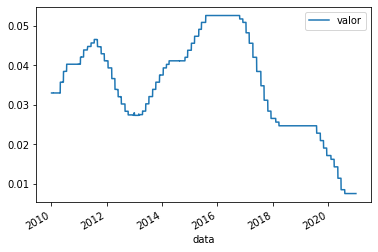

In [375]:
selic_diaria.plot()

### 3. - PROCESSAMENTO / TRATAMENTO DOS DADOS

### 3.1 - Definindo funções que serão utilizadas no curso deste Projeto

In [376]:
#Função Utilizada para Normalizar os Dados
def normalize(df):
  x = df.copy()
  for i in x.columns[0:]:
    x[i] = x[i]/x[i][0]
  return x

In [377]:
# Function to plot interactive plots using Plotly Express
def interactive_plot(df , title):
  fig = px.line(title = title)
  for i in df.columns[1:]:
    fig.add_scatter(x = df['Data'], y = df[i], name = i)
  fig.show()

In [378]:
# Function to plot interactive plots using Plotly Express
def interactive_plot_ticker_ML_result(df , stock_ticker , title):

  # Operação utilizada para ampliar o gráfico de compra e venda
  aux_df = pd.DataFrame(df[stock_ticker+ ' Decision'])
  max_value = df[stock_ticker+ ' Target Close'].max()
  min_value = df[stock_ticker+ ' Target Close'].min()

  for i in range(len(aux_df)):
    if  aux_df.iloc[i][stock_ticker+' Decision'] == 1:
      aux_df.loc[i,stock_ticker+' Decision'] = max_value + 0.8
    else:
      aux_df.loc[i,stock_ticker+' Decision'] = min_value - 0.8 #df.iloc[i][stock_ticker+ ' Target Close']


  fig = px.line(title = title)
  fig.add_scatter(x = df['Data'], y = df[stock_ticker+ ' Prediction'], name = stock_ticker+ ' - Predição', marker=dict(color="red"))
  fig.add_scatter(x = df['Data'], y = df[stock_ticker+ ' Target Close'], name = stock_ticker+ ' - Alvo Fechamento', marker=dict(color="blue"))
  fig.add_scatter(x = df['Data'], y = aux_df[stock_ticker+ ' Decision'], name = stock_ticker+ ' - Na Carteira - Sombra Acima', marker=dict(color="green"),fill='tonextx')
  #fig.update_layout(legend=dict(yanchor="top", y=0.01, xanchor="left", x=0.01))
  fig.show()

In [379]:
# Função para plotar o retorno do portfolio
def interactive_plot_portfolio_return (df, title):
  fig = px.line(title = title)
  fig.add_scatter(x = df['Data'],
                  y = df['Portfolio ML Return'],
                  name = 'Machine Learning - Retorno acumulado do Portfolio (%)',
                  marker=dict(color="green"))
  fig.add_scatter(x = df['Data'],
                  y = df['Portfolio BuyHoldFirstBuy Return'],
                  name = 'Buy and Hold primeira compra - Retorno acumulado do Portfolio (%)',
                  marker=dict(color="purple"))
  fig.add_scatter(x = df['Data'],
                  y = df['Portfolio BuyHoldFirstDay Return'],
                  name = 'Buy and Hold primeiro dia - Retorno acumulado do portfolio (%)',
                  marker=dict(color="brown"))
  #fig.update_layout(legend=dict(yanchor="top", y=0.01, xanchor="left", x=0.01))
  fig.show()

In [380]:
# Função para plotar o retorno do portfolio
def interactive_plot_stock_return (df, stock_ticker, title):
  fig = px.line(title = title)
  fig.add_scatter(x = df['Data'],
                  y = df[stock_ticker+ ' ML'],
                  name = stock_ticker+ ' - Retorno acumulado ML (%)',
                  marker=dict(color="green"))
  fig.add_scatter(x = df['Data'],
                  y = df[stock_ticker+ ' BuyHoldFirstBuy'],
                  name = stock_ticker+ ' - Retorno acumulado Buy and Hold primeira compra (%)',
                  marker=dict(color="purple"))
  fig.add_scatter(x = df['Data'],
                  y = df[stock_ticker+ ' BuyHoldFirstDay'],
                  name = stock_ticker+ ' - Retorno acumulado Buy and Hold primeiro dia (%)',
                  marker=dict(color="brown"))
  #fig.update_layout(legend=dict(yanchor="top", y=0.01, xanchor="left", x=0.01))
  fig.show()

In [381]:
"""# Function to plot interactive plots using Plotly Express
def interactive_plot_ticker_ML_return(df , stock_ticker, title):

  return_df = pd.DataFrame()
  stock_return_ML = 0
  stock_return_first_day = 0
  stock_return_first_buy = 0
  number_buy_operations = 0
  first_buy = -1

  for i in range(len(df)):
    if df.iloc[i][stock_ticker+' Decision'] == 1:
      if number_buy_operations == 0:
        first_buy = i
      number_buy_operations = number_buy_operations+1
      stock_return_ML = stock_return_ML + df.iloc[i][stock_ticker+' Target Close'] - df.iloc[i][stock_ticker+' Close']
    if first_buy >= 0:
      stock_return_first_buy = stock_return_first_buy + df.iloc[i][stock_ticker+' Target Close'] - df.iloc[i][stock_ticker+' Close']
      return_df.loc[i,stock_ticker+' Acumulated Return ML'] = 100*(stock_return_ML/df.iloc[first_buy][stock_ticker+' Close'])
      return_df.loc[i,stock_ticker+' Acumulated Return First Buy'] = 100*(stock_return_first_buy/df.iloc[first_buy][stock_ticker+' Close'])
    else:
      return_df.loc[i,stock_ticker+' Acumulated Return ML'] = 100*(stock_return_ML/df.iloc[0][stock_ticker+' Close'])
      return_df.loc[i,stock_ticker+' Acumulated Return First Buy'] = 100*(stock_return_first_buy/df.iloc[0][stock_ticker+' Close'])
    stock_return_first_day = stock_return_first_day + df.iloc[i][stock_ticker+' Target Close'] - df.iloc[i][stock_ticker+' Close']
    return_df.loc[i,stock_ticker+' Acumulated Return First Day'] = 100*(stock_return_first_day/df.iloc[0][stock_ticker+' Close'])

  fig = px.line(title = title)
  fig.add_scatter(x = df['Data'],
                  y = return_df[stock_ticker+ ' Acumulated Return ML'],
                  name = stock_ticker+ ' - Retorno acumulado ML (%)',
                  marker=dict(color="green"))
  fig.add_scatter(x = df['Data'],
                  y = return_df[stock_ticker+ ' Acumulated Return First Buy'],
                  name = stock_ticker+ ' - Retorno acumulado primeira compra (%)',
                  marker=dict(color="purple"))
  fig.add_scatter(x = df['Data'],
                  y = return_df[stock_ticker+ ' Acumulated Return First Day'],
                  name = stock_ticker+ ' - Retorno acumulado primeiro dia (%)',
                  marker=dict(color="brown"))
  fig.show()
  return return_df"""

'# Function to plot interactive plots using Plotly Express\ndef interactive_plot_ticker_ML_return(df , stock_ticker, title):\n\n  return_df = pd.DataFrame()\n  stock_return_ML = 0\n  stock_return_first_day = 0\n  stock_return_first_buy = 0\n  number_buy_operations = 0\n  first_buy = -1\n\n  for i in range(len(df)):\n    if df.iloc[i][stock_ticker+\' Decision\'] == 1:\n      if number_buy_operations == 0:\n        first_buy = i\n      number_buy_operations = number_buy_operations+1\n      stock_return_ML = stock_return_ML + df.iloc[i][stock_ticker+\' Target Close\'] - df.iloc[i][stock_ticker+\' Close\']\n    if first_buy >= 0:\n      stock_return_first_buy = stock_return_first_buy + df.iloc[i][stock_ticker+\' Target Close\'] - df.iloc[i][stock_ticker+\' Close\']\n      return_df.loc[i,stock_ticker+\' Acumulated Return ML\'] = 100*(stock_return_ML/df.iloc[first_buy][stock_ticker+\' Close\'])\n      return_df.loc[i,stock_ticker+\' Acumulated Return First Buy\'] = 100*(stock_return_first_b

In [382]:
# Function to plot interactive plots using Plotly Express
def interactive_plot_index(df , title):
  fig = px.line(title = title)
  for i in df.columns[0:]:
    fig.add_scatter(x = df.index, y = df[i], name = i)
  fig.show()

In [383]:
#Plotagem dos dados de treinamento e teste
def plot_data_train_test_prediction(df_stock,df_predicted,stock_ticker,split,forecast_target):
  fig = px.line(title=stock_ticker+' - Dados de treinamento x Dados de teste X Dados de Predição')
  fig.add_scatter(x = df_stock[stock_ticker]['Close'][:split+forecast_target+1].index, y = df_stock[stock_ticker]['Close'][:split+forecast_target+1], name = 'Dados de Treinamento - '+stock_ticker,marker=dict(color="green"))
  #fig.add_scatter(x = df_stock[stock_ticker][:split+forecast_target+1].index, y = df_stock[stock_ticker][:split+forecast_target+1], name = 'Dados de Treinamento - '+stock_ticker,marker=dict(color="green"))
  fig.add_scatter(x = df_predicted['Target Close'].index, y = df_predicted['Target Close'], name = 'Dados de Fechamento - '+stock_ticker,marker=dict(color="blue"))
  fig.add_scatter(x = df_predicted['Prediction'].index, y = df_predicted['Prediction'], name = 'Dados de Predição - '+stock_ticker,marker=dict(color="red"))
  fig.show()
"""
  plt.figure(figsize=(20,10))
  plt.title(stock_ticker+' - Dados de treinamento x Dados de teste X Dados de Predição')
  plt.plot(df_stock[stock_ticker][:split+forecast_target], color='green', label = 'Dados de Treinamento - '+stock_ticker)
  plt.plot(df_predicted['Close'], color='blue', label = 'Dados de Teste - '+stock_ticker)
  plt.plot(df_predicted['Prediction'], color='red', label = 'Predição - '+stock_ticker)
  plt.xlabel('Período')
  plt.ylabel('Preço de fechamento')
  plt.legend()
  plt.grid(True)
  plt.show()"""

"\n  plt.figure(figsize=(20,10))\n  plt.title(stock_ticker+' - Dados de treinamento x Dados de teste X Dados de Predição')\n  plt.plot(df_stock[stock_ticker][:split+forecast_target], color='green', label = 'Dados de Treinamento - '+stock_ticker)\n  plt.plot(df_predicted['Close'], color='blue', label = 'Dados de Teste - '+stock_ticker)\n  plt.plot(df_predicted['Prediction'], color='red', label = 'Predição - '+stock_ticker)\n  plt.xlabel('Período')\n  plt.ylabel('Preço de fechamento')\n  plt.legend()\n  plt.grid(True)\n  plt.show()"

In [384]:
#Função para impressão de indicadores do modelo
def print_model_scores(model_title,y_test,predicted):
  
  # Calculo do R2 Score
  print(model_title+" - R2 Score: ", r2_score(y_test,predicted))
  print('\n')
  #Cálculo do erro
  print(model_title+' - MAE: ', mean_absolute_error(y_test,predicted))
  print(model_title+' - MSE: ', mean_squared_error(y_test,predicted))
  print(model_title+' - RMSE: ', np.sqrt(mean_squared_error(y_test,predicted)))

In [385]:
#Função para impressão de indicadores do modelo
def assign_model_scores(model_title,y_test,predicted, stock_ticker_id, df):
  df = df.append({'1 - Metric':model_title,
                  '2 - '+stock_ticker_id+' - R2 Score': r2_score(y_test,predicted),
                  '3 - '+stock_ticker_id+' - MAE': mean_absolute_error(y_test,predicted),
                  '4 - '+stock_ticker_id+' - MSE': mean_squared_error(y_test,predicted),
                  '5 - '+stock_ticker_id+' - RMSE': np.sqrt(mean_squared_error(y_test,predicted))}, ignore_index=True)

  return df

In [386]:
def assign_model_scores_values(model_title,r2_score,MAE,MSE,RMSE, stock_ticker_id, df):
  df = df.append({'1 - Metric':model_title,
                  '2 - '+stock_ticker_id+' - R2 Score': r2_score,
                  '3 - '+stock_ticker_id+' - MAE': MAE,
                  '4 - '+stock_ticker_id+' - MSE': MSE,
                  '5 - '+stock_ticker_id+' - RMSE': RMSE}, ignore_index=True)

  return df

In [387]:
#Definindo uma função para criar o DataFrame com preço de fechamento
def individual_stock_close(dados, name):
  return pd.DataFrame({'Close':dados[name]['Close']})

In [388]:
#Definindo uma função para criar o DataFrame com preço de fechamento
def individual_stock_close_volume(dados, name):
  return pd.DataFrame({'Close':dados[name]['Close'],
                       'Volume':dados[name]['Volume']})

In [389]:
"""#Definindo uma função para criar o DataFrame com Data, Preço, Volume e Selic para uma ação específica
def individual_stock_close_volume_selic(dados, name):
  return pd.DataFrame({'Close':dados[name]['Close'],'Volume':dados[name]['Volume'],'Selic':dados['Selic']['Close']})"""

"#Definindo uma função para criar o DataFrame com Data, Preço, Volume e Selic para uma ação específica\ndef individual_stock_close_volume_selic(dados, name):\n  return pd.DataFrame({'Close':dados[name]['Close'],'Volume':dados[name]['Volume'],'Selic':dados['Selic']['Close']})"

In [390]:
#Definindo uma função para criar o DataFrame com Data, Preço, Volume e Dolar para uma ação específica
def individual_stock_close_volume_dolar(dados, name):
  return pd.DataFrame({'Close':dados[name]['Close'],
                       'Volume':dados[name]['Volume'],
                       'Dolar':dados['USD']['Close']})

In [391]:
#Definindo uma função para criar o DataFrame com Data, Preço, Volume e Selic para uma ação específica
def individual_stock_close_volume_selic_dolar(dados, name):
  return pd.DataFrame({'Close':dados[name]['Close'],
                       'Volume':dados[name]['Volume'],
                       'Selic':dados['Selic']['Close'],
                       'Dolar':dados['USD']['Close']})

In [392]:
#Definindo uma função para criar o DataFrame com Data, Preço, Volume, Selic, Retorno e Média Móvel 7 dias
def individual_stock_technical_features(dados, name):
  df = pd.DataFrame();
  df['EMAClose'] = ta.EMA(dados[name]['Close'],timeperiod=7) # Média Móvel Exponencial de 7 dias de fechamento - Exponencial Moving Average
  df['EMAOpen'] = ta.EMA(dados[name]['Open'],timeperiod=7) # Média Móvel Exponencial de 7 dias de abertura - Exponencial Moving Average
  df['EMAHigh'] = ta.EMA(dados[name]['High'],timeperiod=7) # Média Móvel Exponencial de 7 dias de maior valor - Exponencial Moving Average
  df['EMALow'] = ta.EMA(dados[name]['Low'],timeperiod=7) # Média Móvel Exponencial de 7 dias de menor valor - Exponencial Moving Average
  df['RSI'] = ta.RSI(df['EMAClose'],timeperiod=14) #Índice de Força Relativa - Relative Strenght Index
  df['WILLR'] = ta.WILLR(df['EMAHigh'], df['EMALow'], df['EMAClose'],timeperiod=14) #Índice de Força Relativa - Relative Strenght Index
  df['MACD'], df['MACDsignal'], df['MACDhist'] = ta.MACD(df['EMAClose'], fastperiod=12, slowperiod=26,signalperiod=9) #Convergência Divergência da Média Móvel = Moving Average Convergence Divergence
  #df['MACD'], df['MACDsignal'], df['MACDhist'] = ta.MACD(df['EMAClose'], fastperiod=14, slowperiod=24,signalperiod=14) #Convergência Divergência da Média Móvel = Moving Average Convergence Divergence
  df['OBV'] = ta.OBV(df['EMAClose'], dados[name]['Volume']) # Volume Balanceado - On Balance Volume
  df['ROC'] = ta.ROC(df['EMAClose'],timeperiod=14) #Taxa de Alteração de Preço - Price Rate of Change
  df['fastk'],df['fastd'] = ta.STOCHRSI(df['EMAClose'],timeperiod=14,fastk_period=5,fastd_period=3,fastd_matype=0) # Oscilador Estocástico

  #Preenchendo as informações faltantes
  df.fillna(method='ffill',inplace=True)
  df.fillna(method='bfill',inplace=True)

  return pd.DataFrame({'Close': dados[name]['Close'],
                       'RSI' : df['RSI'],
                       'WILLR' : df['WILLR'],
                       'MACD' : df['MACD'],
                       'MACDsignal' : df['MACDsignal'],
                       'MACDhist' : df['MACDhist'],
                       'OBV' : df['OBV'],
                       'ROC' : df['ROC'],
                       'fastk' : df['fastk'],
                       'fastd' : df['fastd']})

In [393]:
#Definindo uma função para criar o DataFrame com Data, Preço, Volume, Selic, Retorno e Média Móvel 7 dias
def individual_stock_tech_all_features(dados, name):
  df = pd.DataFrame();
  df['EMAClose'] = ta.EMA(dados[name]['Close'],timeperiod=7) # Média Móvel Exponencial de 7 dias de fechamento - Exponencial Moving Average
  df['EMAOpen'] = ta.EMA(dados[name]['Open'],timeperiod=7) # Média Móvel Exponencial de 7 dias de abertura - Exponencial Moving Average
  df['EMAHigh'] = ta.EMA(dados[name]['High'],timeperiod=7) # Média Móvel Exponencial de 7 dias de maior valor - Exponencial Moving Average
  df['EMALow'] = ta.EMA(dados[name]['Low'],timeperiod=7) # Média Móvel Exponencial de 7 dias de menor valor - Exponencial Moving Average
  df['RSI'] = ta.RSI(df['EMAClose'],timeperiod=14) #Índice de Força Relativa - Relative Strenght Index
  df['WILLR'] = ta.WILLR(df['EMAHigh'], df['EMALow'], df['EMAClose'],timeperiod=14) #Índice de Força Relativa - Relative Strenght Index
  df['MACD'], df['MACDsignal'], df['MACDhist'] = ta.MACD(df['EMAClose'], fastperiod=12, slowperiod=26,signalperiod=9) #Convergência Divergência da Média Móvel = Moving Average Convergence Divergence
  #df['MACD'], df['MACDsignal'], df['MACDhist'] = ta.MACD(df['EMAClose'], fastperiod=14, slowperiod=24,signalperiod=14) #Convergência Divergência da Média Móvel = Moving Average Convergence Divergence
  df['OBV'] = ta.OBV(df['EMAClose'], dados[name]['Volume']) # Volume Balanceado - On Balance Volume
  df['ROC'] = ta.ROC(df['EMAClose'],timeperiod=14) #Taxa de Alteração de Preço - Price Rate of Change
  df['fastk'],df['fastd'] = ta.STOCHRSI(df['EMAClose'],timeperiod=14,fastk_period=5,fastd_period=3,fastd_matype=0) # Oscilador Estocástico

  #Preenchendo as informações faltantes
  df.fillna(method='ffill',inplace=True)
  df.fillna(method='bfill',inplace=True)

  return pd.DataFrame({'Close': dados[name]['Close'],
                       'EMAClose': df['EMAClose'],
                       'EMAOpen': df['EMAOpen'],
                       'EMAHigh': df['EMAHigh'],
                       'EMALow' : df['EMALow'],
                       'RSI' : df['RSI'],
                       'WILLR' : df['WILLR'],
                       'MACD' : df['MACD'],
                       'MACDsignal' : df['MACDsignal'],
                       'MACDhist' : df['MACDhist'],
                       'OBV' : df['OBV'],
                       'ROC' : df['ROC'],
                       'fastk' : df['fastk'],
                       'fastd' : df['fastd']})

In [394]:
#Definindo uma função para criar o DataFrame com Data, Preço, Volume, Selic, Retorno e Média Móvel 7 dias
def individual_stock_all_features(dados, name):
  df = pd.DataFrame();
  df['EMAClose'] = ta.EMA(dados[name]['Close'],timeperiod=7) # Média Móvel Exponencial de 7 dias de fechamento - Exponencial Moving Average
  df['EMAOpen'] = ta.EMA(dados[name]['Open'],timeperiod=7) # Média Móvel Exponencial de 7 dias de abertura - Exponencial Moving Average
  df['EMAHigh'] = ta.EMA(dados[name]['High'],timeperiod=7) # Média Móvel Exponencial de 7 dias de maior valor - Exponencial Moving Average
  df['EMALow'] = ta.EMA(dados[name]['Low'],timeperiod=7) # Média Móvel Exponencial de 7 dias de menor valor - Exponencial Moving Average
  df['RSI'] = ta.RSI(df['EMAClose'],timeperiod=14) #Índice de Força Relativa - Relative Strenght Index
  df['WILLR'] = ta.WILLR(df['EMAHigh'], df['EMALow'], df['EMAClose'],timeperiod=14) #Índice de Força Relativa - Relative Strenght Index
  df['MACD'], df['MACDsignal'], df['MACDhist'] = ta.MACD(df['EMAClose'], fastperiod=12, slowperiod=26,signalperiod=9) #Convergência Divergência da Média Móvel = Moving Average Convergence Divergence
  #df['MACD'], df['MACDsignal'], df['MACDhist'] = ta.MACD(df['EMAClose'], fastperiod=14, slowperiod=24,signalperiod=14) #Convergência Divergência da Média Móvel = Moving Average Convergence Divergence
  df['OBV'] = ta.OBV(df['EMAClose'], dados[name]['Volume']) # Volume Balanceado - On Balance Volume
  df['ROC'] = ta.ROC(df['EMAClose'],timeperiod=14) #Taxa de Alteração de Preço - Price Rate of Change
  df['fastk'],df['fastd'] = ta.STOCHRSI(df['EMAClose'],timeperiod=14,fastk_period=5,fastd_period=3,fastd_matype=0) # Oscilador Estocástico
  df['Return'] = pd.DataFrame(dados[name]['Close'].pct_change() * 100)

  #Preenchendo as informações faltantes
  df.fillna(method='ffill',inplace=True)
  df.fillna(method='bfill',inplace=True)

  return pd.DataFrame({'Close': dados[name]['Close'],
                       'Volume': dados[name]['Volume'],
                       'Selic': dados['Selic']['Close'],
                       'Dolar': dados['USD']['Close'],
                       'Return': df['Return'],
                       'EMAClose': df['EMAClose'],
                       'EMAOpen': df['EMAOpen'],
                       'EMAHigh': df['EMAHigh'],
                       'EMALow' : df['EMALow'],
                       'RSI' : df['RSI'],
                       'WILLR' : df['WILLR'],
                       'MACD' : df['MACD'],
                       'MACDsignal' : df['MACDsignal'],
                       'MACDhist' : df['MACDhist'],
                       'OBV' : df['OBV'],
                       'ROC' : df['ROC'],
                       'fastk' : df['fastk'],
                       'fastd' : df['fastd']})

In [395]:
#Criar uma função para definir o retorno diário
def stock_return_function(data,dados,stock_ticker_id,split):
  n = 1
  data['Return'] = dados[stock_ticker_id]['Close']-data['Open']
  return data

In [396]:
#Criar uma função para definir o ALVO da análise com base no valor de fechamento e na janela de dias para predição (n)
def trading_window(data,n_days):
  #n = 1
  data['Target'] = data[['Close']].shift(-n_days)
  return data

In [397]:
#Define a data plotting function
def show_plot(data,title):
  plt.figure(figsize= (13,5))
  plt.plot(data, linewidth = 3)
  plt.title(title)
  plt.legend(loc="upper left")
  plt.grid()

In [398]:
#Calcula o retorno usando o algoritmo
def Portfolio_return_ML_x_BuyHold(df_portfolio,stock_list):
  stock_return_dict = []
  portfolio_return_ML = []
  portfolio_return_BuyHoldFirstBuy = []
  portfolio_return_BuyHoldFirstDay = []
  portfolio_return_df = pd.DataFrame()
  portfolio_return_df['Data'] = df_portfolio['Data']

  for i_stock in stock_list:
    stock_return_Buy_Hold_first_day = []
    stock_return_ML = []
    stock_return_Buy_Hold_first_buy = []
    number_buy_operations = 0
    number_days_in_portfolio = 0
    number_day_markets = 0
    stock_return = 0
    first_buy = 0

    i=0
    for i in range(len(df_portfolio)):
      number_day_markets = number_day_markets +1

      if df_portfolio.iloc[i][i_stock+' Decision'] == 1:
        if number_buy_operations == 0:
          first_buy = i
        if i == 0:
          number_buy_operations = number_buy_operations+1
        elif df_portfolio.iloc[i-1][i_stock+' Decision'] == 0:
          number_buy_operations = number_buy_operations+1
        number_days_in_portfolio = number_days_in_portfolio+1
        stock_return = stock_return + df_portfolio.iloc[i][i_stock+' Target Close']-df_portfolio.iloc[i][i_stock+' Close']
      
      # Atribuindo os valores de retorno ao DataFrame de Retorno
      stock_return_Buy_Hold_first_day.append(100*(df_portfolio.iloc[i][i_stock+' Target Close']-df_portfolio.iloc[0][i_stock+' Close'])/df_portfolio.iloc[0][i_stock+' Close'])
      stock_return_ML.append(100*stock_return/df_portfolio.iloc[first_buy][i_stock+' Close'])
      if number_buy_operations > 0:
        stock_return_Buy_Hold_first_buy.append(100*(df_portfolio.iloc[i][i_stock+' Target Close']-df_portfolio.iloc[first_buy][i_stock+' Close'])/df_portfolio.iloc[first_buy][i_stock+' Close'])
      else:
        stock_return_Buy_Hold_first_buy.append(0)
    
    #Criando o dicionário com os resultados comparativos
    stock_return_dict.append({i_stock+'- 1-1 - Retorno - Machine Learning (%)': 100*stock_return/df_portfolio.iloc[first_buy][i_stock+' Close'],
                              i_stock+'- 1-2 - Retorno - Buy and Hold - Primeira Compra (%)' : 100*(df_portfolio.iloc[-1][i_stock+' Target Close']-df_portfolio.iloc[first_buy][i_stock+' Close'])/df_portfolio.iloc[first_buy][i_stock+' Close'],
                              i_stock+'- 1-3 - Retorno - Buy and Hold - Primeiro Dia (%)' : 100*(df_portfolio.iloc[-1][i_stock+' Target Close']-df_portfolio.iloc[0][i_stock+' Close'])/df_portfolio.iloc[0][i_stock+' Close'],
                              i_stock+'- 2-1 - Número de ciclos de compra e venda' : number_buy_operations,
                              i_stock+'- 2-2 - Número de dias com ação na carteira' : number_days_in_portfolio,
                              i_stock+'- 2-3 - Número de dias de negociações' : number_day_markets,
                              i_stock+'- 3- - Primeira Data de Compra' : str(df_portfolio.iloc[first_buy]['Data'].day)+'/'+str(df_portfolio.iloc[first_buy]['Data'].month)+'/'+str(df_portfolio.iloc[first_buy]['Data'].year),
                              i_stock+'- 4-1 - Valor de Fechamento (Close) - Primeiro Dia' : df_portfolio.iloc[0][i_stock+' Close'],
                              i_stock+'- 4-2 - Valor de Fechamento (Close) - Primeira Compra' : df_portfolio.iloc[first_buy][i_stock+' Close'],
                              i_stock+'- 4-3 - Valor de Fechamento (Close) - Último Dia' : df_portfolio.iloc[-1][i_stock+' Target Close'],})
    portfolio_return_df[i_stock+' ML'] = stock_return_ML
    portfolio_return_df[i_stock+' BuyHoldFirstBuy'] = stock_return_Buy_Hold_first_buy
    portfolio_return_df[i_stock+' BuyHoldFirstDay'] = stock_return_Buy_Hold_first_day

  # Preencher o DataFrame com os resultados para o portfolio
  for i in range(len(df_portfolio)):
    return_ML_i = 0
    return_BuyHoldFirstBuy_i = 0
    return_BuyHoldFirstDay_i = 0
    for i_stock in stock_list:
      return_ML_i = return_ML_i + portfolio_return_df.iloc[i][i_stock+' ML']
      return_BuyHoldFirstBuy_i = return_BuyHoldFirstBuy_i + portfolio_return_df.iloc[i][i_stock+' BuyHoldFirstBuy']
      return_BuyHoldFirstDay_i = return_BuyHoldFirstDay_i + portfolio_return_df.iloc[i][i_stock+' BuyHoldFirstDay']
    portfolio_return_ML.append(return_ML_i/len(stock_list))
    portfolio_return_BuyHoldFirstBuy.append(return_BuyHoldFirstBuy_i/len(stock_list))
    portfolio_return_BuyHoldFirstDay.append(return_BuyHoldFirstDay_i/len(stock_list))
  
  portfolio_return_df['Portfolio ML Return'] = portfolio_return_ML
  portfolio_return_df['Portfolio BuyHoldFirstBuy Return'] = portfolio_return_BuyHoldFirstBuy
  portfolio_return_df['Portfolio BuyHoldFirstDay Return'] = portfolio_return_BuyHoldFirstDay

  return portfolio_return_df, stock_return_dict

In [399]:
"""# Criar um dataframe baseado nas datas e nos valores individuais das ações
def create_df_portfolio (df_portfolio, df_bank_price, df_bank_price_target, stock_list, i_stock,split,forecast_target,y_test,predicted_prices_stock_portfolio):

  print(i_stock)
  print(stock_list[0])
  if i_stock == stock_list[0]:
    df_portfolio = pd.DataFrame(df_bank_price[split+forecast_target:].index)
  df_portfolio[i_stock+' Close'] = df_bank_price_target['Close'][split+forecast_target-1:].values
  df_portfolio[i_stock+' Target Close'] = pd.DataFrame(y_test)
  df_portfolio[i_stock+' Prediction'] = pd.DataFrame(predicted_prices_stock_portfolio)
  for i in range(len(df_portfolio)):
    if  df_portfolio.iloc[i][i_stock+' Prediction'] > df_portfolio.iloc[i][i_stock+' Close']:
      df_portfolio.loc[i,i_stock+' Decision'] = 1
    else:
      df_portfolio.loc[i,i_stock+' Decision'] = 0"""

"# Criar um dataframe baseado nas datas e nos valores individuais das ações\ndef create_df_portfolio (df_portfolio, df_bank_price, df_bank_price_target, stock_list, i_stock,split,forecast_target,y_test,predicted_prices_stock_portfolio):\n\n  print(i_stock)\n  print(stock_list[0])\n  if i_stock == stock_list[0]:\n    df_portfolio = pd.DataFrame(df_bank_price[split+forecast_target:].index)\n  df_portfolio[i_stock+' Close'] = df_bank_price_target['Close'][split+forecast_target-1:].values\n  df_portfolio[i_stock+' Target Close'] = pd.DataFrame(y_test)\n  df_portfolio[i_stock+' Prediction'] = pd.DataFrame(predicted_prices_stock_portfolio)\n  for i in range(len(df_portfolio)):\n    if  df_portfolio.iloc[i][i_stock+' Prediction'] > df_portfolio.iloc[i][i_stock+' Close']:\n      df_portfolio.loc[i,i_stock+' Decision'] = 1\n    else:\n      df_portfolio.loc[i,i_stock+' Decision'] = 0"

### 3.1. Criando a base de dados

In [400]:
# Definindo os indicadores das cotações
tickers = ['BBAS','BBDC','ITUB','SANB','IBOV','PETR','VALE','USD','Selic']
tickers

['BBAS', 'BBDC', 'ITUB', 'SANB', 'IBOV', 'PETR', 'VALE', 'USD', 'Selic']

In [401]:
# Concatenando os dados em uma única estrutura
dados = pd.concat([BBAS,BBDC,ITUB,SANB,IBOV,PETR,VALE,USDBRL,selic_diaria],axis=1,keys=tickers)
dados.head()

BBAS                        ...       VALE     USD     Selic
                 High        Low       Open  ...  Adj Close   Close     valor
2010-01-04  30.000000  29.700001  29.799999  ...  32.089706  1.7190  0.032927
2010-01-05  30.100000  29.190001  30.100000  ...  32.388855  1.7370  0.032927
2010-01-06  30.000000  29.420000  29.490000  ...  33.074394  1.7315  0.032927
2010-01-07  29.709999  29.410000  29.440001  ...  33.211502  1.7389  0.032927
2010-01-08  29.820000  29.469999  29.700001  ...  33.535576  1.7320  0.032927

[5 rows x 44 columns]

In [402]:
dados.columns.names = ['Bank Ticker','Stock Info']
dados.index.name = 'Data'
dados.head()

Bank Ticker       BBAS                        ...       VALE     USD     Selic
Stock Info        High        Low       Open  ...  Adj Close   Close     valor
Data                                          ...                             
2010-01-04   30.000000  29.700001  29.799999  ...  32.089706  1.7190  0.032927
2010-01-05   30.100000  29.190001  30.100000  ...  32.388855  1.7370  0.032927
2010-01-06   30.000000  29.420000  29.490000  ...  33.074394  1.7315  0.032927
2010-01-07   29.709999  29.410000  29.440001  ...  33.211502  1.7389  0.032927
2010-01-08   29.820000  29.469999  29.700001  ...  33.535576  1.7320  0.032927

[5 rows x 44 columns]

In [403]:
dados.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3186 entries, 2010-01-04 to 2021-01-01
Data columns (total 44 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   (BBAS, High)       2725 non-null   float64
 1   (BBAS, Low)        2725 non-null   float64
 2   (BBAS, Open)       2725 non-null   float64
 3   (BBAS, Close)      2725 non-null   float64
 4   (BBAS, Volume)     2725 non-null   float64
 5   (BBAS, Adj Close)  2725 non-null   float64
 6   (BBDC, High)       2725 non-null   float64
 7   (BBDC, Low)        2725 non-null   float64
 8   (BBDC, Open)       2725 non-null   float64
 9   (BBDC, Close)      2725 non-null   float64
 10  (BBDC, Volume)     2725 non-null   float64
 11  (BBDC, Adj Close)  2725 non-null   float64
 12  (ITUB, High)       2725 non-null   float64
 13  (ITUB, Low)        2725 non-null   float64
 14  (ITUB, Open)       2725 non-null   float64
 15  (ITUB, Close)      2725 non-null   float64
 16  (ITUB,

### 3.2. Trabalhando os dados faltantes (feriados nacionais, internacionais, dados faltantes de alguns ativos)

In [404]:
# Verificação inicial de dados faltantes
dados.isnull().value_counts()

(BBAS, High)  (BBAS, Low)  (BBAS, Open)  (BBAS, Close)  (BBAS, Volume)  (BBAS, Adj Close)  (BBDC, High)  (BBDC, Low)  (BBDC, Open)  (BBDC, Close)  (BBDC, Volume)  (BBDC, Adj Close)  (ITUB, High)  (ITUB, Low)  (ITUB, Open)  (ITUB, Close)  (ITUB, Volume)  (ITUB, Adj Close)  (SANB, High)  (SANB, Low)  (SANB, Open)  (SANB, Close)  (SANB, Volume)  (SANB, Adj Close)  (IBOV, High)  (IBOV, Low)  (IBOV, Open)  (IBOV, Close)  (IBOV, Volume)  (IBOV, Adj Close)  (PETR, High)  (PETR, Low)  (PETR, Open)  (PETR, Close)  (PETR, Volume)  (PETR, Adj Close)  (VALE, High)  (VALE, Low)  (VALE, Open)  (VALE, Close)  (VALE, Volume)  (VALE, Adj Close)  (USD, Close)  (Selic, valor)
False         False        False         False          False           False              False         False        False         False          False           False              False         False        False         False          False           False              False         False        False         False          False

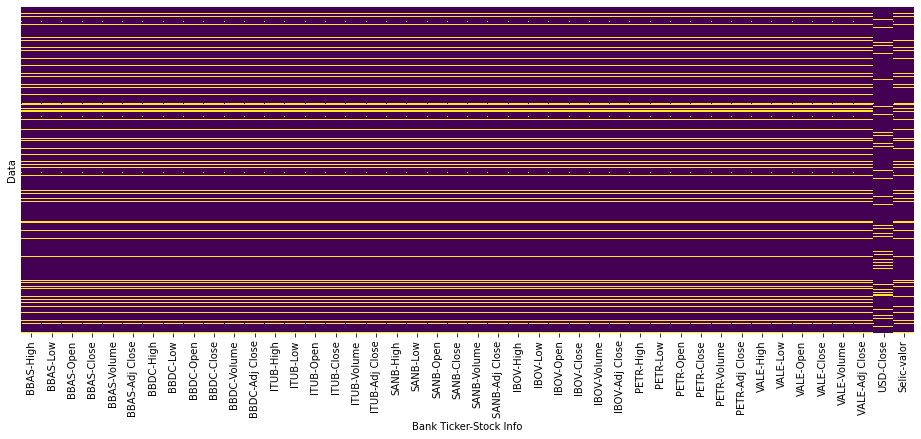

In [405]:
plt.figure(figsize = (16,6))
sns.heatmap(dados.isnull(),yticklabels=False,cbar=False,cmap='viridis')

### 3.2.1 - US Dólar - dados faltantes

In [406]:
#Verificando a data onde o dólar é nulo
dados[dados['USD']['Close'].isnull()==True]

Bank Ticker       BBAS                        ...       VALE   USD     Selic
Stock Info        High        Low       Open  ...  Adj Close Close     valor
Data                                          ...                           
2010-04-09   31.100000  30.520000  30.809999  ...  36.950844   NaN  0.032927
2010-04-16   30.900000  30.350000  30.610001  ...  36.736004   NaN  0.032927
2010-04-23   29.930000  29.389999  29.520000  ...  35.399120   NaN  0.032890
2010-04-30   30.400000  29.610001  29.870001  ...  33.327900   NaN  0.035657
2010-05-07   28.000000  26.379999  27.910000  ...  31.193907   NaN  0.035657
...                ...        ...        ...  ...        ...   ...       ...
2020-09-25   30.480000  29.969999  30.240000  ...  56.695858   NaN  0.007469
2020-10-02   30.740000  29.309999  29.410000  ...  55.805950   NaN  0.007469
2020-10-09   31.670000  30.629999  31.110001  ...  58.944553   NaN  0.007469
2020-10-16   31.020000  30.250000  30.910000  ...  59.556969   NaN  0.007469
2020-10-23   34.290001  33.330002  33.669998  ...  60.714806   NaN  0.007469

[342 rows x 44 columns]

In [407]:
# Preencher o valor faltante do dólar com o último valor disponível
dados['USD']['Close'].fillna(method='ffill',inplace=True)

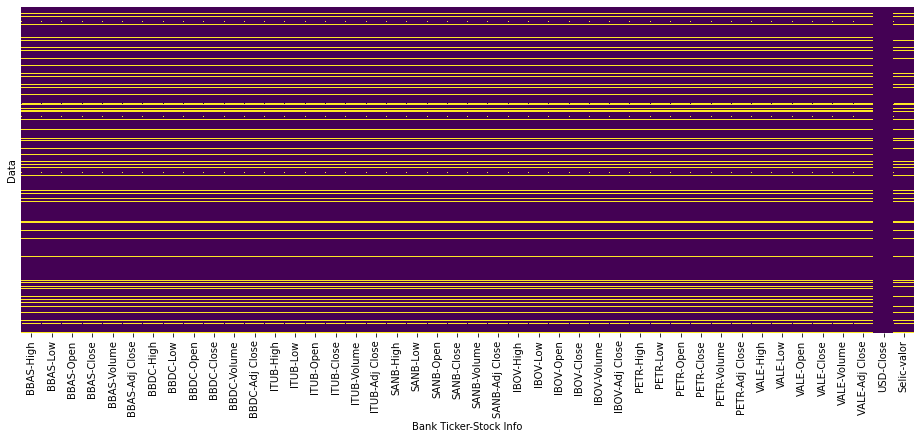

In [408]:
plt.figure(figsize = (16,6))
sns.heatmap(dados.isnull(),yticklabels=False,cbar=False,cmap='viridis')

In [409]:
#Verificando novamente os dados nulos
dados.isnull().value_counts()

(BBAS, High)  (BBAS, Low)  (BBAS, Open)  (BBAS, Close)  (BBAS, Volume)  (BBAS, Adj Close)  (BBDC, High)  (BBDC, Low)  (BBDC, Open)  (BBDC, Close)  (BBDC, Volume)  (BBDC, Adj Close)  (ITUB, High)  (ITUB, Low)  (ITUB, Open)  (ITUB, Close)  (ITUB, Volume)  (ITUB, Adj Close)  (SANB, High)  (SANB, Low)  (SANB, Open)  (SANB, Close)  (SANB, Volume)  (SANB, Adj Close)  (IBOV, High)  (IBOV, Low)  (IBOV, Open)  (IBOV, Close)  (IBOV, Volume)  (IBOV, Adj Close)  (PETR, High)  (PETR, Low)  (PETR, Open)  (PETR, Close)  (PETR, Volume)  (PETR, Adj Close)  (VALE, High)  (VALE, Low)  (VALE, Open)  (VALE, Close)  (VALE, Volume)  (VALE, Adj Close)  (USD, Close)  (Selic, valor)
False         False        False         False          False           False              False         False        False         False          False           False              False         False        False         False          False           False              False         False        False         False          False

### 3.2.2 - SELIC - Dados faltantes

In [410]:
#Verificando a data onde a Selic é nula
dados[dados['Selic']['valor'].isnull()==True]

Bank Ticker BBAS                        ...  VALE                      USD Selic
Stock Info  High Low Open Close Volume  ... Close Volume Adj Close   Close valor
Data                                    ...                                     
2010-02-15   NaN NaN  NaN   NaN    NaN  ...   NaN    NaN       NaN  1.8514   NaN
2010-02-16   NaN NaN  NaN   NaN    NaN  ...   NaN    NaN       NaN  1.8425   NaN
2010-03-28   NaN NaN  NaN   NaN    NaN  ...   NaN    NaN       NaN  1.8085   NaN
2010-04-04   NaN NaN  NaN   NaN    NaN  ...   NaN    NaN       NaN  1.7605   NaN
2010-04-11   NaN NaN  NaN   NaN    NaN  ...   NaN    NaN       NaN  1.7562   NaN
...          ...  ..  ...   ...    ...  ...   ...    ...       ...     ...   ...
2020-10-12   NaN NaN  NaN   NaN    NaN  ...   NaN    NaN       NaN  5.5297   NaN
2020-10-18   NaN NaN  NaN   NaN    NaN  ...   NaN    NaN       NaN  5.6448   NaN
2020-11-02   NaN NaN  NaN   NaN    NaN  ...   NaN    NaN       NaN  5.7414   NaN
2020-12-25   NaN NaN  NaN   NaN    NaN  ...   NaN    NaN       NaN  5.2153   NaN
2021-01-01   NaN NaN  NaN   NaN    NaN  ...   NaN    NaN       NaN  5.1921   NaN

[423 rows x 44 columns]

In [411]:
dados[dados['Selic']['valor'].isnull()==True].index

DatetimeIndex(['2010-02-15', '2010-02-16', '2010-03-28', '2010-04-04',
               '2010-04-11', '2010-04-18', '2010-04-21', '2010-04-25',
               '2010-05-02', '2010-05-09',
               ...
               '2020-09-13', '2020-09-20', '2020-09-27', '2020-10-04',
               '2020-10-11', '2020-10-12', '2020-10-18', '2020-11-02',
               '2020-12-25', '2021-01-01'],
              dtype='datetime64[ns]', name='Data', length=423, freq=None)

In [412]:
dados['Selic']['valor'][dados[dados['Selic']['valor'].isnull()==True].index]

Data
2010-02-15   NaN
2010-02-16   NaN
2010-03-28   NaN
2010-04-04   NaN
2010-04-11   NaN
              ..
2020-10-12   NaN
2020-10-18   NaN
2020-11-02   NaN
2020-12-25   NaN
2021-01-01   NaN
Name: valor, Length: 423, dtype: float64

In [413]:
# Preencher o valor faltante da Selic com o último valor disponível
dados['Selic']['valor'].fillna(method='ffill',inplace=True)

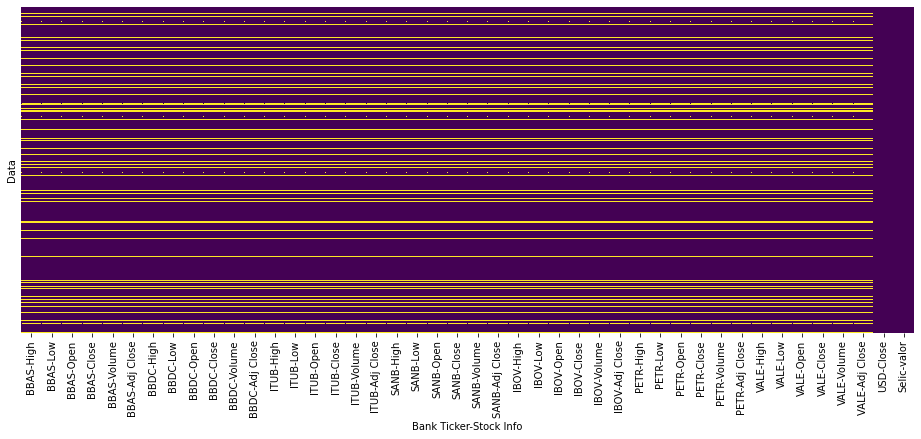

In [414]:
plt.figure(figsize = (16,6))
sns.heatmap(dados.isnull(),yticklabels=False,cbar=False,cmap='viridis')

In [415]:
#Verificando novamente os dados nulos
dados.isnull().value_counts()

(BBAS, High)  (BBAS, Low)  (BBAS, Open)  (BBAS, Close)  (BBAS, Volume)  (BBAS, Adj Close)  (BBDC, High)  (BBDC, Low)  (BBDC, Open)  (BBDC, Close)  (BBDC, Volume)  (BBDC, Adj Close)  (ITUB, High)  (ITUB, Low)  (ITUB, Open)  (ITUB, Close)  (ITUB, Volume)  (ITUB, Adj Close)  (SANB, High)  (SANB, Low)  (SANB, Open)  (SANB, Close)  (SANB, Volume)  (SANB, Adj Close)  (IBOV, High)  (IBOV, Low)  (IBOV, Open)  (IBOV, Close)  (IBOV, Volume)  (IBOV, Adj Close)  (PETR, High)  (PETR, Low)  (PETR, Open)  (PETR, Close)  (PETR, Volume)  (PETR, Adj Close)  (VALE, High)  (VALE, Low)  (VALE, Open)  (VALE, Close)  (VALE, Volume)  (VALE, Adj Close)  (USD, Close)  (Selic, valor)
False         False        False         False          False           False              False         False        False         False          False           False              False         False        False         False          False           False              False         False        False         False          False

In [416]:
#Alterando o nome da Coluna 'valor' em Selic para 'Close', com objetivo de unificar nomenclatura
dados = dados.rename(columns={'valor': 'Close'})

### 3.2.3 - IBOVESPA - Dados faltantes (feriados)

In [417]:
#Verificando a data onde a IBOVESPA é nula
dados[dados['IBOV']['Close'].isnull()==True]

Bank Ticker BBAS                 ...   VALE                 USD     Selic
Stock Info  High Low Open Close  ... Volume Adj Close     Close     Close
Data                             ...                                     
2010-01-25   NaN NaN  NaN   NaN  ...    NaN       NaN  1.783500  0.032927
2010-02-15   NaN NaN  NaN   NaN  ...    NaN       NaN  1.851400  0.032927
2010-02-16   NaN NaN  NaN   NaN  ...    NaN       NaN  1.842500  0.032927
2010-03-28   NaN NaN  NaN   NaN  ...    NaN       NaN  1.808500  0.032927
2010-04-04   NaN NaN  NaN   NaN  ...    NaN       NaN  1.760500  0.032927
...          ...  ..  ...   ...  ...    ...       ...       ...       ...
2020-11-20   NaN NaN  NaN   NaN  ...    NaN       NaN  5.304500  0.007469
2020-12-24   NaN NaN  NaN   NaN  ...    NaN       NaN  5.215300  0.007469
2020-12-25   NaN NaN  NaN   NaN  ...    NaN       NaN  5.215300  0.007469
2020-12-31   NaN NaN  NaN   NaN  ...    NaN       NaN  5.190839  0.007469
2021-01-01   NaN NaN  NaN   NaN  ...    NaN       NaN  5.192100  0.007469

[468 rows x 44 columns]

In [418]:
#Removendo os dias com feriados da base de dados
dados.drop(dados[dados['IBOV']['Close'].isnull()==True].index,inplace=True)

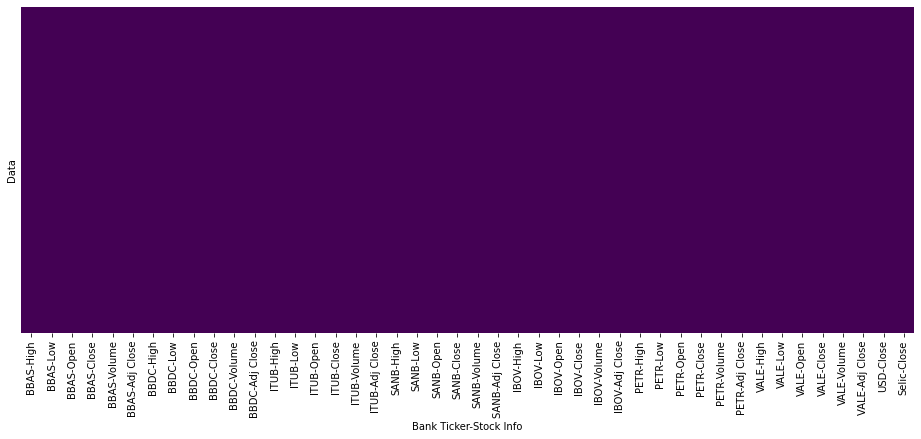

In [419]:
plt.figure(figsize = (16,6))
sns.heatmap(dados.isnull(),yticklabels=False,cbar=False,cmap='viridis')

In [420]:
#Verificando se ainda existem dados nulos
dados.isnull().value_counts()

(BBAS, High)  (BBAS, Low)  (BBAS, Open)  (BBAS, Close)  (BBAS, Volume)  (BBAS, Adj Close)  (BBDC, High)  (BBDC, Low)  (BBDC, Open)  (BBDC, Close)  (BBDC, Volume)  (BBDC, Adj Close)  (ITUB, High)  (ITUB, Low)  (ITUB, Open)  (ITUB, Close)  (ITUB, Volume)  (ITUB, Adj Close)  (SANB, High)  (SANB, Low)  (SANB, Open)  (SANB, Close)  (SANB, Volume)  (SANB, Adj Close)  (IBOV, High)  (IBOV, Low)  (IBOV, Open)  (IBOV, Close)  (IBOV, Volume)  (IBOV, Adj Close)  (PETR, High)  (PETR, Low)  (PETR, Open)  (PETR, Close)  (PETR, Volume)  (PETR, Adj Close)  (VALE, High)  (VALE, Low)  (VALE, Open)  (VALE, Close)  (VALE, Volume)  (VALE, Adj Close)  (USD, Close)  (Selic, Close)
False         False        False         False          False           False              False         False        False         False          False           False              False         False        False         False          False           False              False         False        False         False          False

### 4. ANÁLISE / EXPLORAÇÃO DOS DADOS

### 4.1 - Análise Exploratória - Cotações e Volume

In [421]:
# Apresentando o DataFrame com os dados importados
dados

Bank Ticker       BBAS                        ...       VALE       USD     Selic
Stock Info        High        Low       Open  ...  Adj Close     Close     Close
Data                                          ...                               
2010-01-04   30.000000  29.700001  29.799999  ...  32.089706  1.719000  0.032927
2010-01-05   30.100000  29.190001  30.100000  ...  32.388855  1.737000  0.032927
2010-01-06   30.000000  29.420000  29.490000  ...  33.074394  1.731500  0.032927
2010-01-07   29.709999  29.410000  29.440001  ...  33.211502  1.738900  0.032927
2010-01-08   29.820000  29.469999  29.700001  ...  33.535576  1.732000  0.032927
...                ...        ...        ...  ...        ...       ...       ...
2020-12-22   38.860001  38.000000  38.139999  ...  83.192207  5.118938  0.007469
2020-12-23   39.180000  38.270000  38.570000  ...  83.594101  5.156655  0.007469
2020-12-28   39.549999  39.200001  39.320000  ...  83.546249  5.215300  0.007469
2020-12-29   39.599998  38.950001  39.500000  ...  83.316597  5.245900  0.007469
2020-12-30   39.349998  38.660000  39.279999  ...  83.680214  5.208600  0.007469

[2718 rows x 44 columns]

In [422]:
# Verificando o formato dos dados importados
dados.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2718 entries, 2010-01-04 to 2020-12-30
Data columns (total 44 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   (BBAS, High)       2718 non-null   float64
 1   (BBAS, Low)        2718 non-null   float64
 2   (BBAS, Open)       2718 non-null   float64
 3   (BBAS, Close)      2718 non-null   float64
 4   (BBAS, Volume)     2718 non-null   float64
 5   (BBAS, Adj Close)  2718 non-null   float64
 6   (BBDC, High)       2718 non-null   float64
 7   (BBDC, Low)        2718 non-null   float64
 8   (BBDC, Open)       2718 non-null   float64
 9   (BBDC, Close)      2718 non-null   float64
 10  (BBDC, Volume)     2718 non-null   float64
 11  (BBDC, Adj Close)  2718 non-null   float64
 12  (ITUB, High)       2718 non-null   float64
 13  (ITUB, Low)        2718 non-null   float64
 14  (ITUB, Open)       2718 non-null   float64
 15  (ITUB, Close)      2718 non-null   float64
 16  (ITUB,

In [423]:
# Verificando informações estatísticas dos dados importados
dados.describe()

Bank Ticker         BBAS               ...          USD        Selic
Stock Info          High          Low  ...        Close        Close
count        2718.000000  2718.000000  ...  2718.000000  2718.000000
mean           29.947689    29.051490  ...     2.966065     0.034967
std             8.996919     8.820052  ...     1.067617     0.012160
min            12.840000    12.520000  ...     1.533700     0.007469
25%            23.972499    23.250000  ...     2.018425     0.024620
50%            28.150000    27.315000  ...     3.114500     0.036564
75%            33.290001    32.387500  ...     3.751300     0.043810
max            55.910000    54.820000  ...     5.886400     0.052531

[8 rows x 44 columns]

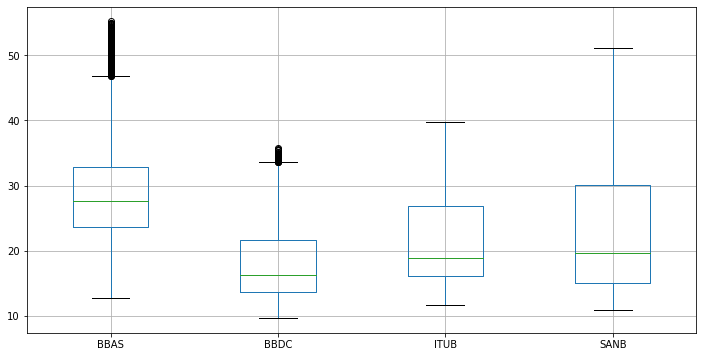

In [424]:
dados.xs(key='Close',axis=1,level='Stock Info').drop(columns=['IBOV','PETR','VALE','USD','Selic']).boxplot(figsize=(12,6))

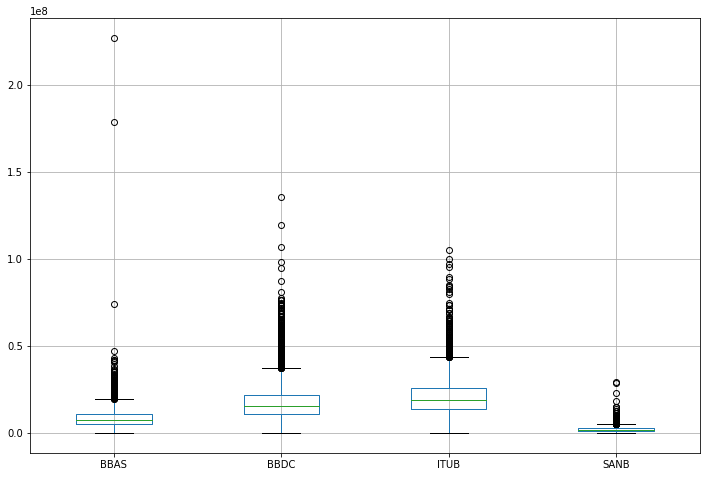

In [425]:
dados.xs(key='Volume',axis=1,level='Stock Info').drop(columns=['IBOV','PETR','VALE']).boxplot(figsize=(12,8))

In [426]:
# Normalizando os dados para facilitar análise comparativa de valores
dados_normal = normalize(dados)
dados_normal

Bank Ticker      BBAS                      ...      VALE       USD     Selic
Stock Info       High       Low      Open  ... Adj Close     Close     Close
Data                                       ...                              
2010-01-04   1.000000  1.000000  1.000000  ...  1.000000  1.000000  1.000000
2010-01-05   1.003333  0.982828  1.010067  ...  1.009322  1.010471  1.000000
2010-01-06   1.000000  0.990572  0.989597  ...  1.030685  1.007272  1.000000
2010-01-07   0.990333  0.990236  0.987920  ...  1.034958  1.011576  1.000000
2010-01-08   0.994000  0.992256  0.996644  ...  1.045057  1.007563  1.000000
...               ...       ...       ...  ...       ...       ...       ...
2020-12-22   1.295333  1.279461  1.279866  ...  2.592489  2.977858  0.226835
2020-12-23   1.306000  1.288552  1.294295  ...  2.605013  2.999799  0.226835
2020-12-28   1.318333  1.319865  1.319463  ...  2.603522  3.033915  0.226835
2020-12-29   1.320000  1.311448  1.325503  ...  2.596365  3.051716  0.226835
2020-12-30   1.311667  1.301683  1.318121  ...  2.607696  3.030018  0.226835

[2718 rows x 44 columns]

In [427]:
# Separando apenas dados relativos aos valores de fechamento dos ativos
dados_cotacao_normal = dados_normal.xs(key='Close',axis=1,level='Stock Info')
dados_cotacao_normal.head()

Bank Ticker,BBAS,BBDC,ITUB,SANB,IBOV,PETR,VALE,USD,Selic
Data,,,,,,,,,
2010-01-04,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0
2010-01-05,0.989967,0.994695,1.006481,1.009684,1.002784,0.991426,1.009322,1.010471,1.0
2010-01-06,0.991304,0.986737,0.997757,1.004632,1.009765,1.004823,1.030686,1.007272,1.0
2010-01-07,0.991639,0.984085,0.987537,0.997474,1.005796,0.995445,1.034958,1.011576,1.0
2010-01-08,0.997324,0.983024,0.972582,0.987368,1.003112,0.990086,1.045057,1.007563,1.0


In [428]:
# Plotando os valores de fechamento de ativos no tempo
interactive_plot_index(dados_cotacao_normal , 'Gráfico normalizado com as ações e indicadores importados')

In [429]:
### Plotando os dados de ações apenas
interactive_plot_index(dados_cotacao_normal.drop(columns=['USD', 'Selic', 'IBOV'], axis=1) , 'Gráfico com as ações importadas')

In [430]:
### Plotando os dados de ações bancárias
interactive_plot_index(dados_cotacao_normal.drop(columns=['USD', 'Selic', 'IBOV','PETR','VALE'], axis=1) , 'Gráfico com as ações bancárias')

In [431]:
### Plotando os dados de ações bancárias com Selic e Dólar
interactive_plot_index(dados_cotacao_normal.drop(columns=['IBOV','PETR','VALE'], axis=1) , 'Gráfico com as ações bancárias')

In [432]:
dados_volume_normal = dados_normal.xs(key='Volume',axis=1,level='Stock Info')
dados_volume_normal.head()

Bank Ticker,BBAS,BBDC,ITUB,SANB,IBOV,PETR,VALE
Data,,,,,,,
2010-01-04,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
2010-01-05,0.845560,1.178976,0.725579,0.852184,1.198623,1.608317,1.260519
2010-01-06,0.754021,1.037317,0.895231,0.522442,1.355322,1.407183,1.151759
2010-01-07,0.425470,0.611339,0.841529,0.711417,0.939350,0.824183,1.067901
2010-01-08,0.562502,0.663677,0.823135,0.763947,0.987314,1.099266,1.026497


In [433]:
### Plotando os dados de ações apenas
interactive_plot_index(dados_volume_normal.drop(columns=['IBOV'], axis=1) , 'Gráfico com os volumes das ações analisadas, incluindo PETR e VALE')

In [434]:
### Plotando apenas os dados de ações bancárias
interactive_plot_index(dados_volume_normal.drop(columns=['IBOV','PETR','VALE'], axis=1) , 'Gráfico com os volumes das ações bancárias')

In [435]:
#sns.pairplot(dados_analise_normal)

### 4.2 - Análise Exploratória - Retornos

In [436]:
# Criando um DataFrame de retornos dos ativos e indicadores
returns = pd.DataFrame()
for tick in tickers:
  if tick == 'Selic':
    returns[tick+' Return'] = dados[tick]['Close']
  else:
    returns[tick+' Return'] = dados[tick]['Close'].pct_change() * 100
returns.fillna(method='bfill', inplace=True)

In [437]:
returns.head()

,BBAS Return,BBDC Return,ITUB Return,SANB Return,IBOV Return,PETR Return,VALE Return,USD Return,Selic Return
Data,,,,,,,,,
2010-01-04,-1.003342,-0.530496,0.648057,0.968419,0.278392,-0.857448,0.932219,1.047121,0.032927
2010-01-05,-1.003342,-0.530496,0.648057,0.968419,0.278392,-0.857448,0.932219,1.047121,0.032927
2010-01-06,0.135132,-0.800005,-0.866769,-0.500413,0.696185,1.351351,2.116603,-0.316636,0.032927
2010-01-07,0.033739,-0.268813,-1.024227,-0.712490,-0.393050,-0.933329,0.414549,0.427370,0.032927
2010-01-08,0.573356,-0.107816,-1.514394,-1.013085,-0.266852,-0.538360,0.975794,-0.396800,0.032927


In [438]:
# Observar o retorno dos Ativos no período
returns.describe()

,BBAS Return,BBDC Return,ITUB Return,SANB Return,IBOV Return,PETR Return,VALE Return,USD Return,Selic Return
count,2718.000000,2718.000000,2718.000000,2718.000000,2718.000000,2718.000000,2718.000000,2718.000000,2718.000000
mean,0.044564,0.042493,0.040655,0.050018,0.032447,0.033700,0.055840,0.046920,0.034967
std,2.655145,2.177057,2.012620,2.281583,1.591236,2.955782,2.682574,1.072366,0.012160
min,-21.171174,-14.274426,-12.046662,-13.474025,-14.779679,-29.697769,-24.559217,-6.180833,0.007469
25%,-1.372253,-1.094555,-1.125111,-1.232398,-0.819403,-1.475604,-1.372056,-0.452229,0.024620
50%,0.000000,0.000000,0.000000,0.000000,0.029423,0.000000,0.000000,0.000000,0.036564
75%,1.367718,1.131464,1.099453,1.316161,0.896904,1.423560,1.347372,0.531681,0.043810
max,17.126078,16.866914,11.770349,15.777082,13.908215,22.222215,21.357860,7.518989,0.052531


In [439]:
# Observar o retorno diário da Selic comparado com as ações bancárias. Valores muito próximos, com risco muito menor (std - desvio padrão)
returns.drop(columns=['IBOV Return','PETR Return','VALE Return','USD Return'],axis=1,inplace=False).describe()

,BBAS Return,BBDC Return,ITUB Return,SANB Return,Selic Return
count,2718.000000,2718.000000,2718.000000,2718.000000,2718.000000
mean,0.044564,0.042493,0.040655,0.050018,0.034967
std,2.655145,2.177057,2.012620,2.281583,0.012160
min,-21.171174,-14.274426,-12.046662,-13.474025,0.007469
25%,-1.372253,-1.094555,-1.125111,-1.232398,0.024620
50%,0.000000,0.000000,0.000000,0.000000,0.036564
75%,1.367718,1.131464,1.099453,1.316161,0.043810
max,17.126078,16.866914,11.770349,15.777082,0.052531


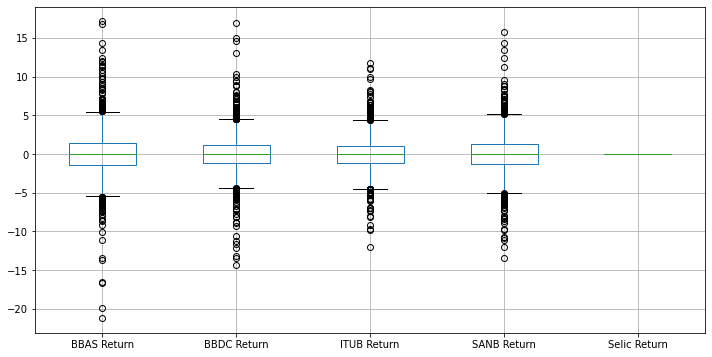

In [440]:
returns.drop(columns=['IBOV Return','PETR Return','VALE Return','USD Return'],axis=1,inplace=False).boxplot(figsize=(12,6))

In [441]:
# Interessante observar que em 2019 o retorno da Selic caiu consideravelmente. Por outro lado, o retorno das ações foi positivo
# Também foi reduzido o risco (std)
returns_2019 = returns[returns[:].index.year==2019]
returns_2019.drop(columns=['IBOV Return','PETR Return','VALE Return','USD Return'],axis=1,inplace=False).describe()

,BBAS Return,BBDC Return,ITUB Return,SANB Return,Selic Return
count,247.000000,247.000000,247.000000,247.000000,247.000000
mean,0.070192,0.061049,0.030333,0.069917,0.022926
std,1.929002,1.682110,1.583553,1.666210,0.002341
min,-6.093324,-5.824995,-4.257996,-4.512467,0.017089
25%,-1.138671,-1.075546,-1.116677,-1.123369,0.020872
50%,0.000000,-0.057940,-0.027172,0.022575,0.024620
75%,1.331510,1.179429,1.134147,1.185472,0.024620
max,6.155379,5.648923,4.225352,6.570372,0.024620


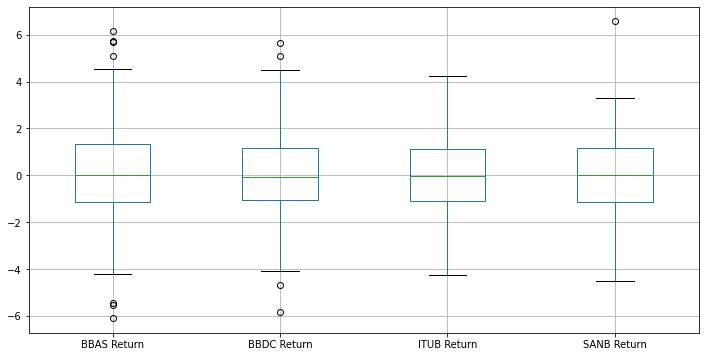

In [442]:
returns_2019.drop(columns=['IBOV Return','PETR Return','VALE Return','USD Return','Selic Return'],
                  axis=1,inplace=False).boxplot(figsize=(12,6))

In [443]:
# Interessante observar que em 2020 o retorno da Selic caiu consideravelmente. Por outro lado, o retorno das ações foi negativo na maioria
# Já o risco (std) do investimento em ações foi consideravelmente aumentado
returns_2020 = returns[returns[:].index.year==2020]
returns_2020.drop(columns=['IBOV Return','PETR Return','VALE Return'],axis=1,inplace=False).describe()

,BBAS Return,BBDC Return,ITUB Return,SANB Return,USD Return,Selic Return
count,247.000000,247.000000,247.000000,247.000000,247.000000,247.000000
mean,-0.048046,-0.012701,-0.018350,0.027736,0.113658,0.010859
std,3.912482,3.615881,3.047861,3.557134,1.341383,0.003736
min,-16.689509,-14.274426,-9.820404,-13.474025,-5.776595,0.007469
25%,-1.877545,-1.805555,-1.851367,-1.755150,-0.536735,0.007469
50%,0.025976,0.000000,-0.046276,-0.198174,0.005497,0.008442
75%,1.311687,1.568061,1.685000,2.002177,0.799276,0.014227
max,17.126078,16.866914,11.059316,13.410121,3.797322,0.017089


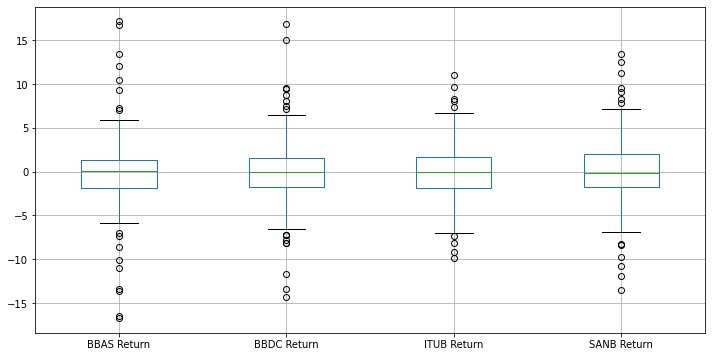

In [444]:
returns_2020.drop(columns=['IBOV Return','PETR Return','VALE Return','USD Return','Selic Return'],
                  axis=1,inplace=False).boxplot(figsize=(12,6))

In [445]:
### Plotando os retornos das ações importadas
interactive_plot_index(returns.drop(columns=['IBOV Return',
                                             'USD Return',
                                             'Selic Return'],
                                    axis=1) ,
                       'Variação de Retorno Diário das Ações')

In [446]:
### Plotando os dados de retorno das ações de bancos
interactive_plot_index(returns.drop(columns=['IBOV Return',
                                             'PETR Return',
                                             'VALE Return',
                                             'USD Return',
                                             'Selic Return'],
                                    axis=1) ,
                       'Retorno Diário das Ações dos Bancos')

In [447]:
### Plotando os retornos do dólar
interactive_plot_index(returns.drop(columns=['BBDC Return',
                                             'BBAS Return',
                                             'ITUB Return',
                                             'SANB Return',
                                             'IBOV Return',
                                             'PETR Return',
                                             'VALE Return',
                                             'Selic Return'],
                                    axis=1) ,
                       'Variação de Retorno Diário do Dólar')

In [448]:
### Plotando os dados de retorno da Selic
interactive_plot_index(returns.drop(columns=['BBDC Return',
                                             'BBAS Return',
                                             'ITUB Return',
                                             'SANB Return',
                                             'IBOV Return',
                                             'PETR Return',
                                             'VALE Return',
                                             'USD Return'],
                                   axis=1) ,
                       'Variação de Retorno Diário da Selic')

In [449]:
#returns.drop(columns=['IBOV Return','PETR Return','VALE Return','USD Return','Selic Return'],axis=1,inplace=False).hist(figsize=(16,16),bins=200, density=True)

### 4.3. Análise Exploratória - Maiores e menores valores, retornos e datas

In [450]:
# Descobrir a maior cotação das ações dos Bancos
for tick in tickers[:4]:
  print(tick,dados[tick]['Close'].max())

BBAS 55.18000030517578
BBDC 35.8272705078125
ITUB 39.689998626708984
SANB 51.040000915527344


In [451]:
# Descobrir a data da maior cotação das ações dos Bancos
for tick in tickers[:4]:
  print(tick,dados[tick]['Close'].idxmax())

BBAS 2019-07-04 00:00:00
BBDC 2019-07-05 00:00:00
ITUB 2019-02-04 00:00:00
SANB 2020-01-02 00:00:00


In [452]:
# Descobrir a menor cotação das ações dos Bancos
for tick in tickers[:4]:
  print(tick,dados[tick]['Close'].min())

BBAS 12.699999809265137
BBDC 9.68171501159668
ITUB 11.633995056152344
SANB 10.970000267028809


In [453]:
# Descobrir a data da menor cotação das ações dos Bancos
for tick in tickers[:4]:
  print(tick, dados[tick]['Close'].idxmin())

BBAS 2016-01-27 00:00:00
BBDC 2016-01-21 00:00:00
ITUB 2011-08-08 00:00:00
SANB 2014-02-05 00:00:00


In [454]:
# Descobrir a maior alta percentual nas ações dos Bancos
for tick in tickers[:4]:
  print(tick,returns[tick+' Return'].max())

BBAS 17.126077990307763
BBDC 16.866913737647458
ITUB 11.770349244987477
SANB 15.777082142799937


In [455]:
# Descobrir a data da maior alta percentual nas ações dos Bancos
for tick in tickers[:4]:
  print(tick,returns[tick+' Return'].idxmax())

BBAS 2020-03-24 00:00:00
BBDC 2020-03-13 00:00:00
ITUB 2013-05-21 00:00:00
SANB 2014-04-29 00:00:00


In [456]:
# Descobrir a maior queda percentual nas ações dos Bancos
for tick in tickers[:4]:
  print(tick,returns[tick+' Return'].min())

BBAS -21.171173880253225
BBDC -14.274425665210256
ITUB -12.046662464017722
SANB -13.474025069249763


In [457]:
# Descobrir a data da maior queda percentual nas ações dos Bancos
for tick in tickers[:4]:
  print(tick,returns[tick+' Return'].idxmin())

BBAS 2016-03-15 00:00:00
BBDC 2020-03-16 00:00:00
ITUB 2017-05-18 00:00:00
SANB 2020-03-12 00:00:00


### 4.4. Análise Exploratória - Analisando a correlação entre os Ativos

In [458]:
dados_cotacao_normal.head()

Bank Ticker,BBAS,BBDC,ITUB,SANB,IBOV,PETR,VALE,USD,Selic
Data,,,,,,,,,
2010-01-04,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0
2010-01-05,0.989967,0.994695,1.006481,1.009684,1.002784,0.991426,1.009322,1.010471,1.0
2010-01-06,0.991304,0.986737,0.997757,1.004632,1.009765,1.004823,1.030686,1.007272,1.0
2010-01-07,0.991639,0.984085,0.987537,0.997474,1.005796,0.995445,1.034958,1.011576,1.0
2010-01-08,0.997324,0.983024,0.972582,0.987368,1.003112,0.990086,1.045057,1.007563,1.0


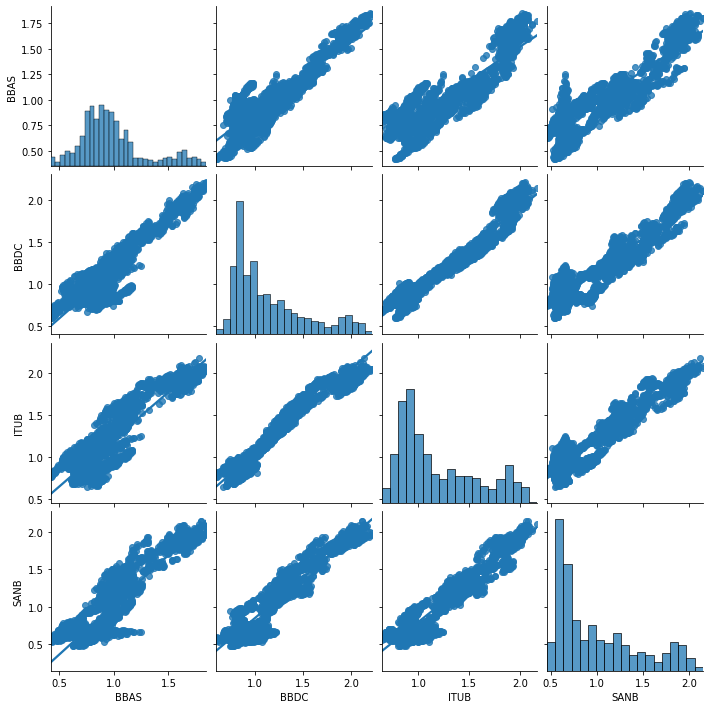

In [459]:
sns.pairplot(dados_cotacao_normal.drop(columns=['IBOV','PETR', 'VALE','USD','Selic'],axis=1), kind='reg')

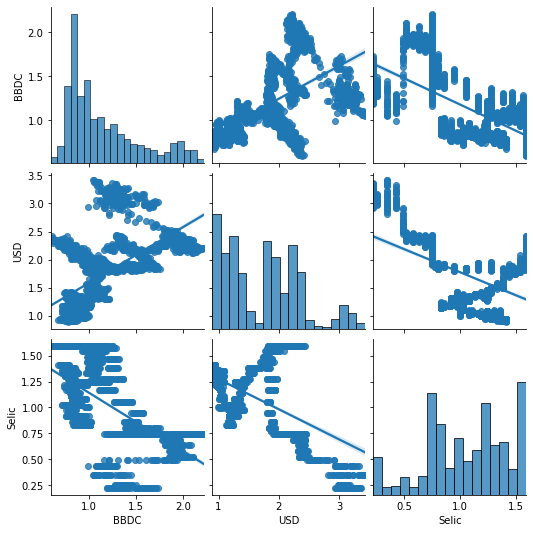

In [460]:
sns.pairplot(dados_cotacao_normal.drop(columns=['IBOV','PETR', 'VALE','ITUB','SANB','BBAS'],axis=1), kind='reg')

In [461]:
dados_cotacao_normal.corr()

Bank Ticker,BBAS,BBDC,ITUB,SANB,IBOV,PETR,VALE,USD,Selic
Bank Ticker,,,,,,,,,
BBAS,1.000000,0.898284,0.863052,0.897386,0.884709,0.631455,0.598162,0.355748,-0.602809
BBDC,0.898284,1.000000,0.970846,0.931629,0.845975,0.310930,0.363325,0.611271,-0.580633
ITUB,0.863052,0.970846,1.000000,0.949810,0.831524,0.267697,0.358992,0.650960,-0.531149
SANB,0.897386,0.931629,0.949810,1.000000,0.904004,0.449155,0.537530,0.601260,-0.596913
IBOV,0.884709,0.845975,0.831524,0.904004,1.000000,0.610105,0.730938,0.584624,-0.781833
PETR,0.631455,0.310930,0.267697,0.449155,0.610105,1.000000,0.831630,-0.186519,-0.509673
VALE,0.598162,0.363325,0.358992,0.537530,0.730938,0.831630,1.000000,0.109144,-0.722699
USD,0.355748,0.611271,0.650960,0.601260,0.584624,-0.186519,0.109144,1.000000,-0.488842
Selic,-0.602809,-0.580633,-0.531149,-0.596913,-0.781833,-0.509673,-0.722699,-0.488842,1.000000


In [462]:
dados_cotacao_normal.drop(columns=['IBOV','USD', 'Selic'],axis=1).corr()

Bank Ticker,BBAS,BBDC,ITUB,SANB,PETR,VALE
Bank Ticker,,,,,,
BBAS,1.000000,0.898284,0.863052,0.897386,0.631455,0.598162
BBDC,0.898284,1.000000,0.970846,0.931629,0.310930,0.363325
ITUB,0.863052,0.970846,1.000000,0.949810,0.267697,0.358992
SANB,0.897386,0.931629,0.949810,1.000000,0.449155,0.537530
PETR,0.631455,0.310930,0.267697,0.449155,1.000000,0.831630
VALE,0.598162,0.363325,0.358992,0.537530,0.831630,1.000000


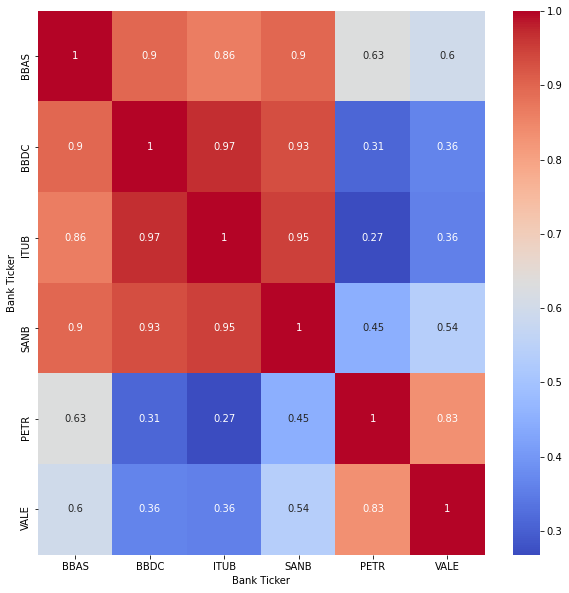

In [463]:
plt.figure(figsize = (10,10))
sns.heatmap(dados_cotacao_normal.drop(columns=['IBOV','USD', 'Selic'],axis=1).corr(),annot=True,cmap='coolwarm')

<Figure size 576x576 with 0 Axes>

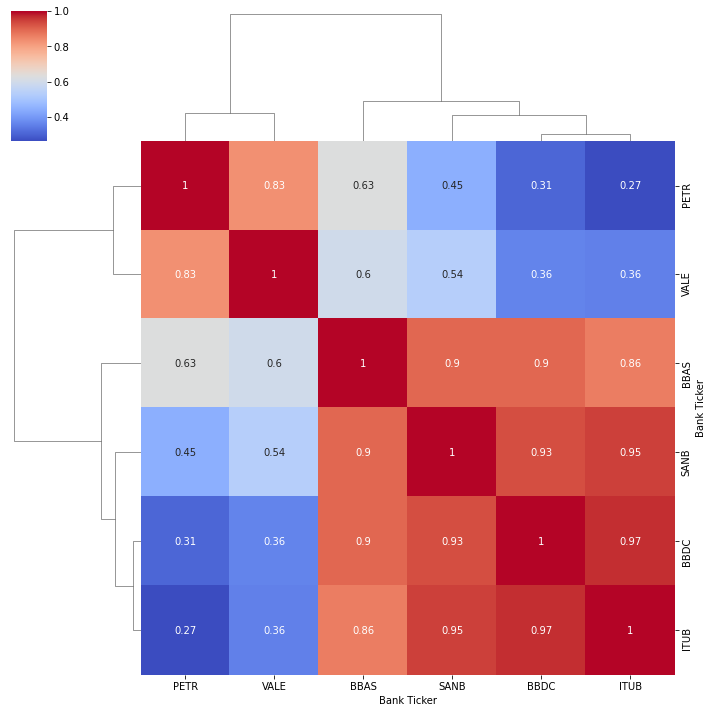

In [464]:
plt.figure(figsize = (8,8))
sns.clustermap(dados_cotacao_normal.drop(columns=['IBOV','USD', 'Selic'],axis=1).corr(),annot=True,cmap='coolwarm')

### 4.5. Análise Exploratória - Analisando as Features - Variáveis Independentes

In [465]:
# Definindo a ação de Banco que será utilizada na análise exploratória das Features
stock_ticker_id = 'BBDC'

# Definindo o alvo de predição para a cotação do próximo dia.
forecast_target = 1

In [466]:
# Montando a base de dados com as Features e o Alvo
bank_price_features_df = individual_stock_all_features(dados,stock_ticker_id)
bank_price_features_target_df = trading_window(bank_price_features_df,forecast_target)
bank_price_features_target_df = bank_price_features_target_df[:-forecast_target] #necessário remover o último elemento porque não tem o fechamento do dia corrente
bank_price_features_target_df.tail(forecast_target+5)

,Close,Volume,Selic,Dolar,Return,EMAClose,EMAOpen,EMAHigh,EMALow,RSI,WILLR,MACD,MACDsignal,MACDhist,OBV,ROC,fastk,fastd,Target
Data,,,,,,,,,,,,,,,,,,,
2020-12-18,27.219999,44708400.0,0.007469,5.056900,0.184024,26.769575,26.701784,27.176399,26.472288,92.273616,-15.315701,0.956563,0.952390,0.004173,2.517842e+09,8.544508,100.000000,100.000000,26.559999
2020-12-21,26.559999,54976600.0,0.007469,5.100600,-2.424687,26.717181,26.676338,27.154799,26.486716,90.072504,-18.926746,0.944848,0.950881,-0.006034,2.462865e+09,7.247407,0.000000,66.666667,27.100000
2020-12-22,27.100000,31840600.0,0.007469,5.118938,2.033136,26.812886,26.697254,27.178599,26.555037,90.517470,-16.355572,0.932536,0.947212,-0.014676,2.494706e+09,6.553426,20.215537,40.071846,27.719999
2020-12-23,27.719999,26350200.0,0.007469,5.156655,2.287819,27.039664,26.852940,27.358949,26.706278,91.490737,-13.945551,0.930354,0.943841,-0.013487,2.521056e+09,7.012145,64.432592,28.216043,27.990000
2020-12-28,27.990000,37557800.0,0.007469,5.215300,0.974028,27.277248,27.164705,27.584212,27.009708,92.373844,-12.792115,0.936995,0.942472,-0.005477,2.558614e+09,7.387001,100.000000,61.549376,27.530001
2020-12-29,27.530001,22192700.0,0.007469,5.245900,-1.643441,27.340436,27.328529,27.658159,27.099782,92.593990,-13.323237,0.936560,0.941289,-0.004729,2.580807e+09,7.036220,100.000000,88.144197,27.139999


In [467]:
# Normalizando a base de dados com as Features e o Alvo
bank_price_features_target_df_normal = normalize(bank_price_features_target_df)
bank_price_features_target_df_normal

,Close,Volume,Selic,Dolar,Return,EMAClose,EMAOpen,EMAHigh,EMALow,RSI,WILLR,MACD,MACDsignal,MACDhist,OBV,ROC,fastk,fastd,Target
Data,,,,,,,,,,,,,,,,,,,
2010-01-04,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
2010-01-05,0.994695,1.178976,1.000000,1.010471,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.992000
2010-01-06,0.986737,1.037317,1.000000,1.007272,1.508033,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.989333
2010-01-07,0.984085,0.611339,1.000000,1.011576,0.506720,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.988267
2010-01-08,0.983024,0.663677,1.000000,1.007563,0.203237,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.989067
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-21,1.640616,6.554842,0.226835,2.967190,4.570606,1.669622,1.670848,1.683481,1.679427,63.469718,0.205611,-2.009795,-1.575670,-0.045246,316.683953,-0.536593,0.000000,2.000000,1.682900
2020-12-22,1.673972,3.796344,0.226835,2.977858,-3.832520,1.675602,1.672158,1.684956,1.683759,63.783264,0.177679,-1.983607,-1.569590,-0.110052,320.778130,-0.485212,0.202155,1.202155,1.721401
2020-12-23,1.712269,3.141726,0.226835,2.999799,-4.312605,1.689774,1.681910,1.696137,1.693349,64.469078,0.151498,-1.978965,-1.564003,-0.101133,324.166332,-0.519175,0.644326,0.846481,1.738168


In [468]:
# Plotando os valores de fechamento da ação versus Dólar, e Selic - Volume normalizado não ajustou bem ao gráfico
"""bank_price_features_target_df_normal = normalize(bank_price_features_target_df)
interactive_plot_index(bank_price_features_target_df_normal.iloc[:,0:4].drop(columns='Volume',
                                                                            axis=1),
                       stock_ticker_id+' - Gráfico normalizado com o Fechamento x Selic x Dólar')"""

# Plotando os valores de fechamento da ação versus Dólar, e Selic - Volume normalizado não ajustou bem ao gráfico
fig = px.line(title =  stock_ticker_id+' - Fechamento x Selic x Dólar x Volume/4 (ajuste escala) - normalizados')
fig.add_scatter(x = bank_price_features_target_df_normal.index, y = bank_price_features_target_df_normal['Close'], name = 'Close')
fig.add_scatter(x = bank_price_features_target_df_normal.index, y = bank_price_features_target_df_normal['Selic'], name = 'Selic')
fig.add_scatter(x = bank_price_features_target_df_normal.index, y = bank_price_features_target_df_normal['Dolar'], name = 'Dolar')
fig.add_scatter(x = bank_price_features_target_df.index, y = bank_price_features_target_df_normal['Volume']/4, name = 'Volume/4 - ajuste escala')
fig.update_layout(legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01))
fig.show()

In [469]:
# Plotando os valores de fechamento da ação versus Dólar, e Selic - Volume normalizado não ajustou bem ao gráfico
fig = px.line(title =  stock_ticker_id+' - Fechamento x Retorno Diário')
fig.add_scatter(x = bank_price_features_target_df.index, y = bank_price_features_target_df['Close'], name = 'Close')
fig.add_scatter(x = bank_price_features_target_df.index, y = bank_price_features_target_df['Return'], name = 'Return')
fig.update_layout(legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01))
fig.show()

In [470]:
# Plotando os valores das médias móveis exponenciais
# Plotando os valores de fechamento da ação versus Dólar, e Selic - Volume normalizado não ajustou bem ao gráfico
fig = px.line(title =  stock_ticker_id+' - Fechamento x Médias Móveis Exponenciais')
fig.add_scatter(x = bank_price_features_target_df.index, y = bank_price_features_target_df['Close'], name = 'Close')
fig.add_scatter(x = bank_price_features_target_df.index, y = bank_price_features_target_df['EMAClose'], name = 'EMAClose')
fig.add_scatter(x = bank_price_features_target_df.index, y = bank_price_features_target_df['EMAOpen'], name = 'EMAOpen')
fig.add_scatter(x = bank_price_features_target_df.index, y = bank_price_features_target_df['EMAHigh'], name = 'EMAHigh')
fig.add_scatter(x = bank_price_features_target_df.index, y = bank_price_features_target_df['EMALow'], name = 'EMALow')
fig.update_layout(legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01))
fig.show()

In [471]:
# Plotando os valores de fechamento da ação versus Dólar, e Selic - Volume normalizado não ajustou bem ao gráfico
fig = px.line(title =  stock_ticker_id+' - Fechamento (normalizado) x Índice Relativo de Forças (RSI - Relative Strenght Index - log10(RSI) - ajuste escala)')
fig.add_scatter(x = bank_price_features_target_df.index, y = bank_price_features_target_df_normal['Close'], name = 'Close')
fig.add_scatter(x = bank_price_features_target_df.index, y = np.log10(bank_price_features_target_df['RSI']), name = 'log10 (RSI)')
fig.update_layout(legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01))
fig.show()

In [472]:
# Plotando os valores de fechamento da ação versus Dólar, e Selic - Volume normalizado não ajustou bem ao gráfico
fig = px.line(title =  stock_ticker_id+' - Fechamento (normalizado) x  oscilador Larry Williams %𝑅 (WILLR /100 - ajuste escala)')
fig.add_scatter(x = bank_price_features_target_df.index, y = bank_price_features_target_df_normal['Close'], name = 'Close')
fig.add_scatter(x = bank_price_features_target_df.index, y = bank_price_features_target_df['WILLR']/100, name = 'WILLR/100 (ajuste escala)')
fig.update_layout(legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01))
fig.show()

In [473]:
# Plotando os valores de fechamento da ação versus Dólar, e Selic - Volume normalizado não ajustou bem ao gráfico
fig = px.line(title =  stock_ticker_id+' - Fechamento x Convergência e Divergência da Média Móvel (MACD - Moving Average Convergence Divergence - normalizado e x3 - ajuste escala)')
fig.add_scatter(x = bank_price_features_target_df_normal.index, y = bank_price_features_target_df['Close'], name = 'Close')
fig.add_scatter(x = bank_price_features_target_df_normal.index, y = bank_price_features_target_df_normal['MACD']*3, name = 'MACD x3 - ajuste escala')
fig.add_scatter(x = bank_price_features_target_df_normal.index, y = bank_price_features_target_df_normal['MACDsignal']*3, name = 'MACDsignal x3 - ajuste escala')
fig.add_scatter(x = bank_price_features_target_df_normal.index, y = bank_price_features_target_df_normal['MACDhist']*3, name = 'MACDhist x3 - ajuste escala')
fig.update_layout(legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01))
fig.show()

In [474]:
# Plotando os valores de fechamento da ação versus Dólar, e Selic - Volume normalizado não ajustou bem ao gráfico
fig = px.line(title =  stock_ticker_id+' - Fechamento x Indicador Saldo de Volume (OBV - On-Balance Volume - normalizado e /10 - ajuste escala)')
fig.add_scatter(x = bank_price_features_target_df.index, y = bank_price_features_target_df['Close'], name = 'Close')
fig.add_scatter(x = bank_price_features_target_df_normal.index, y = bank_price_features_target_df_normal['OBV']/10, name = 'OBV (/10 - ajuste escala)')
fig.update_layout(legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01))
fig.show()

In [475]:
# Plotando os valores de fechamento da ação versus Dólar, e Selic - Volume normalizado não ajustou bem ao gráfico
fig = px.line(title =  stock_ticker_id+' - Fechamento x Taxa de Mudança de Preço (PROC - Price Change of Rate)')
fig.add_scatter(x = bank_price_features_target_df.index, y = bank_price_features_target_df['Close'], name = 'Close')
fig.add_scatter(x = bank_price_features_target_df.index, y = bank_price_features_target_df['ROC'], name = 'ROC')
fig.update_layout(legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01))
fig.show()

In [476]:
# Plotando os valores de fechamento da ação versus Dólar, e Selic - Volume normalizado não ajustou bem ao gráfico
fig = px.line(title =  stock_ticker_id+' - Gráfico com o Fechamento x Oscilador Estocástico (%K - Stochastic Oscillator - /10 - ajuste escala)')
fig.add_scatter(x = bank_price_features_target_df_normal.index, y = bank_price_features_target_df['Close'], name = 'Close')
fig.add_scatter(x = bank_price_features_target_df_normal.index, y = bank_price_features_target_df['fastk']/10, name = 'fastk')
fig.add_scatter(x = bank_price_features_target_df_normal.index, y = bank_price_features_target_df['fastd']/10, name = 'fastd')
fig.update_layout(legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01))
fig.show()

In [477]:
bank_price_features_target_df_normal.corr()

,Close,Volume,Selic,Dolar,Return,EMAClose,EMAOpen,EMAHigh,EMALow,RSI,WILLR,MACD,MACDsignal,MACDhist,OBV,ROC,fastk,fastd,Target
Close,1.000000,0.226239,-0.580221,0.610904,-0.036623,0.997362,0.996000,0.996393,0.996809,0.265241,-0.197537,-0.230456,-0.243107,-0.014688,0.959287,-0.151332,0.091588,0.109424,0.997691
Volume,0.226239,1.000000,-0.399729,0.620893,-0.050210,0.225960,0.227031,0.236170,0.217928,0.065244,-0.067598,0.053226,0.068062,0.048397,0.325567,-0.037020,0.048016,0.060173,0.226324
Selic,-0.580221,-0.399729,1.000000,-0.487948,0.000335,-0.583020,-0.584584,-0.586312,-0.582256,-0.023499,0.007062,-0.034827,-0.043912,-0.029318,-0.639345,-0.006468,-0.023474,-0.022807,-0.580001
Dolar,0.610904,0.620893,-0.487948,1.000000,-0.011958,0.613725,0.615505,0.621331,0.608723,0.047723,-0.041452,0.059484,0.064565,0.010651,0.687120,-0.007543,0.030993,0.047819,0.611587
Return,-0.036623,-0.050210,0.000335,-0.011958,1.000000,0.009032,0.018000,0.013954,0.013643,-0.090786,0.121647,0.023529,0.011311,-0.049534,0.005518,0.080806,-0.254968,-0.086659,-0.032167
EMAClose,0.997362,0.225960,-0.583020,0.613725,0.009032,1.000000,0.999796,0.999793,0.999844,0.234233,-0.160641,-0.211270,-0.231981,-0.047894,0.961132,-0.119073,0.044299,0.069258,0.995305
EMAOpen,0.996000,0.227031,-0.584584,0.615505,0.018000,0.999796,1.000000,0.999839,0.999785,0.225903,-0.150466,-0.205905,-0.228372,-0.055296,0.961118,-0.111362,0.032505,0.058836,0.993998
EMAHigh,0.996393,0.236170,-0.586312,0.621331,0.013954,0.999793,0.999839,1.000000,0.999522,0.228060,-0.154139,-0.202771,-0.224818,-0.054156,0.962477,-0.111424,0.038041,0.063425,0.994351
EMALow,0.996809,0.217928,-0.582256,0.608723,0.013643,0.999844,0.999785,0.999522,1.000000,0.231929,-0.156207,-0.214471,-0.235636,-0.049146,0.960359,-0.119062,0.038272,0.064189,0.994823
RSI,0.265241,0.065244,-0.023499,0.047723,-0.090786,0.234233,0.225903,0.228060,0.231929,1.000000,-0.889855,-0.792323,-0.707303,0.434962,0.244894,-0.833266,0.420962,0.543038,0.265568


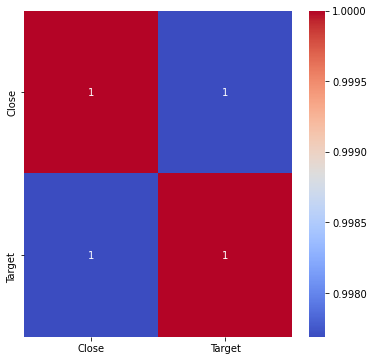

In [478]:
plt.figure(figsize = (6,6))
sns.heatmap(bank_price_features_target_df_normal[['Close','Target']].corr(),annot=True,cmap='coolwarm')

<Figure size 1440x1440 with 0 Axes>

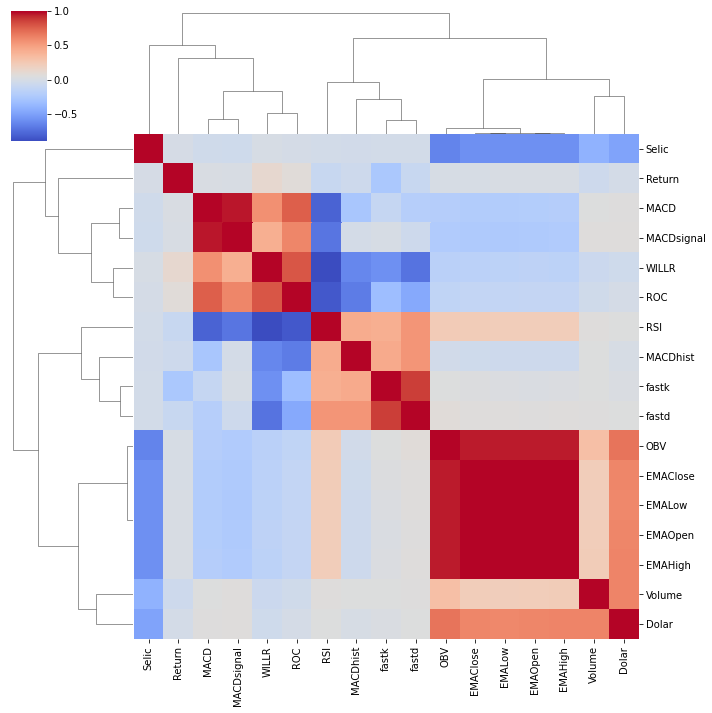

In [479]:
plt.figure(figsize = (20,20))
sns.clustermap(bank_price_features_target_df_normal.drop(columns=['Close','Target'],axis=1).corr(),annot=False,cmap='coolwarm')

### 5. CRIAÇÃO DE MODELO DE MACHINE LEARNING

### 5.1 - Avaliação de Modelos de Machine Learning

**IMPORTANTE: Antes da implementação dos modelos seguintes, foi executada uma análise comparatória entre diversos modelos de Machine Learning, constante de outro código Python.**

**No texto do TCC consta toda a explicação dos procedimentos realizados**

**Código do notebook no link: https://github.com/drnunes77/TCC_PUC_Big_Data/blob/main/TCC_PUC_Danilo_Rocha_Nunes_avalia_modelos.ipynb**

### 5.2 - Aplicação de Modelos de Machine Learning em um portfólio

Definição de Variáveis

In [480]:
# Definição das variáveis de execução do modelo

#Definindo o período de dias para o alvo da modelagem
forecast_target = 1

#Definindo o Split para incluir dados de treinamento até 2018 e testes para 2019 e 2020
split = int(len(dados[dados.index.year < 2019]))

#Definindo o Split para incluir dados de treinamento até 2019 e testes para 2020
#split = int(len(dados[dados.index.year < 2020]))

#Definindo o Split para uma determinada data
#split = int(len(dados[dados.index < datetime(2020,9,1)]))

predict_window = len(dados)-split-1
print(predict_window)

split/len(dados)

493


0.8182487122884474

In [481]:
# Definindo a lista de ações para predição
stock_list = ['BBAS','BBDC','ITUB','SANB']

In [482]:
# Iniciando variáveis
#intercepto = []
#coeficientes = []

### 5.2.1 - Modelo Regressão Linear - Cotação, Volume, Selic e Dólar - Retorno de Portfólio

In [483]:
intercepto = []
coeficientes = []
df_portfolio_lr_1= []

for i_stock in stock_list:
  bank_price_portfolio_stock = individual_stock_close_volume_selic_dolar(dados,i_stock)
  bank_price_portfolio_stock_target = trading_window(bank_price_portfolio_stock,forecast_target)
  bank_price_portfolio_stock_target = bank_price_portfolio_stock_target[:-forecast_target]

  # Criar o valor de X com todas as features
  # Criar o valor de y com os valores do target
  X = np.array(bank_price_portfolio_stock_target.drop(['Target'],axis=1))
  y = bank_price_portfolio_stock_target['Target'].values

  # Definindo os X_Train, X_test, y_train e y_test
  X_train = X[:split]
  X_test = X[split:]
  y_train = y[:split]
  y_test = y[split:]
  
  # Instanciando o objeto
  linear_regression = LinearRegression( )

  # Treinando o modelo 
  linear_regression.fit(X_train, y_train)

  #Armazena valor do intercepto
  intercepto.append('Intercepto - '+i_stock+' : '+str(linear_regression.intercept_))

  #Armazena o valor dos Coeficientes
  #linear_regression.coef_
  coeficientes.append({i_stock : list(zip(bank_price_portfolio_stock_target.columns, abs(linear_regression.coef_)))})

  # Realizar predições com o modelo de Regressão Linear
  predicted_prices_stock_portfolio = linear_regression.predict(X_test)

  # Imprime os scores para o modelo
  #print_model_scores("Linear Regression - "+str(i),y_test,predicted_prices_lr)

  # Armazena os valores dos modelos
  #df_model_scores_portfolio = assign_model_scores('Linear Regression - '+str(i_stock),y_test,predicted_prices_stock_portfolio,i_stock,df_model_scores_portfolio)

  # Criar um dataframe baseado nas datas e nos valores individuais das ações
  if i_stock == stock_list[0]:
    df_portfolio_lr_1 = pd.DataFrame(bank_price_portfolio_stock[split+forecast_target:].index)
  df_portfolio_lr_1[i_stock+' Close'] = bank_price_portfolio_stock_target['Close'][split+forecast_target-1:].values
  df_portfolio_lr_1[i_stock+' Target Close'] = pd.DataFrame(y_test)
  df_portfolio_lr_1[i_stock+' Prediction'] = pd.DataFrame(predicted_prices_stock_portfolio)
  for i in range(len(df_portfolio_lr_1)):
    if  df_portfolio_lr_1.iloc[i][i_stock+' Prediction'] > df_portfolio_lr_1.iloc[i][i_stock+' Close']:
      df_portfolio_lr_1.loc[i,i_stock+' Decision'] = 1
    else:
      df_portfolio_lr_1.loc[i,i_stock+' Decision'] = 0

df_portfolio_lr_1.to_csv('Cot_Vol_Selic_Dolar_Linear_Regression.csv',sep=';',encoding='utf-8',decimal=',', index=False)

print('\n',intercepto,'\n')
coeficientes


 ['Intercepto - BBAS : 0.21146484243404373', 'Intercepto - BBDC : 0.08998875187874589', 'Intercepto - ITUB : 0.0723919763286176', 'Intercepto - SANB : 0.06265062551198852'] 



[{'BBAS': [('Close', 0.994199131944862),
   ('Volume', 1.2417145215225667e-09),
   ('Selic', 3.2260137477528184),
   ('Dolar', 0.025924502121232804)]},
 {'BBDC': [('Close', 0.9939689839604835),
   ('Volume', 2.2689257859458224e-10),
   ('Selic', 1.8873801041996099),
   ('Dolar', 0.03295574136920983)]},
 {'ITUB': [('Close', 0.9951124111219604),
   ('Volume', 5.593604798736859e-10),
   ('Selic', 1.7660663743382976),
   ('Dolar', 0.04286669736831419)]},
 {'SANB': [('Close', 0.9973781020407663),
   ('Volume', 1.060714636292868e-08),
   ('Selic', 1.9141595184738671),
   ('Dolar', 0.037503281335809)]}]

In [484]:
return_df_lr_1, stock_return_dict = Portfolio_return_ML_x_BuyHold(df_portfolio_lr_1,stock_list)

print('Retorno do Portfólio - Machine Learning (%):', return_df_lr_1.iloc[-1]['Portfolio ML Return'])
print('Retorno do Portfólio - Buy and Hold - Primeiro Dia (%):', return_df_lr_1.iloc[-1]['Portfolio BuyHoldFirstDay Return'])
print('Retorno do Portfólio - Buy and Hold - Primeira Compra (%):', return_df_lr_1.iloc[-1]['Portfolio BuyHoldFirstBuy Return'])
print('\n')

stock_return_dict

Retorno do Portfólio - Machine Learning (%): 2.9822559723746833
Retorno do Portfólio - Buy and Hold - Primeiro Dia (%): -11.801308888033544
Retorno do Portfólio - Buy and Hold - Primeira Compra (%): -10.146986761229108




[{'BBAS- 1-1 - Retorno - Machine Learning (%)': 9.8693126694448,
  'BBAS- 1-2 - Retorno - Buy and Hold - Primeira Compra (%)': -12.573235008467888,
  'BBAS- 1-3 - Retorno - Buy and Hold - Primeiro Dia (%)': -20.16460811676553,
  'BBAS- 2-1 - Número de ciclos de compra e venda': 15,
  'BBAS- 2-2 - Número de dias com ação na carteira': 238,
  'BBAS- 2-3 - Número de dias de negociações': 493,
  'BBAS- 3- - Primeira Data de Compra': '28/8/2019',
  'BBAS- 4-1 - Valor de Fechamento (Close) - Primeiro Dia': 48.599998474121094,
  'BBAS- 4-2 - Valor de Fechamento (Close) - Primeira Compra': 44.380001068115234,
  'BBAS- 4-3 - Valor de Fechamento (Close) - Último Dia': 38.79999923706055},
 {'BBDC- 1-1 - Retorno - Machine Learning (%)': 6.6179685620866024,
  'BBDC- 1-2 - Retorno - Buy and Hold - Primeira Compra (%)': -9.120244519658947,
  'BBDC- 1-3 - Retorno - Buy and Hold - Primeiro Dia (%)': -11.302797371318961,
  'BBDC- 2-1 - Número de ciclos de compra e venda': 11,
  'BBDC- 2-2 - Número de di

In [485]:
#Plotando o retorno do Portfolio
interactive_plot_portfolio_return (return_df_lr_1, 'Comparativo do retorno acumulado do portfolio de investimento (%)')

In [486]:
# Plotando o gráfico com a ação desejada
index = stock_list.index('SANB')
interactive_plot_ticker_ML_result(df_portfolio_lr_1 ,
                                  stock_list[index], str(stock_list[index])+' - Previsão x Fechamento - com Decisão de Investimento - Sombreamento Superior - Ação na Carteira')
interactive_plot_stock_return (return_df_lr_1, stock_list[index], str(stock_list[index])+' - Retorno acumulado de investimento (%)')

### 5.2.2 - Modelo Regressão Linear - Features Análise Técnica - Retorno de Portfólio

In [487]:
intercepto = []
coeficientes = []
df_portfolio = pd.DataFrame()

for i_stock in stock_list:
  bank_price_portfolio_stock = individual_stock_tech_all_features(dados,i_stock)
  bank_price_portfolio_stock_target = trading_window(bank_price_portfolio_stock,forecast_target)
  bank_price_portfolio_stock_target = bank_price_portfolio_stock_target[:-forecast_target]

  # Criar o valor de X com todas as features
  # Criar o valor de y com os valores do target
  X = np.array(bank_price_portfolio_stock_target.drop(['Target'],axis=1))
  y = bank_price_portfolio_stock_target['Target'].values

  # Definindo os X_Train, X_test, y_train e y_test
  X_train = X[:split]
  X_test = X[split:]
  y_train = y[:split]
  y_test = y[split:]
  
  # Instanciando o objeto
  linear_regression = LinearRegression( )

  # Treinando o modelo 
  linear_regression.fit(X_train, y_train)

  #Armazena valor do intercepto
  intercepto.append('Intercepto - '+i_stock+' : '+str(linear_regression.intercept_))

  #Armazena o valor dos Coeficientes
  #linear_regression.coef_
  coeficientes.append({i_stock : list(zip(bank_price_portfolio_stock_target.columns, abs(linear_regression.coef_)))})

  # Realizar predições com o modelo de Regressão Linear
  predicted_prices_stock_portfolio = linear_regression.predict(X_test)

  # Criar um dataframe baseado nas datas e nos valores individuais das ações
  if i_stock == stock_list[0]:
    df_portfolio_lr_2 = pd.DataFrame(bank_price_portfolio_stock[split+forecast_target:].index)
  df_portfolio_lr_2[i_stock+' Close'] = bank_price_portfolio_stock_target['Close'][split+forecast_target-1:].values
  df_portfolio_lr_2[i_stock+' Target Close'] = pd.DataFrame(y_test)
  df_portfolio_lr_2[i_stock+' Prediction'] = pd.DataFrame(predicted_prices_stock_portfolio)
  for i in range(len(df_portfolio_lr_2)):
    if  df_portfolio_lr_2.iloc[i][i_stock+' Prediction'] > df_portfolio_lr_2.iloc[i][i_stock+' Close']:
      df_portfolio_lr_2.loc[i,i_stock+' Decision'] = 1
    else:
      df_portfolio_lr_2.loc[i,i_stock+' Decision'] = 0

df_portfolio_lr_2.to_csv('Technical_Analysis_Linear_Regression.csv',sep=';',encoding='utf-8',decimal=',', index=False)

print('\n',intercepto,'\n')
coeficientes


 ['Intercepto - BBAS : 0.3889939102767066', 'Intercepto - BBDC : -0.08138112583241863', 'Intercepto - ITUB : -0.11852343401072218', 'Intercepto - SANB : -0.12946033454479533'] 



[{'BBAS': [('Close', 1.0617836001865004),
   ('EMAClose', 0.859337825026956),
   ('EMAOpen', 0.041366158655773685),
   ('EMAHigh', 0.4349313357884032),
   ('EMALow', 0.3112339923197978),
   ('RSI', 0.0009072174502757543),
   ('WILLR', 0.0029944713361468593),
   ('MACD', 0.025460097289784586),
   ('MACDsignal', 0.007477033402206116),
   ('MACDhist', 0.032937130691992805),
   ('OBV', 1.0457357202398043e-10),
   ('ROC', 0.004268228256599529),
   ('fastk', 0.0015351298771740618),
   ('fastd', 0.0020570602254809506)]},
 {'BBDC': [('Close', 0.9098308859858352),
   ('EMAClose', 0.0371613036161105),
   ('EMAOpen', 0.04442733858394193),
   ('EMAHigh', 0.029787298638085425),
   ('EMALow', 0.04079554149075868),
   ('RSI', 0.0005684073604633762),
   ('WILLR', 0.0005368382066627818),
   ('MACD', 0.007329716652730964),
   ('MACDsignal', 0.018912258838349818),
   ('MACDhist', 0.011582542185618466),
   ('OBV', 1.5030067468391195e-11),
   ('ROC', 0.004112598305440703),
   ('fastk', 0.000423247975907753

In [488]:
return_df_lr_2, stock_return_dict = Portfolio_return_ML_x_BuyHold(df_portfolio_lr_2,stock_list)

print('Retorno do Portfólio - Machine Learning (%):', return_df_lr_2.iloc[-1]['Portfolio ML Return'])
print('Retorno do Portfólio - Buy and Hold - Primeiro Dia (%):', return_df_lr_2.iloc[-1]['Portfolio BuyHoldFirstDay Return'])
print('Retorno do Portfólio - Buy and Hold - Primeira Compra (%):', return_df_lr_2.iloc[-1]['Portfolio BuyHoldFirstBuy Return'])
print('\n')

stock_return_dict

Retorno do Portfólio - Machine Learning (%): 23.35961803967272
Retorno do Portfólio - Buy and Hold - Primeiro Dia (%): -11.801308888033544
Retorno do Portfólio - Buy and Hold - Primeira Compra (%): -12.97095818101413




[{'BBAS- 1-1 - Retorno - Machine Learning (%)': 29.502076754398633,
  'BBAS- 1-2 - Retorno - Buy and Hold - Primeira Compra (%)': -19.50207754582959,
  'BBAS- 1-3 - Retorno - Buy and Hold - Primeiro Dia (%)': -20.16460811676553,
  'BBAS- 2-1 - Número de ciclos de compra e venda': 45,
  'BBAS- 2-2 - Número de dias com ação na carteira': 182,
  'BBAS- 2-3 - Número de dias de negociações': 493,
  'BBAS- 3- - Primeira Data de Compra': '23/1/2019',
  'BBAS- 4-1 - Valor de Fechamento (Close) - Primeiro Dia': 48.599998474121094,
  'BBAS- 4-2 - Valor de Fechamento (Close) - Primeira Compra': 48.20000076293945,
  'BBAS- 4-3 - Valor de Fechamento (Close) - Último Dia': 38.79999923706055},
 {'BBDC- 1-1 - Retorno - Machine Learning (%)': 3.461280572031015,
  'BBDC- 1-2 - Retorno - Buy and Hold - Primeira Compra (%)': -15.207576483857997,
  'BBDC- 1-3 - Retorno - Buy and Hold - Primeiro Dia (%)': -11.302797371318961,
  'BBDC- 2-1 - Número de ciclos de compra e venda': 64,
  'BBDC- 2-2 - Número de d

In [489]:
#Plotando o retorno do Portfolio
interactive_plot_portfolio_return (return_df_lr_2, 'Comparativo do retorno acumulado do portfolio de investimento (%)')

In [490]:
# Plotando o gráfico com a ação desejada
index = stock_list.index('SANB')
interactive_plot_ticker_ML_result(df_portfolio_lr_2 , stock_list[index], str(stock_list[index])+' - Previsão x Fechamento - com decisão de investimento')
interactive_plot_stock_return (return_df_lr_2, stock_list[index], str(stock_list[index])+' - Retorno acumulado de investimento (%)')

### 5.2.3 - Modelo Regressão Linear - Seleção de Features Técnicas - Retorno de Portfólio

In [491]:
from sklearn import feature_selection # Library para seleção de features
sfm = feature_selection.SelectFromModel(linear_regression, threshold = 0.01)
 
# Dataframe com as colunas mais relevantes
sfm.fit_transform(X_train, y_train).shape

#sel_features_list = sfm.get_support()
selected_features = pd.DataFrame(list(zip(bank_price_portfolio_stock_target.columns, sfm.get_support())))
selected_features.columns=['Feature','Selected']
selected_features

,Feature,Selected
0,Close,True
1,EMAClose,True
2,EMAOpen,True
3,EMAHigh,True
4,EMALow,True
5,RSI,False
6,WILLR,False
7,MACD,True
8,MACDsignal,True
9,MACDhist,True


In [492]:
intercepto = []
coeficientes = []
df_portfolio = pd.DataFrame()

for i_stock in stock_list:
  bank_price_portfolio_stock = individual_stock_tech_all_features(dados,i_stock)
  bank_price_portfolio_stock_target = trading_window(bank_price_portfolio_stock,forecast_target)
  bank_price_portfolio_stock_target = bank_price_portfolio_stock_target[:-forecast_target]

  bank_price_selected_features = bank_price_portfolio_stock_target.copy()
  for i in range(len(selected_features)):
    if selected_features.iloc[i]['Selected'] == False:
      bank_price_selected_features.drop(columns=selected_features.iloc[i]['Feature'],axis=1,inplace=True)

  # Criar o valor de X com todas as features
  # Criar o valor de y com os valores do target
  X = np.array(bank_price_selected_features.drop(['Target'],axis=1))
  y = bank_price_selected_features['Target'].values

  # Definindo os X_Train, X_test, y_train e y_test
  X_train = X[:split]
  X_test = X[split:]
  y_train = y[:split]
  y_test = y[split:]
  
  # Instanciando o objeto
  linear_regression = LinearRegression( )

  # Treinando o modelo 
  linear_regression.fit(X_train, y_train)

  #Armazena valor do intercepto
  intercepto.append('Intercepto - '+i_stock+' : '+str(linear_regression.intercept_))

  #Armazena o valor dos Coeficientes
  #linear_regression.coef_
  coeficientes.append({i_stock : list(zip(bank_price_selected_features.columns, abs(linear_regression.coef_)))})

  # Realizar predições com o modelo de Regressão Linear
  predicted_prices_stock_portfolio = linear_regression.predict(X_test)

  # Criar um dataframe baseado nas datas e nos valores individuais das ações
  if i_stock == stock_list[0]:
    df_portfolio_lr_2_sel = pd.DataFrame(bank_price_portfolio_stock[split+forecast_target:].index)
  df_portfolio_lr_2_sel[i_stock+' Close'] = bank_price_portfolio_stock_target['Close'][split+forecast_target-1:].values
  df_portfolio_lr_2_sel[i_stock+' Target Close'] = pd.DataFrame(y_test)
  df_portfolio_lr_2_sel[i_stock+' Prediction'] = pd.DataFrame(predicted_prices_stock_portfolio)
  for i in range(len(df_portfolio_lr_2_sel)):
    if  df_portfolio_lr_2_sel.iloc[i][i_stock+' Prediction'] > df_portfolio_lr_2_sel.iloc[i][i_stock+' Close']:
      df_portfolio_lr_2_sel.loc[i,i_stock+' Decision'] = 1
    else:
      df_portfolio_lr_2_sel.loc[i,i_stock+' Decision'] = 0

df_portfolio_lr_2_sel.to_csv('Selected_Tech_Features_Linear_Regression.csv',sep=';',encoding='utf-8',decimal=',', index=False)

print('\n',intercepto,'\n')
coeficientes


 ['Intercepto - BBAS : 0.13123529130761824', 'Intercepto - BBDC : 0.014003097276116705', 'Intercepto - ITUB : 0.003044319447557342', 'Intercepto - SANB : -0.01424956180006376'] 



[{'BBAS': [('Close', 1.0826569099447592),
   ('EMAClose', 0.6816111301293948),
   ('EMAOpen', 0.009585076910944929),
   ('EMAHigh', 0.31383673991402405),
   ('EMALow', 0.2897069240013049),
   ('MACD', 0.012822582275511077),
   ('MACDsignal', 0.012152013807140176),
   ('MACDhist', 0.0006705684683716193)]},
 {'BBDC': [('Close', 0.9352137518206287),
   ('EMAClose', 0.011399608111119754),
   ('EMAOpen', 0.027776879951249132),
   ('EMAHigh', 0.0016027807658185742),
   ('EMALow', 0.05021779020252528),
   ('MACD', 0.058686575762845),
   ('MACDsignal', 0.032805735907231626),
   ('MACDhist', 0.09149231167007654)]},
 {'ITUB': [('Close', 0.9228250010093042),
   ('EMAClose', 0.2719217387750351),
   ('EMAOpen', 0.39468312047779697),
   ('EMAHigh', 0.36035510960001504),
   ('EMALow', 0.3843301695453333),
   ('MACD', 0.07039366492096562),
   ('MACDsignal', 0.07741736997405427),
   ('MACDhist', 0.14781103489502423)]},
 {'SANB': [('Close', 0.9461746677725605),
   ('EMAClose', 0.2452247455661687),
   ('

In [493]:
return_df_lr_2_sel, stock_return_dict = Portfolio_return_ML_x_BuyHold(df_portfolio_lr_2_sel,stock_list)

print('Retorno do Portfólio - Machine Learning (%):', return_df_lr_2_sel.iloc[-1]['Portfolio ML Return'])
print('Retorno do Portfólio - Buy and Hold - Primeiro Dia (%):', return_df_lr_2_sel.iloc[-1]['Portfolio BuyHoldFirstDay Return'])
print('Retorno do Portfólio - Buy and Hold - Primeira Compra (%):', return_df_lr_2_sel.iloc[-1]['Portfolio BuyHoldFirstBuy Return'])
print('\n')

stock_return_dict

Retorno do Portfólio - Machine Learning (%): 17.16218877415105
Retorno do Portfólio - Buy and Hold - Primeiro Dia (%): -11.801308888033544
Retorno do Portfólio - Buy and Hold - Primeira Compra (%): -15.245934652673393




[{'BBAS- 1-1 - Retorno - Machine Learning (%)': 16.20183472239643,
  'BBAS- 1-2 - Retorno - Buy and Hold - Primeira Compra (%)': -28.80734084943019,
  'BBAS- 1-3 - Retorno - Buy and Hold - Primeiro Dia (%)': -20.16460811676553,
  'BBAS- 2-1 - Número de ciclos de compra e venda': 35,
  'BBAS- 2-2 - Número de dias com ação na carteira': 153,
  'BBAS- 2-3 - Número de dias de negociações': 493,
  'BBAS- 3- - Primeira Data de Compra': '20/2/2019',
  'BBAS- 4-1 - Valor de Fechamento (Close) - Primeiro Dia': 48.599998474121094,
  'BBAS- 4-2 - Valor de Fechamento (Close) - Primeira Compra': 54.5,
  'BBAS- 4-3 - Valor de Fechamento (Close) - Último Dia': 38.79999923706055},
 {'BBDC- 1-1 - Retorno - Machine Learning (%)': 15.45059920054824,
  'BBDC- 1-2 - Retorno - Buy and Hold - Primeira Compra (%)': -13.675177585842055,
  'BBDC- 1-3 - Retorno - Buy and Hold - Primeiro Dia (%)': -11.302797371318961,
  'BBDC- 2-1 - Número de ciclos de compra e venda': 64,
  'BBDC- 2-2 - Número de dias com ação n

In [494]:
#Plotando o retorno do Portfolio
interactive_plot_portfolio_return (return_df_lr_2_sel, 'Comparativo do retorno acumulado do portfolio de investimento (%)')

In [495]:
# Plotando o gráfico com a ação desejada
index = stock_list.index('ITUB')
interactive_plot_ticker_ML_result(df_portfolio_lr_2_sel ,
                                  stock_list[index], str(stock_list[index])+' - Previsão x Fechamento - com Decisão de Investimento - Sombreamento Superior - Ação na Carteira')
interactive_plot_stock_return (return_df_lr_2_sel, stock_list[index], str(stock_list[index])+' - Retorno acumulado de investimento (%)')

### 5.2.4 - Modelo Regressão Linear - Todas as Features - Retorno de Portfólio

In [496]:
intercepto = []
coeficientes = []
df_portfolio = pd.DataFrame()

for i_stock in stock_list:
  bank_price_portfolio_stock = individual_stock_all_features(dados,i_stock)
  bank_price_portfolio_stock_target = trading_window(bank_price_portfolio_stock,forecast_target)
  bank_price_portfolio_stock_target = bank_price_portfolio_stock_target[:-forecast_target]

  # Criar o valor de X com todas as features
  # Criar o valor de y com os valores do target
  X = np.array(bank_price_portfolio_stock_target.drop(['Target'],axis=1))
  y = bank_price_portfolio_stock_target['Target'].values

  # Definindo os X_Train, X_test, y_train e y_test
  X_train = X[:split]
  X_test = X[split:]
  y_train = y[:split]
  y_test = y[split:]
  
  # Instanciando o objeto
  linear_regression = LinearRegression( )

  # Treinando o modelo 
  linear_regression.fit(X_train, y_train)

  #Armazena valor do intercepto
  intercepto.append('Intercepto - '+i_stock+' : '+str(linear_regression.intercept_))

  #Armazena o valor dos Coeficientes
  #linear_regression.coef_
  coeficientes.append({i_stock : list(zip(bank_price_portfolio_stock_target.columns, abs(linear_regression.coef_)))})

  # Realizar predições com o modelo de Regressão Linear
  predicted_prices_stock_portfolio = linear_regression.predict(X_test)

  # Imprime os scores para o modelo
  #print_model_scores("Linear Regression - "+str(i),y_test,predicted_prices_stock_portfolio)

  # Armazena os valores dos modelos
  #df_model_scores_portfolio = assign_model_scores('Linear Regression - '+str(i_stock),y_test,predicted_prices_stock_portfolio,i_stock,df_model_scores_portfolio)

  # Criar um dataframe baseado nas datas e nos valores individuais das ações
  if i_stock == stock_list[0]:
    df_portfolio_lr_3 = pd.DataFrame(bank_price_portfolio_stock[split+forecast_target:].index)
  df_portfolio_lr_3[i_stock+' Close'] = bank_price_portfolio_stock_target['Close'][split+forecast_target-1:].values
  df_portfolio_lr_3[i_stock+' Target Close'] = pd.DataFrame(y_test)
  df_portfolio_lr_3[i_stock+' Prediction'] = pd.DataFrame(predicted_prices_stock_portfolio)
  for i in range(len(df_portfolio_lr_3)):
    if  df_portfolio_lr_3.iloc[i][i_stock+' Prediction'] > df_portfolio_lr_3.iloc[i][i_stock+' Close']:
      df_portfolio_lr_3.loc[i,i_stock+' Decision'] = 1
    else:
      df_portfolio_lr_3.loc[i,i_stock+' Decision'] = 0

df_portfolio_lr_3.to_csv('All_Features_Linear_Regression.csv',sep=';',encoding='utf-8',decimal=',', index=False)

print('\n',intercepto,'\n')
coeficientes


 ['Intercepto - BBAS : 0.4823432641974712', 'Intercepto - BBDC : 0.18723208048509576', 'Intercepto - ITUB : -0.10628715156551749', 'Intercepto - SANB : -0.11946761522944982'] 



[{'BBAS': [('Close', 0.9878924750641435),
   ('Volume', 1.0076958661583335e-09),
   ('Selic', 1.0857957307068637),
   ('Dolar', 0.07571800085039165),
   ('Return', 0.020759728029692823),
   ('EMAClose', 0.7572158825164613),
   ('EMAOpen', 0.031908817928460585),
   ('EMAHigh', 0.375355987445903),
   ('EMALow', 0.3437323892327911),
   ('RSI', 0.0015822762415811725),
   ('WILLR', 0.0027009176259338388),
   ('MACD', 0.025437111306655293),
   ('MACDsignal', 0.002337527232651346),
   ('MACDhist', 0.027774638539261143),
   ('OBV', 3.349766129506919e-10),
   ('ROC', 0.003490752116176455),
   ('fastk', 0.0014714667480156434),
   ('fastd', 0.0015282548050527197)]},
 {'BBDC': [('Close', 0.8847117704939548),
   ('Volume', 1.2978566324517282e-09),
   ('Selic', 2.625741160460569),
   ('Dolar', 0.049558539023912024),
   ('Return', 0.0038024181450742756),
   ('EMAClose', 0.014354826487282724),
   ('EMAOpen', 0.01768989506443957),
   ('EMAHigh', 0.11142421815526508),
   ('EMALow', 0.18049240263801197),

In [497]:
return_df_lr_3, stock_return_dict = Portfolio_return_ML_x_BuyHold(df_portfolio_lr_3,stock_list)

print('Retorno do Portfólio - Machine Learning (%):', return_df_lr_3.iloc[-1]['Portfolio ML Return'])
print('Retorno do Portfólio - Buy and Hold - Primeiro Dia (%):', return_df_lr_3.iloc[-1]['Portfolio BuyHoldFirstDay Return'])
print('Retorno do Portfólio - Buy and Hold - Primeira Compra (%):', return_df_lr_3.iloc[-1]['Portfolio BuyHoldFirstBuy Return'])
print('\n')

stock_return_dict

Retorno do Portfólio - Machine Learning (%): 12.557120297176507
Retorno do Portfólio - Buy and Hold - Primeiro Dia (%): -11.801308888033544
Retorno do Portfólio - Buy and Hold - Primeira Compra (%): -12.772404288522944




[{'BBAS- 1-1 - Retorno - Machine Learning (%)': 3.3891191584554243,
  'BBAS- 1-2 - Retorno - Buy and Hold - Primeira Compra (%)': -18.828452183367553,
  'BBAS- 1-3 - Retorno - Buy and Hold - Primeiro Dia (%)': -20.16460811676553,
  'BBAS- 2-1 - Número de ciclos de compra e venda': 31,
  'BBAS- 2-2 - Número de dias com ação na carteira': 319,
  'BBAS- 2-3 - Número de dias de negociações': 493,
  'BBAS- 3- - Primeira Data de Compra': '10/1/2019',
  'BBAS- 4-1 - Valor de Fechamento (Close) - Primeiro Dia': 48.599998474121094,
  'BBAS- 4-2 - Valor de Fechamento (Close) - Primeira Compra': 47.79999923706055,
  'BBAS- 4-3 - Valor de Fechamento (Close) - Último Dia': 38.79999923706055},
 {'BBDC- 1-1 - Retorno - Machine Learning (%)': 19.575242060859722,
  'BBDC- 1-2 - Retorno - Buy and Hold - Primeira Compra (%)': -15.086986276355292,
  'BBDC- 1-3 - Retorno - Buy and Hold - Primeiro Dia (%)': -11.302797371318961,
  'BBDC- 2-1 - Número de ciclos de compra e venda': 33,
  'BBDC- 2-2 - Número de

In [498]:
#Plotando o retorno do Portfolio
interactive_plot_portfolio_return (return_df_lr_3, 'Comparativo do retorno acumulado do portfolio de investimento (%)')

In [499]:
# Plotando o gráfico com a ação desejada
index = stock_list.index('BBDC')
interactive_plot_ticker_ML_result(df_portfolio_lr_3 , stock_list[index], str(stock_list[index])+' - Previsão x Fechamento - com decisão de investimento')
interactive_plot_stock_return (return_df_lr_3, stock_list[index], str(stock_list[index])+' - Retorno acumulado de investimento (%)')

### 5.2.5 - Modelo Regressão Linear - Seleção entre todas as Features - Retorno de Portfólio

In [500]:
from sklearn import feature_selection # Library para seleção de features
sfm = feature_selection.SelectFromModel(linear_regression, threshold = 0.01)
 
# Dataframe com as colunas mais relevantes
sfm.fit_transform(X_train, y_train).shape

#sel_features_list = sfm.get_support()
selected_features = pd.DataFrame(list(zip(bank_price_portfolio_stock_target.columns, sfm.get_support())))
selected_features.columns=['Feature','Selected']
selected_features

,Feature,Selected
0,Close,True
1,Volume,False
2,Selic,True
3,Dolar,True
4,Return,False
5,EMAClose,True
6,EMAOpen,True
7,EMAHigh,True
8,EMALow,True
9,RSI,False


In [501]:
intercepto = []
coeficientes = []
df_portfolio = pd.DataFrame()

for i_stock in stock_list:
  bank_price_portfolio_stock = individual_stock_all_features(dados,i_stock)
  bank_price_portfolio_stock_target = trading_window(bank_price_portfolio_stock,forecast_target)
  bank_price_portfolio_stock_target = bank_price_portfolio_stock_target[:-forecast_target]

  bank_price_selected_features = bank_price_portfolio_stock_target.copy()
  for i in range(len(selected_features)):
    if selected_features.iloc[i]['Selected'] == False:
      bank_price_selected_features.drop(columns=selected_features.iloc[i]['Feature'],axis=1,inplace=True)

  # Criar o valor de X com todas as features
  # Criar o valor de y com os valores do target
  X = np.array(bank_price_selected_features.drop(['Target'],axis=1))
  y = bank_price_selected_features['Target'].values

  # Definindo os X_Train, X_test, y_train e y_test
  X_train = X[:split]
  X_test = X[split:]
  y_train = y[:split]
  y_test = y[split:]
  
  # Instanciando o objeto
  linear_regression = LinearRegression( )

  # Treinando o modelo 
  linear_regression.fit(X_train, y_train)

  #Armazena valor do intercepto
  intercepto.append('Intercepto - '+i_stock+' : '+str(linear_regression.intercept_))

  #Armazena o valor dos Coeficientes
  #linear_regression.coef_
  coeficientes.append({i_stock : list(zip(bank_price_selected_features.columns, abs(linear_regression.coef_)))})

  # Realizar predições com o modelo de Regressão Linear
  predicted_prices_stock_portfolio = linear_regression.predict(X_test)

  # Imprime os scores para o modelo
  #print_model_scores("Linear Regression - "+str(i),y_test,predicted_prices_stock_portfolio)

  # Armazena os valores dos modelos
  #df_model_scores_portfolio = assign_model_scores('Linear Regression - '+str(i_stock),y_test,predicted_prices_stock_portfolio,i_stock,df_model_scores_portfolio)

  # Criar um dataframe baseado nas datas e nos valores individuais das ações
  if i_stock == stock_list[0]:
    df_portfolio_lr_3_sel = pd.DataFrame(bank_price_portfolio_stock[split+forecast_target:].index)
  df_portfolio_lr_3_sel[i_stock+' Close'] = bank_price_portfolio_stock_target['Close'][split+forecast_target-1:].values
  df_portfolio_lr_3_sel[i_stock+' Target Close'] = pd.DataFrame(y_test)
  df_portfolio_lr_3_sel[i_stock+' Prediction'] = pd.DataFrame(predicted_prices_stock_portfolio)
  for i in range(len(df_portfolio_lr_3_sel)):
    if  df_portfolio_lr_3_sel.iloc[i][i_stock+' Prediction'] > df_portfolio_lr_3_sel.iloc[i][i_stock+' Close']:
      df_portfolio_lr_3_sel.loc[i,i_stock+' Decision'] = 1
    else:
      df_portfolio_lr_3_sel.loc[i,i_stock+' Decision'] = 0

df_portfolio_lr_3_sel.to_csv('Selected_All_Features_Linear_Regression.csv',sep=';',encoding='utf-8',decimal=',', index=False)

print('\n',intercepto,'\n')
coeficientes


 ['Intercepto - BBAS : 0.34500936214215017', 'Intercepto - BBDC : 0.10093481207968935', 'Intercepto - ITUB : 0.055192435477522395', 'Intercepto - SANB : -0.0664271976761377'] 



[{'BBAS': [('Close', 1.075611374242456),
   ('Selic', 3.7715261964773923),
   ('Dolar', 0.012168393074110932),
   ('EMAClose', 0.6372619466063825),
   ('EMAOpen', 0.035788589743265486),
   ('EMAHigh', 0.3042176982024807),
   ('EMALow', 0.2845792671652092),
   ('MACD', 0.012847818877500874),
   ('MACDsignal', 0.022285628080179698),
   ('MACDhist', 0.009437809202700528)]},
 {'BBDC': [('Close', 0.9305247269124031),
   ('Selic', 2.155616555554756),
   ('Dolar', 0.046157392927020174),
   ('EMAClose', 0.026888898198413447),
   ('EMAOpen', 0.025406909908300745),
   ('EMAHigh', 0.0270135232250297),
   ('EMALow', 0.14296687527767293),
   ('MACD', 0.06188806255021304),
   ('MACDsignal', 0.011538424235953082),
   ('MACDhist', 0.07342648678612804)]},
 {'ITUB': [('Close', 0.9195463874707094),
   ('Selic', 1.5326989744858839),
   ('Dolar', 0.036045396220214354),
   ('EMAClose', 0.2191676434732226),
   ('EMAOpen', 0.3729028162231145),
   ('EMAHigh', 0.2841583452431815),
   ('EMALow', 0.38577128256788

In [502]:
return_df_lr_3_sel, stock_return_dict = Portfolio_return_ML_x_BuyHold(df_portfolio_lr_3_sel,stock_list)

print('Retorno do Portfólio - Machine Learning (%):', return_df_lr_3_sel.iloc[-1]['Portfolio ML Return'])
print('Retorno do Portfólio - Buy and Hold - Primeiro Dia (%):', return_df_lr_3_sel.iloc[-1]['Portfolio BuyHoldFirstDay Return'])
print('Retorno do Portfólio - Buy and Hold - Primeira Compra (%):', return_df_lr_3_sel.iloc[-1]['Portfolio BuyHoldFirstBuy Return'])
print('\n')

stock_return_dict

Retorno do Portfólio - Machine Learning (%): 14.047171385076748
Retorno do Portfólio - Buy and Hold - Primeiro Dia (%): -11.801308888033544
Retorno do Portfólio - Buy and Hold - Primeira Compra (%): -14.93951685802364




[{'BBAS- 1-1 - Retorno - Machine Learning (%)': 25.056647823195117,
  'BBAS- 1-2 - Retorno - Buy and Hold - Primeira Compra (%)': -26.737160294936032,
  'BBAS- 1-3 - Retorno - Buy and Hold - Primeiro Dia (%)': -20.16460811676553,
  'BBAS- 2-1 - Número de ciclos de compra e venda': 7,
  'BBAS- 2-2 - Número de dias com ação na carteira': 199,
  'BBAS- 2-3 - Número de dias de negociações': 493,
  'BBAS- 3- - Primeira Data de Compra': '21/2/2019',
  'BBAS- 4-1 - Valor de Fechamento (Close) - Primeiro Dia': 48.599998474121094,
  'BBAS- 4-2 - Valor de Fechamento (Close) - Primeira Compra': 52.959999084472656,
  'BBAS- 4-3 - Valor de Fechamento (Close) - Último Dia': 38.79999923706055},
 {'BBDC- 1-1 - Retorno - Machine Learning (%)': 30.359325258750616,
  'BBDC- 1-2 - Retorno - Buy and Hold - Primeira Compra (%)': -14.519686961737206,
  'BBDC- 1-3 - Retorno - Buy and Hold - Primeiro Dia (%)': -11.302797371318961,
  'BBDC- 2-1 - Número de ciclos de compra e venda': 42,
  'BBDC- 2-2 - Número de

In [503]:
#Plotando o retorno do Portfolio
interactive_plot_portfolio_return (return_df_lr_3_sel, 'Comparativo do retorno acumulado do portfolio de investimento (%)')

In [504]:
# Plotando o gráfico com a ação desejada
index = stock_list.index('BBDC')
interactive_plot_ticker_ML_result(df_portfolio_lr_3_sel , stock_list[index], str(stock_list[index])+' - Previsão x Fechamento - com decisão de investimento')
interactive_plot_stock_return (return_df_lr_3_sel, stock_list[index], str(stock_list[index])+' - Retorno acumulado de investimento (%)')

### 5.2.6 - Modelo ElasticNet - Todas as Features - Retorno de Portfólio


In [505]:
intercepto = []
coeficientes = []
df_portfolio = pd.DataFrame()

for i_stock in stock_list:
  bank_price_portfolio_stock = individual_stock_all_features(dados,i_stock)
  bank_price_portfolio_stock_target = trading_window(bank_price_portfolio_stock,forecast_target)
  bank_price_portfolio_stock_target = bank_price_portfolio_stock_target[:-forecast_target]

  # Criar o valor de X com todas as features
  # Criar o valor de y com os valores do target
  X = np.array(bank_price_portfolio_stock_target.drop(['Target'],axis=1))
  y = bank_price_portfolio_stock_target['Target'].values

  # Definindo os X_Train, X_test, y_train e y_test
  X_train = X[:split]
  X_test = X[split:]
  y_train = y[:split]
  y_test = y[split:]
  
  # Instancia o objeto
  en = ElasticNet(alpha = 0.99,l1_ratio=0.01,max_iter=1000000)

  #Treina o modelo      
  en.fit(X_train, y_train)

  #Armazena valor do intercepto
  intercepto.append('Intercepto - '+i_stock+' : '+str(en.intercept_))

  #Armazena o valor dos Coeficientes
  #linear_regression.coef_
  coeficientes.append({i_stock : list(zip(bank_price_portfolio_stock_target.columns, abs(en.coef_)))})

  # Realizar predições com o modelo de Regressão Linear
  predicted_prices_stock_portfolio = en.predict(X_test)

  # Criar um dataframe baseado nas datas e nos valores individuais das ações
  # Criar um dataframe baseado nas datas e nos valores individuais das ações
  if i_stock == stock_list[0]:
    df_portfolio_en = pd.DataFrame(bank_price_portfolio_stock[split+forecast_target:].index)
  df_portfolio_en[i_stock+' Close'] = bank_price_portfolio_stock_target['Close'][split+forecast_target-1:].values
  df_portfolio_en[i_stock+' Target Close'] = pd.DataFrame(y_test)
  df_portfolio_en[i_stock+' Prediction'] = pd.DataFrame(predicted_prices_stock_portfolio)
  for i in range(len(df_portfolio_en)):
    if  df_portfolio_en.iloc[i][i_stock+' Prediction'] > df_portfolio_en.iloc[i][i_stock+' Close']:
      df_portfolio_en.loc[i,i_stock+' Decision'] = 1
    else:
      df_portfolio_en.loc[i,i_stock+' Decision'] = 0

df_portfolio_en.to_csv('All_Features_Elastic_Net.csv',sep=';',encoding='utf-8',decimal=',', index=False)

print('\n',intercepto,'\n')
coeficientes


 ['Intercepto - BBAS : 0.5180591225441944', 'Intercepto - BBDC : 2.2755299104974718', 'Intercepto - ITUB : 0.043911115928295885', 'Intercepto - SANB : 0.358899137529999'] 



[{'BBAS': [('Close', 0.2888808167708494),
   ('Volume', 3.3101499794968625e-09),
   ('Selic', 0.0),
   ('Dolar', 0.029493457940376066),
   ('Return', 0.10161996998639562),
   ('EMAClose', 0.17825945572902815),
   ('EMAOpen', 0.1629388595016585),
   ('EMAHigh', 0.17472940129890974),
   ('EMALow', 0.1670227255797016),
   ('RSI', 0.0035099554354547347),
   ('WILLR', 0.0038470129647387194),
   ('MACD', 0.0),
   ('MACDsignal', 0.0),
   ('MACDhist', 0.0),
   ('OBV', 3.8353231786954584e-10),
   ('ROC', 0.0024680307810885527),
   ('fastk', 0.006587857424633728),
   ('fastd', 0.0013076931836649098)]},
 {'BBDC': [('Close', 0.1944452504110829),
   ('Volume', 1.4860993805094088e-09),
   ('Selic', 0.0),
   ('Dolar', 0.02225646221213971),
   ('Return', 0.05281006244623461),
   ('EMAClose', 0.16254963329899336),
   ('EMAOpen', 0.15661421518871854),
   ('EMAHigh', 0.1587934813886328),
   ('EMALow', 0.15852006572387717),
   ('RSI', 0.000897532510620702),
   ('WILLR', 3.2795692792027115e-05),
   ('MACD'

In [506]:
return_df_en, stock_return_dict = Portfolio_return_ML_x_BuyHold(df_portfolio_en,stock_list)

print('Retorno do Portfólio - Machine Learning (%):', return_df_en.iloc[-1]['Portfolio ML Return'])
print('Retorno do Portfólio - Buy and Hold - Primeiro Dia (%):', return_df_en.iloc[-1]['Portfolio BuyHoldFirstDay Return'])
print('Retorno do Portfólio - Buy and Hold - Primeira Compra (%):', return_df_en.iloc[-1]['Portfolio BuyHoldFirstBuy Return'])
print('\n')

stock_return_dict

Retorno do Portfólio - Machine Learning (%): -3.686160822744256
Retorno do Portfólio - Buy and Hold - Primeiro Dia (%): -11.801308888033544
Retorno do Portfólio - Buy and Hold - Primeira Compra (%): -12.748269685333357




[{'BBAS- 1-1 - Retorno - Machine Learning (%)': -10.753128989520995,
  'BBAS- 1-2 - Retorno - Buy and Hold - Primeira Compra (%)': -18.828452183367553,
  'BBAS- 1-3 - Retorno - Buy and Hold - Primeiro Dia (%)': -20.16460811676553,
  'BBAS- 2-1 - Número de ciclos de compra e venda': 57,
  'BBAS- 2-2 - Número de dias com ação na carteira': 183,
  'BBAS- 2-3 - Número de dias de negociações': 493,
  'BBAS- 3- - Primeira Data de Compra': '10/1/2019',
  'BBAS- 4-1 - Valor de Fechamento (Close) - Primeiro Dia': 48.599998474121094,
  'BBAS- 4-2 - Valor de Fechamento (Close) - Primeira Compra': 47.79999923706055,
  'BBAS- 4-3 - Valor de Fechamento (Close) - Último Dia': 38.79999923706055},
 {'BBDC- 1-1 - Retorno - Machine Learning (%)': 2.9706259233539862,
  'BBDC- 1-2 - Retorno - Buy and Hold - Primeira Compra (%)': -15.805406091142286,
  'BBDC- 1-3 - Retorno - Buy and Hold - Primeiro Dia (%)': -11.302797371318961,
  'BBDC- 2-1 - Número de ciclos de compra e venda': 20,
  'BBDC- 2-2 - Número d

In [507]:
#Plotando o retorno do Portfolio
interactive_plot_portfolio_return (return_df_en, 'Comparativo do retorno acumulado do portfolio de investimento (%)')

In [508]:
# Plotando o gráfico com a ação desejada
index = stock_list.index('BBDC')
interactive_plot_ticker_ML_result(df_portfolio_en , stock_list[index], str(stock_list[index])+' - Previsão x Fechamento - com decisão de investimento')
interactive_plot_stock_return (return_df_en, stock_list[index], str(stock_list[index])+' - Retorno acumulado de investimento (%)')

### 5.2.7 - Modelo ElasticNet - Feature Selection - Retorno de Portfólio

In [509]:
sfm = feature_selection.SelectFromModel(en, threshold = 0.01)
 
# Dataframe com as colunas mais relevantes
sfm.fit_transform(X_train, y_train).shape

#sel_features_list = sfm.get_support()
selected_features = pd.DataFrame(list(zip(bank_price_portfolio_stock_target.columns, sfm.get_support())))
selected_features.columns=['Feature','Selected']
selected_features

,Feature,Selected
0,Close,True
1,Volume,False
2,Selic,False
3,Dolar,False
4,Return,True
5,EMAClose,True
6,EMAOpen,True
7,EMAHigh,True
8,EMALow,True
9,RSI,False


In [510]:
intercepto = []
coeficientes = []
df_portfolio = pd.DataFrame()

for i_stock in stock_list:
  bank_price_portfolio_stock = individual_stock_all_features(dados,i_stock)
  bank_price_portfolio_stock_target = trading_window(bank_price_portfolio_stock,forecast_target)
  bank_price_portfolio_stock_target = bank_price_portfolio_stock_target[:-forecast_target]

  bank_price_selected_features = bank_price_portfolio_stock_target.copy()
  for i in range(len(selected_features)):
    if selected_features.iloc[i]['Selected'] == False:
      bank_price_selected_features.drop(columns=selected_features.iloc[i]['Feature'],axis=1,inplace=True)
  
  # Criar o valor de X com todas as features
  # Criar o valor de y com os valores do target
  X = np.array(bank_price_selected_features.drop(['Target'],axis=1))
  y = bank_price_selected_features['Target'].values

  # Definindo os X_Train, X_test, y_train e y_test
  X_train = X[:split]
  X_test = X[split:]
  y_train = y[:split]
  y_test = y[split:]
  
  # Instancia o objeto
  en = ElasticNet(alpha = 0.99,l1_ratio=0.01,max_iter=1000000)

  #Treina o modelo      
  en.fit(X_train, y_train)

  #Armazena valor do intercepto
  intercepto.append('Intercepto - '+i_stock+' : '+str(en.intercept_))

  #Armazena o valor dos Coeficientes
  #linear_regression.coef_
  coeficientes.append({i_stock : list(zip(bank_price_selected_features.columns, abs(en.coef_)))})

  # Realizar predições com o modelo de Regressão Linear
  predicted_prices_stock_portfolio = en.predict(X_test)

  # Criar um dataframe baseado nas datas e nos valores individuais das ações
  # Criar um dataframe baseado nas datas e nos valores individuais das ações
  if i_stock == stock_list[0]:
    df_portfolio_en_sel = pd.DataFrame(bank_price_portfolio_stock[split+forecast_target:].index)
  df_portfolio_en_sel[i_stock+' Close'] = bank_price_portfolio_stock_target['Close'][split+forecast_target-1:].values
  df_portfolio_en_sel[i_stock+' Target Close'] = pd.DataFrame(y_test)
  df_portfolio_en_sel[i_stock+' Prediction'] = pd.DataFrame(predicted_prices_stock_portfolio)
  for i in range(len(df_portfolio_en_sel)):
    if  df_portfolio_en_sel.iloc[i][i_stock+' Prediction'] > df_portfolio_en_sel.iloc[i][i_stock+' Close']:
      df_portfolio_en_sel.loc[i,i_stock+' Decision'] = 1
    else:
      df_portfolio_en_sel.loc[i,i_stock+' Decision'] = 0

df_portfolio_en_sel.to_csv('Selected_Features_Elastic_Net.csv',sep=';',encoding='utf-8',decimal=',', index=False)

print('\n',intercepto,'\n')
coeficientes


 ['Intercepto - BBAS : 0.0684123982077196', 'Intercepto - BBDC : 0.12356590604543172', 'Intercepto - ITUB : 0.06954790451159099', 'Intercepto - SANB : -0.01620767854902283'] 



[{'BBAS': [('Close', 0.41639037752987124),
   ('Return', 0.11659909516125035),
   ('EMAClose', 0.1752452442315543),
   ('EMAOpen', 0.11692196078526663),
   ('EMAHigh', 0.14311162478139566),
   ('EMALow', 0.14638376529539737)]},
 {'BBDC': [('Close', 0.2603021606881506),
   ('Return', 0.06781234231395059),
   ('EMAClose', 0.192008310676768),
   ('EMAOpen', 0.17601108226496223),
   ('EMAHigh', 0.18316753712938028),
   ('EMALow', 0.18221060397745537)]},
 {'ITUB': [('Close', 0.2771622124156014),
   ('Return', 0.081994527316385),
   ('EMAClose', 0.19124275080574518),
   ('EMAOpen', 0.16954240904973816),
   ('EMAHigh', 0.17999118215440346),
   ('EMALow', 0.17974730040460454)]},
 {'SANB': [('Close', 0.30769476840525484),
   ('Return', 0.0789723080844771),
   ('EMAClose', 0.18968034769411646),
   ('EMAOpen', 0.15927481212027372),
   ('EMAHigh', 0.17215795684441476),
   ('EMALow', 0.1731458933784092)]}]

In [511]:
return_df_en_sel, stock_return_dict = Portfolio_return_ML_x_BuyHold(df_portfolio_en_sel,stock_list)

print('Retorno do Portfólio - Machine Learning (%):', return_df_en_sel.iloc[-1]['Portfolio ML Return'])
print('Retorno do Portfólio - Buy and Hold - Primeiro Dia (%):', return_df_en_sel.iloc[-1]['Portfolio BuyHoldFirstDay Return'])
print('Retorno do Portfólio - Buy and Hold - Primeira Compra (%):', return_df_en_sel.iloc[-1]['Portfolio BuyHoldFirstBuy Return'])
print('\n')

stock_return_dict

Retorno do Portfólio - Machine Learning (%): 3.9741782905984313
Retorno do Portfólio - Buy and Hold - Primeiro Dia (%): -11.801308888033544
Retorno do Portfólio - Buy and Hold - Primeira Compra (%): -13.888526438336765




[{'BBAS- 1-1 - Retorno - Machine Learning (%)': -5.798292336463718,
  'BBAS- 1-2 - Retorno - Buy and Hold - Primeira Compra (%)': -19.65210498767116,
  'BBAS- 1-3 - Retorno - Buy and Hold - Primeiro Dia (%)': -20.16460811676553,
  'BBAS- 2-1 - Número de ciclos de compra e venda': 45,
  'BBAS- 2-2 - Número de dias com ação na carteira': 247,
  'BBAS- 2-3 - Número de dias de negociações': 493,
  'BBAS- 3- - Primeira Data de Compra': '22/1/2019',
  'BBAS- 4-1 - Valor de Fechamento (Close) - Primeiro Dia': 48.599998474121094,
  'BBAS- 4-2 - Valor de Fechamento (Close) - Primeira Compra': 48.290000915527344,
  'BBAS- 4-3 - Valor de Fechamento (Close) - Último Dia': 38.79999923706055},
 {'BBDC- 1-1 - Retorno - Machine Learning (%)': -2.5741721195635834,
  'BBDC- 1-2 - Retorno - Buy and Hold - Primeira Compra (%)': -17.71979858398155,
  'BBDC- 1-3 - Retorno - Buy and Hold - Primeiro Dia (%)': -11.302797371318961,
  'BBDC- 2-1 - Número de ciclos de compra e venda': 41,
  'BBDC- 2-2 - Número de

In [512]:
#Plotando o retorno do Portfolio
interactive_plot_portfolio_return (return_df_en_sel, 'Comparativo do retorno acumulado do portfolio de investimento (%)')

In [513]:
# Plotando o gráfico com a ação desejada
index = stock_list.index('SANB')
interactive_plot_ticker_ML_result(df_portfolio_en_sel , stock_list[index], str(stock_list[index])+' - Previsão x Fechamento - com decisão de investimento')
interactive_plot_stock_return (return_df_en_sel, stock_list[index], str(stock_list[index])+' - Retorno acumulado de investimento (%)')

### 5.2.8 - Modelo SVM - Cotação e Volume - Retorno de Portfólio

In [514]:
intercepto = []
coeficientes = []
df_portfolio = pd.DataFrame()

for i_stock in stock_list:
  bank_price_portfolio_stock = individual_stock_close_volume(dados,i_stock)
  bank_price_portfolio_stock_target = trading_window(bank_price_portfolio_stock,forecast_target)
  bank_price_portfolio_stock_target = bank_price_portfolio_stock_target[:-forecast_target]

  # Criar o valor de X com todas as features
  # Criar o valor de y com os valores do target
  X = np.array(bank_price_portfolio_stock_target.drop(['Target'],axis=1))
  y = bank_price_portfolio_stock_target['Target'].values

  # Definindo os X_Train, X_test, y_train e y_test
  X_train = X[:split]
  X_test = X[split:]
  y_train = y[:split]
  y_test = y[split:]

  #Instanciando o modelo
  svr_rbf = make_pipeline(StandardScaler(), SVR(kernel='rbf',C=1e3, gamma=0.1, epsilon=0.2))
  #svr_rbf = make_pipeline(StandardScaler(), SVR(kernel="poly", degree=2, C=100, epsilon=0.1))

  #Treinando o modelo
  svr_rbf.fit(X_train,y_train)

  # Realizar predições com o modelo de Regressão Linear
  predicted_prices_stock_portfolio = svr_rbf.predict(X_test)

  # Criar um dataframe baseado nas datas e nos valores individuais das ações
  if i_stock == stock_list[0]:
    df_portfolio_svm = pd.DataFrame(bank_price_portfolio_stock[split+forecast_target:].index)
  df_portfolio_svm[i_stock+' Close'] = bank_price_portfolio_stock_target['Close'][split+forecast_target-1:].values
  df_portfolio_svm[i_stock+' Target Close'] = pd.DataFrame(y_test)
  df_portfolio_svm[i_stock+' Prediction'] = pd.DataFrame(predicted_prices_stock_portfolio)
  for i in range(len(df_portfolio_svm)):
    if  df_portfolio_svm.iloc[i][i_stock+' Prediction'] > df_portfolio_svm.iloc[i][i_stock+' Close']:
      df_portfolio_svm.loc[i,i_stock+' Decision'] = 1
    else:
      df_portfolio_svm.loc[i,i_stock+' Decision'] = 0

df_portfolio_svm.to_csv('All_Features_SVM.csv',sep=';',encoding='utf-8',decimal=',', index=False)


In [515]:
return_df_svm, stock_return_dict = Portfolio_return_ML_x_BuyHold(df_portfolio_svm,stock_list)

print('Retorno do Portfólio - Machine Learning (%):', return_df_svm.iloc[-1]['Portfolio ML Return'])
print('Retorno do Portfólio - Buy and Hold - Primeiro Dia (%):', return_df_svm.iloc[-1]['Portfolio BuyHoldFirstDay Return'])
print('Retorno do Portfólio - Buy and Hold - Primeira Compra (%):', return_df_svm.iloc[-1]['Portfolio BuyHoldFirstBuy Return'])
print('\n')

stock_return_dict

Retorno do Portfólio - Machine Learning (%): 26.79159463999332
Retorno do Portfólio - Buy and Hold - Primeiro Dia (%): -11.801308888033544
Retorno do Portfólio - Buy and Hold - Primeira Compra (%): -8.51074734324676




[{'BBAS- 1-1 - Retorno - Machine Learning (%)': 5.306550273458943,
  'BBAS- 1-2 - Retorno - Buy and Hold - Primeira Compra (%)': -13.489407899426034,
  'BBAS- 1-3 - Retorno - Buy and Hold - Primeiro Dia (%)': -20.16460811676553,
  'BBAS- 2-1 - Número de ciclos de compra e venda': 44,
  'BBAS- 2-2 - Número de dias com ação na carteira': 134,
  'BBAS- 2-3 - Número de dias de negociações': 493,
  'BBAS- 3- - Primeira Data de Compra': '20/5/2019',
  'BBAS- 4-1 - Valor de Fechamento (Close) - Primeiro Dia': 48.599998474121094,
  'BBAS- 4-2 - Valor de Fechamento (Close) - Primeira Compra': 44.849998474121094,
  'BBAS- 4-3 - Valor de Fechamento (Close) - Último Dia': 38.79999923706055},
 {'BBDC- 1-1 - Retorno - Machine Learning (%)': 13.799008539565015,
  'BBDC- 1-2 - Retorno - Buy and Hold - Primeira Compra (%)': -12.012966193646623,
  'BBDC- 1-3 - Retorno - Buy and Hold - Primeiro Dia (%)': -11.302797371318961,
  'BBDC- 2-1 - Número de ciclos de compra e venda': 36,
  'BBDC- 2-2 - Número de

In [516]:
#Plotando o retorno do Portfolio
interactive_plot_portfolio_return (return_df_svm, 'Comparativo do retorno acumulado do portfolio de investimento (%)')

In [517]:
# Plotando o gráfico com a ação desejada
index = stock_list.index('SANB')
interactive_plot_ticker_ML_result(df_portfolio_svm , stock_list[index], str(stock_list[index])+' - Previsão x Fechamento - com decisão de investimento')
interactive_plot_stock_return (return_df_svm, stock_list[index], str(stock_list[index])+' - Retorno acumulado de investimento (%)')

### 5.2.9 - Modelo Redes Neurais Artificais - Sequencial - Cotação e Volume - Retorno de Portfólio

In [518]:
stock_list = ['BBAS','BBDC','ITUB','SANB']


In [519]:
stock_list = ['BBAS','BBDC','ITUB','SANB']
forecast_target = 1
#dados = dados[dados.index.year < 2020]
split = int(len(dados[dados.index.year < 2019]))
predict_window = len(dados)-split-1
#bank_price_portfolio = pd.DataFrame()
epochs_LSTM = 80
number_of_neurons = 300

best_accuracy_j = -10
#best_iter = 0
#best_model_ann = 'All'

for i_stock in stock_list:
  bank_price_portfolio_stock = individual_stock_close(dados,i_stock)
  bank_price_portfolio_stock_target = trading_window(bank_price_portfolio_stock,forecast_target)
  bank_price_portfolio_stock_target = bank_price_portfolio_stock_target[:-forecast_target]

  # Criar o valor de X com todas as features
  # Criar o valor de y com os valores do target
  X = np.array(bank_price_portfolio_stock_target.drop(['Target'],axis=1))
  y = bank_price_portfolio_stock_target['Target'].values

  # Definindo os X_Train, X_test, y_train e y_test
  X_train = X[:split]
  X_test = X[split:]
  y_train = y[:split]
  y_test = y[split:]

  # Usado para definir os valores das features entre 0 e 1
  scaler = MinMaxScaler()

  scaler.fit(X_train)
  X_train_scaled = scaler.transform(X_train)
  # Pode também ser usado também >>> X_train_scaled = scaler.fit_transform(X_train)

  # Variável escalável
  X_test_scaled = scaler.transform(X_test)

  # Loop para verificar a melhor modelagem
  num_iter = [1,2,3,4,5]
  acuracia = []
  MAE = []
  MSE = []
  RMSE = []
  #best_iter = 0

  #  predicted.append(i[2])

  for j in num_iter:

    # Criando o modelo de redes neurais 
    model = Sequential()

    #Adicionando camadas em cada linha de código. Facilita a exclusão de camadas, se necessário
    model.add(Dense(number_of_neurons,activation='relu'))
    model.add(Dense(number_of_neurons,activation='relu'))
    model.add(Dense(number_of_neurons,activation='relu'))

    # Última camada - Saída
    model.add(Dense(1))

    # Para um modelo de regressão é importante usar loss = 'mse'
    # optimizer tem que ser 'rmsprop' para regressão? e o uso de 'adam'?
    model.compile(optimizer='adam',loss='mse')

    # Treinando o modelo
    model.fit(x=X_train_scaled,y=y_train,epochs=epochs_LSTM)

    # Fazendo as predições do modelo
    test_predictions_ann = model.predict(X_test_scaled)
    test_predictions_ann = pd.Series(test_predictions_ann.reshape(len(test_predictions_ann),))

    current_accuracy = r2_score(y_test,test_predictions_ann)
    acuracia.append(current_accuracy)
    #acuracia += r2_score(y_test_LSTM,predicted_prices_LSTM))
    MAE.append(mean_absolute_error(y_test,test_predictions_ann))
    MSE.append(mean_squared_error(y_test,test_predictions_ann))
    RMSE.append(np.sqrt(mean_squared_error(y_test,test_predictions_ann)))

    #print_model_scores("ANN - Model: "+str(i_stock)+' - iteracao: '+str(j),y_test,test_predictions_ann)

    #df_model_scores_ann = assign_model_scores('ANN - Model: '+str(i_stock)+' - iteracao: '+str(j),y_test,test_predictions_ann,i_stock,df_model_scores_ann)

    # salvar o melhor modelo para uso posterior, fora do loop
    if current_accuracy > best_accuracy_j:
      best_accuracy_j = current_accuracy
      model.save('stock_ann_best_model.h5')

  # Carregando o melhor modelo para uso, fora do loop
  best_model = load_model('stock_ann_best_model.h5')

  # Predição usando o melhor modelo
  best_price_predictions_ann = best_model.predict(X_test_scaled)

  print_model_scores("Ann Model - "+str(i_stock),y_test,best_price_predictions_ann)

  # Criar um dataframe baseado nas datas e nos valores individuais das ações
  if i_stock == stock_list[0]:
    df_portfolio_ann = pd.DataFrame(bank_price_portfolio_stock[split+forecast_target:].index)
  df_portfolio_ann[i_stock+' Close'] = bank_price_portfolio_stock_target['Close'][split+forecast_target-1:].values
  df_portfolio_ann[i_stock+' Target Close'] = pd.DataFrame(y_test)
  df_portfolio_ann[i_stock+' Prediction'] = pd.DataFrame(best_price_predictions_ann)
  for i in range(len(df_portfolio_ann)):
      if  df_portfolio_ann.iloc[i][i_stock+' Prediction'] > df_portfolio_ann.iloc[i][i_stock+' Close']:
        df_portfolio_ann.loc[i,i_stock+' Decision'] = 1
      else:
        df_portfolio_ann.loc[i,i_stock+' Decision'] = 0

df_portfolio_ann.to_csv('All_Features_ANN.csv',sep=';',encoding='utf-8',decimal=',', index=False)
    

Epoch 1/80
70/70 [==============================] - 1s 3ms/step - loss: 497.1078
Epoch 2/80
70/70 [==============================] - 0s 3ms/step - loss: 1.1549
Epoch 3/80
70/70 [==============================] - 0s 3ms/step - loss: 0.4145
Epoch 4/80
70/70 [==============================] - 0s 3ms/step - loss: 0.4288
Epoch 5/80
70/70 [==============================] - 0s 3ms/step - loss: 0.4423
Epoch 6/80
70/70 [==============================] - 0s 3ms/step - loss: 0.4129
Epoch 7/80
70/70 [==============================] - 0s 3ms/step - loss: 0.4378
Epoch 8/80
70/70 [==============================] - 0s 3ms/step - loss: 0.4531
Epoch 9/80
70/70 [==============================] - 0s 3ms/step - loss: 0.4132
Epoch 10/80
70/70 [==============================] - 0s 3ms/step - loss: 0.5326
Epoch 11/80
70/70 [==============================] - 0s 3ms/step - loss: 0.4099
Epoch 12/80
70/70 [==============================] - 0s 3ms/step - loss: 0.4205
Epoch 13/80
70/70 [============================

In [520]:
return_df_ann, stock_return_dict = Portfolio_return_ML_x_BuyHold(df_portfolio_ann,stock_list)

print('Retorno do Portfólio - Machine Learning (%):', return_df_ann.iloc[-1]['Portfolio ML Return'])
print('Retorno do Portfólio - Buy and Hold - Primeiro Dia (%):', return_df_ann.iloc[-1]['Portfolio BuyHoldFirstDay Return'])
print('Retorno do Portfólio - Buy and Hold - Primeira Compra (%):', return_df_ann.iloc[-1]['Portfolio BuyHoldFirstBuy Return'])
print('\n')

stock_return_dict

Retorno do Portfólio - Machine Learning (%): 3.975440926992495
Retorno do Portfólio - Buy and Hold - Primeiro Dia (%): -11.801308888033544
Retorno do Portfólio - Buy and Hold - Primeira Compra (%): 18.525824624702977




[{'BBAS- 1-1 - Retorno - Machine Learning (%)': 17.126077990307774,
  'BBAS- 1-2 - Retorno - Buy and Hold - Primeira Compra (%)': 75.32761278114971,
  'BBAS- 1-3 - Retorno - Buy and Hold - Primeiro Dia (%)': -20.16460811676553,
  'BBAS- 2-1 - Número de ciclos de compra e venda': 1,
  'BBAS- 2-2 - Número de dias com ação na carteira': 1,
  'BBAS- 2-3 - Número de dias de negociações': 493,
  'BBAS- 3- - Primeira Data de Compra': '24/3/2020',
  'BBAS- 4-1 - Valor de Fechamento (Close) - Primeiro Dia': 48.599998474121094,
  'BBAS- 4-2 - Valor de Fechamento (Close) - Primeira Compra': 22.1299991607666,
  'BBAS- 4-3 - Valor de Fechamento (Close) - Último Dia': 38.79999923706055},
 {'BBDC- 1-1 - Retorno - Machine Learning (%)': 0.0,
  'BBDC- 1-2 - Retorno - Buy and Hold - Primeira Compra (%)': -11.302797371318961,
  'BBDC- 1-3 - Retorno - Buy and Hold - Primeiro Dia (%)': -11.302797371318961,
  'BBDC- 2-1 - Número de ciclos de compra e venda': 0,
  'BBDC- 2-2 - Número de dias com ação na cart

In [521]:
#Plotando o retorno do Portfolio
interactive_plot_portfolio_return (return_df_ann, 'Comparativo do retorno acumulado do portfolio de investimento (%)')

In [522]:
# Plotando o gráfico com a ação desejada
index = stock_list.index('SANB')
interactive_plot_ticker_ML_result(df_portfolio_ann , stock_list[index], str(stock_list[index])+' - Previsão x Fechamento - com decisão de investimento')
interactive_plot_stock_return (return_df_ann, stock_list[index], str(stock_list[index])+' - Retorno acumulado de investimento (%)')

### EXTRA - Modelo RIDGE REGRESSION - Todas as Features - Retorno de Portfólio

In [523]:
intercepto = []
coeficientes = []
df_portfolio = pd.DataFrame()

for i_stock in stock_list:
  bank_price_portfolio_stock = individual_stock_all_features(dados,i_stock)
  bank_price_portfolio_stock_target = trading_window(bank_price_portfolio_stock,forecast_target)
  bank_price_portfolio_stock_target = bank_price_portfolio_stock_target[:-forecast_target]

  # Criar o valor de X com todas as features
  # Criar o valor de y com os valores do target
  X = np.array(bank_price_portfolio_stock_target.drop(['Target'],axis=1))
  y = bank_price_portfolio_stock_target['Target'].values

  # Definindo os X_Train, X_test, y_train e y_test
  X_train = X[:split]
  X_test = X[split:]
  y_train = y[:split]
  y_test = y[split:]
  
  # Instanciando o objeto
  ridge_regression = Ridge(alpha=5)

  # Treinando o modelo 
  ridge_regression.fit(X_train, y_train)

  #Armazena valor do intercepto
  intercepto.append('Intercepto - '+i_stock+' : '+str(ridge_regression.intercept_))

  #Armazena o valor dos Coeficientes
  #linear_regression.coef_
  coeficientes.append({i_stock : list(zip(bank_price_portfolio_stock_target.columns, abs(ridge_regression.coef_)))})

  # Realizar predições com o modelo de Regressão Linear
  predicted_prices_stock_portfolio = ridge_regression.predict(X_test)

  # Imprime os scores para o modelo
  #print_model_scores("Linear Regression - "+str(i),y_test,predicted_prices_stock_portfolio)

  # Armazena os valores dos modelos
  #df_model_scores_portfolio = assign_model_scores('Linear Regression - '+str(i_stock),y_test,predicted_prices_stock_portfolio,i_stock,df_model_scores_portfolio)

  # Criar um dataframe baseado nas datas e nos valores individuais das ações
  if i_stock == stock_list[0]:
    df_portfolio_ridge= pd.DataFrame(bank_price_portfolio_stock[split+forecast_target:].index)
  df_portfolio_ridge[i_stock+' Close'] = bank_price_portfolio_stock_target['Close'][split+forecast_target-1:].values
  df_portfolio_ridge[i_stock+' Target Close'] = pd.DataFrame(y_test)
  df_portfolio_ridge[i_stock+' Prediction'] = pd.DataFrame(predicted_prices_stock_portfolio)
  for i in range(len(df_portfolio_ridge)):
    if  df_portfolio_ridge.iloc[i][i_stock+' Prediction'] > df_portfolio_ridge.iloc[i][i_stock+' Close']:
      df_portfolio_ridge.loc[i,i_stock+' Decision'] = 1
    else:
      df_portfolio_ridge.loc[i,i_stock+' Decision'] = 0

df_portfolio_ridge.to_csv('All_Features_Ridge_Regression.csv',sep=';',encoding='utf-8',decimal=',', index=False)

print('\n',intercepto,'\n')
coeficientes

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning:

Ill-conditioned matrix (rcond=2.65806e-20): result may not be accurate.

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning:

Ill-conditioned matrix (rcond=8.38986e-21): result may not be accurate.

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning:

Ill-conditioned matrix (rcond=1.25658e-20): result may not be accurate.

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning:

Ill-conditioned matrix (rcond=3.74875e-19): result may not be accurate.




 ['Intercepto - BBAS : 0.3525543178086643', 'Intercepto - BBDC : -0.07888240189840445', 'Intercepto - ITUB : -0.1550479122121402', 'Intercepto - SANB : -0.16947477599089567'] 



[{'BBAS': [('Close', 0.9401153683516983),
   ('Volume', 1.259136177715565e-09),
   ('Selic', 0.0235860875714184),
   ('Dolar', 0.08711032770001978),
   ('Return', 0.02360306055399725),
   ('EMAClose', 0.3743899844810686),
   ('EMAOpen', 0.08850308799886557),
   ('EMAHigh', 0.17524723451196175),
   ('EMALow', 0.15246589332574545),
   ('RSI', 0.0021668826806659565),
   ('WILLR', 0.002169241288972544),
   ('MACD', 0.01972874302736833),
   ('MACDsignal', 0.01348541635127626),
   ('MACDhist', 0.006243326676438261),
   ('OBV', 3.6045859945700766e-10),
   ('ROC', 0.0033468247757165908),
   ('fastk', 0.0016037674104238476),
   ('fastd', 0.0015681613678427508)]},
 {'BBDC': [('Close', 0.8318078572328356),
   ('Volume', 9.804303995526037e-10),
   ('Selic', 0.042745247497269705),
   ('Dolar', 0.027027909334439947),
   ('Return', 0.0086347565702145),
   ('EMAClose', 0.10118535996915441),
   ('EMAOpen', 0.0027424175834610594),
   ('EMAHigh', 0.0811959051477262),
   ('EMALow', 0.14359206777456007),
 

In [524]:
return_df_ridge, stock_return_dict = Portfolio_return_ML_x_BuyHold(df_portfolio_ridge,stock_list)

print('Retorno do Portfólio - Machine Learning (%):', return_df_ridge.iloc[-1]['Portfolio ML Return'])
print('Retorno do Portfólio - Buy and Hold - Primeiro Dia (%):', return_df_ridge.iloc[-1]['Portfolio BuyHoldFirstDay Return'])
print('Retorno do Portfólio - Buy and Hold - Primeira Compra (%):', return_df_ridge.iloc[-1]['Portfolio BuyHoldFirstBuy Return'])
print('\n')

stock_return_dict

Retorno do Portfólio - Machine Learning (%): 5.111069856042857
Retorno do Portfólio - Buy and Hold - Primeiro Dia (%): -11.801308888033544
Retorno do Portfólio - Buy and Hold - Primeira Compra (%): -13.044269679462799




[{'BBAS- 1-1 - Retorno - Machine Learning (%)': 5.104615680018081,
  'BBAS- 1-2 - Retorno - Buy and Hold - Primeira Compra (%)': -18.828452183367553,
  'BBAS- 1-3 - Retorno - Buy and Hold - Primeiro Dia (%)': -20.16460811676553,
  'BBAS- 2-1 - Número de ciclos de compra e venda': 30,
  'BBAS- 2-2 - Número de dias com ação na carteira': 342,
  'BBAS- 2-3 - Número de dias de negociações': 493,
  'BBAS- 3- - Primeira Data de Compra': '10/1/2019',
  'BBAS- 4-1 - Valor de Fechamento (Close) - Primeiro Dia': 48.599998474121094,
  'BBAS- 4-2 - Valor de Fechamento (Close) - Primeira Compra': 47.79999923706055,
  'BBAS- 4-3 - Valor de Fechamento (Close) - Último Dia': 38.79999923706055},
 {'BBDC- 1-1 - Retorno - Machine Learning (%)': 8.921364226450489,
  'BBDC- 1-2 - Retorno - Buy and Hold - Primeira Compra (%)': -14.925669846685745,
  'BBDC- 1-3 - Retorno - Buy and Hold - Primeiro Dia (%)': -11.302797371318961,
  'BBDC- 2-1 - Número de ciclos de compra e venda': 45,
  'BBDC- 2-2 - Número de d

In [525]:
#Plotando o retorno do Portfolio
interactive_plot_portfolio_return (return_df_ridge, 'Comparativo do retorno acumulado do portfolio de investimento (%)')

In [526]:
# Plotando o gráfico com a ação desejada
index = stock_list.index('BBDC')
interactive_plot_ticker_ML_result(df_portfolio_ridge , stock_list[index], str(stock_list[index])+' - Previsão x Fechamento - com decisão de investimento')
interactive_plot_stock_return (return_df_ridge, stock_list[index], str(stock_list[index])+' - Retorno acumulado de investimento (%)')

### EXTRA - Modelo RIDGE REGRESSION - Feature Selection - Retorno de Portfólio

In [527]:
sfm = feature_selection.SelectFromModel(ridge_regression, threshold = 0.01)
 
# Dataframe com as colunas mais relevantes
sfm.fit_transform(X_train, y_train).shape

#sel_features_list = sfm.get_support()
selected_features = pd.DataFrame(list(zip(bank_price_portfolio_stock_target.columns, sfm.get_support())))
selected_features.columns=['Feature','Selected']
selected_features

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning:

Ill-conditioned matrix (rcond=3.74875e-19): result may not be accurate.



,Feature,Selected
0,Close,True
1,Volume,False
2,Selic,True
3,Dolar,True
4,Return,False
5,EMAClose,True
6,EMAOpen,False
7,EMAHigh,True
8,EMALow,True
9,RSI,False


In [528]:
intercepto = []
coeficientes = []
df_portfolio = pd.DataFrame()

for i_stock in stock_list:
  bank_price_portfolio_stock = individual_stock_all_features(dados,i_stock)
  bank_price_portfolio_stock_target = trading_window(bank_price_portfolio_stock,forecast_target)
  bank_price_portfolio_stock_target = bank_price_portfolio_stock_target[:-forecast_target]

  bank_price_selected_features = bank_price_portfolio_stock_target.copy()
  for i in range(len(selected_features)):
    if selected_features.iloc[i]['Selected'] == False:
      bank_price_selected_features.drop(columns=selected_features.iloc[i]['Feature'],axis=1,inplace=True)

  # Criar o valor de X com todas as features
  # Criar o valor de y com os valores do target
  X = np.array(bank_price_selected_features.drop(['Target'],axis=1))
  y = bank_price_selected_features['Target'].values

  # Definindo os X_Train, X_test, y_train e y_test
  X_train = X[:split]
  X_test = X[split:]
  y_train = y[:split]
  y_test = y[split:]
  
  # Instanciando o objeto
  ridge_regression = Ridge(alpha=5)

  # Treinando o modelo 
  ridge_regression.fit(X_train, y_train)

  #Armazena valor do intercepto
  intercepto.append('Intercepto - '+i_stock+' : '+str(ridge_regression.intercept_))

  #Armazena o valor dos Coeficientes
  #linear_regression.coef_
  coeficientes.append({i_stock : list(zip(bank_price_selected_features.columns, abs(ridge_regression.coef_)))})

  # Realizar predições com o modelo de Regressão Linear
  predicted_prices_stock_portfolio = ridge_regression.predict(X_test)

  # Imprime os scores para o modelo
  #print_model_scores("Linear Regression - "+str(i),y_test,predicted_prices_stock_portfolio)

  # Armazena os valores dos modelos
  #df_model_scores_portfolio = assign_model_scores('Linear Regression - '+str(i_stock),y_test,predicted_prices_stock_portfolio,i_stock,df_model_scores_portfolio)

  # Criar um dataframe baseado nas datas e nos valores individuais das ações
  if i_stock == stock_list[0]:
    df_portfolio_ridge_sel= pd.DataFrame(bank_price_portfolio_stock[split+forecast_target:].index)
  df_portfolio_ridge_sel[i_stock+' Close'] = bank_price_portfolio_stock_target['Close'][split+forecast_target-1:].values
  df_portfolio_ridge_sel[i_stock+' Target Close'] = pd.DataFrame(y_test)
  df_portfolio_ridge_sel[i_stock+' Prediction'] = pd.DataFrame(predicted_prices_stock_portfolio)
  for i in range(len(df_portfolio_ridge_sel)):
    if  df_portfolio_ridge_sel.iloc[i][i_stock+' Prediction'] > df_portfolio_ridge_sel.iloc[i][i_stock+' Close']:
      df_portfolio_ridge_sel.loc[i,i_stock+' Decision'] = 1
    else:
      df_portfolio_ridge_sel.loc[i,i_stock+' Decision'] = 0

df_portfolio_ridge_sel.to_csv('Selected_Features_Ridge_Regression.csv',sep=';',encoding='utf-8',decimal=',', index=False)

print('\n',intercepto,'\n')
coeficientes


 ['Intercepto - BBAS : 0.0995665850269809', 'Intercepto - BBDC : -0.0057759730802047216', 'Intercepto - ITUB : -0.017286924002444692', 'Intercepto - SANB : -0.09284305348542432'] 



[{'BBAS': [('Close', 1.042686612192943),
   ('Selic', 0.09108189752812632),
   ('Dolar', 0.01387914497760676),
   ('EMAClose', 0.33132881017062515),
   ('EMAHigh', 0.14984653147374094),
   ('EMALow', 0.13387282241843462),
   ('MACD', 0.01108762251125981),
   ('MACDsignal', 0.01105855435595601),
   ('MACDhist', 2.906815474527203e-05)]},
 {'BBDC': [('Close', 0.9088731418325661),
   ('Selic', 0.042566085004433714),
   ('Dolar', 0.029538777178689933),
   ('EMAClose', 0.07030449840442211),
   ('EMAHigh', 0.06025889272956118),
   ('EMALow', 0.07898429016515549),
   ('MACD', 0.06158979427019839),
   ('MACDsignal', 0.02304244709383372),
   ('MACDhist', 0.08463224136414883)]},
 {'ITUB': [('Close', 0.9233409886691888),
   ('Selic', 0.03640331481009975),
   ('Dolar', 0.028365131666105405),
   ('EMAClose', 0.008402567191804308),
   ('EMAHigh', 0.006751338765147363),
   ('EMALow', 0.07369237938430889),
   ('MACD', 0.06971001608287487),
   ('MACDsignal', 0.06454672450941276),
   ('MACDhist', 0.13425

In [529]:
return_df_ridge_sel, stock_return_dict = Portfolio_return_ML_x_BuyHold(df_portfolio_ridge_sel,stock_list)

print('Retorno do Portfólio - Machine Learning (%):', return_df_ridge_sel.iloc[-1]['Portfolio ML Return'])
print('Retorno do Portfólio - Buy and Hold - Primeiro Dia (%):', return_df_ridge_sel.iloc[-1]['Portfolio BuyHoldFirstDay Return'])
print('Retorno do Portfólio - Buy and Hold - Primeira Compra (%):', return_df_ridge_sel.iloc[-1]['Portfolio BuyHoldFirstBuy Return'])
print('\n')

stock_return_dict

Retorno do Portfólio - Machine Learning (%): 15.053611509714095
Retorno do Portfólio - Buy and Hold - Primeiro Dia (%): -11.801308888033544
Retorno do Portfólio - Buy and Hold - Primeira Compra (%): -14.708823642143996




[{'BBAS- 1-1 - Retorno - Machine Learning (%)': 20.694862677378744,
  'BBAS- 1-2 - Retorno - Buy and Hold - Primeira Compra (%)': -26.737160294936032,
  'BBAS- 1-3 - Retorno - Buy and Hold - Primeiro Dia (%)': -20.16460811676553,
  'BBAS- 2-1 - Número de ciclos de compra e venda': 6,
  'BBAS- 2-2 - Número de dias com ação na carteira': 181,
  'BBAS- 2-3 - Número de dias de negociações': 493,
  'BBAS- 3- - Primeira Data de Compra': '21/2/2019',
  'BBAS- 4-1 - Valor de Fechamento (Close) - Primeiro Dia': 48.599998474121094,
  'BBAS- 4-2 - Valor de Fechamento (Close) - Primeira Compra': 52.959999084472656,
  'BBAS- 4-3 - Valor de Fechamento (Close) - Último Dia': 38.79999923706055},
 {'BBDC- 1-1 - Retorno - Machine Learning (%)': 29.799501264795584,
  'BBDC- 1-2 - Retorno - Buy and Hold - Primeira Compra (%)': -13.675177585842055,
  'BBDC- 1-3 - Retorno - Buy and Hold - Primeiro Dia (%)': -11.302797371318961,
  'BBDC- 2-1 - Número de ciclos de compra e venda': 59,
  'BBDC- 2-2 - Número de

In [530]:
#Plotando o retorno do Portfolio
interactive_plot_portfolio_return (return_df_ridge_sel, 'Comparativo do retorno acumulado do portfolio de investimento (%)')

In [531]:
# Plotando o gráfico com a ação desejada
index = stock_list.index('BBDC')
interactive_plot_ticker_ML_result(df_portfolio_ridge_sel , stock_list[index], str(stock_list[index])+' - Previsão x Fechamento - com decisão de investimento')
interactive_plot_stock_return (return_df_ridge_sel, stock_list[index], str(stock_list[index])+' - Retorno acumulado de investimento (%)')

### EXTRA - Modelo LASSO - Todas as Features - Retorno de Portfólio

In [532]:
intercepto = []
coeficientes = []
df_portfolio = pd.DataFrame()

for i_stock in stock_list:
  bank_price_portfolio_stock = individual_stock_all_features(dados,i_stock)
  bank_price_portfolio_stock_target = trading_window(bank_price_portfolio_stock,forecast_target)
  bank_price_portfolio_stock_target = bank_price_portfolio_stock_target[:-forecast_target]

  # Criar o valor de X com todas as features
  # Criar o valor de y com os valores do target
  X = np.array(bank_price_portfolio_stock_target.drop(['Target'],axis=1))
  y = bank_price_portfolio_stock_target['Target'].values

  # Definindo os X_Train, X_test, y_train e y_test
  X_train = X[:split]
  X_test = X[split:]
  y_train = y[:split]
  y_test = y[split:]
  
  #instanciar o modelo
  lasso = Lasso(alpha = 0.5, max_iter=100000)

  #treinar o modelo
  lasso.fit(X_train, y_train)

  #Armazena valor do intercepto
  intercepto.append('Intercepto Lasso - '+i_stock+' : '+str(lasso.intercept_))

  #Armazena o valor dos Coeficientes
  #linear_regression.coef_
  coeficientes.append({i_stock : list(zip(bank_price_portfolio_stock_target.columns, abs(lasso.coef_)))})

  # Realizar predições com o modelo de Regressão Linear
  predicted_prices_stock_portfolio = lasso.predict(X_test)

  # Imprime os scores para o modelo
  #print_model_scores("Linear Regression - "+str(i),y_test,predicted_prices_stock_portfolio)

  # Armazena os valores dos modelos
  #df_model_scores_portfolio = assign_model_scores('Linear Regression - '+str(i_stock),y_test,predicted_prices_stock_portfolio,i_stock,df_model_scores_portfolio)

  # Criar um dataframe baseado nas datas e nos valores individuais das ações
  if i_stock == stock_list[0]:
    df_portfolio_lasso = pd.DataFrame(bank_price_portfolio_stock[split+forecast_target:].index)
  df_portfolio_lasso[i_stock+' Close'] = bank_price_portfolio_stock_target['Close'][split+forecast_target-1:].values
  df_portfolio_lasso[i_stock+' Target Close'] = pd.DataFrame(y_test)
  df_portfolio_lasso[i_stock+' Prediction'] = pd.DataFrame(predicted_prices_stock_portfolio)
  for i in range(len(df_portfolio_lasso)):
    if  df_portfolio_lasso.iloc[i][i_stock+' Prediction'] > df_portfolio_lasso.iloc[i][i_stock+' Close']:
      df_portfolio_lasso.loc[i,i_stock+' Decision'] = 1
    else:
      df_portfolio_lasso.loc[i,i_stock+' Decision'] = 0

df_portfolio_lasso.to_csv('All_Features_Lasso.csv',sep=';',encoding='utf-8',decimal=',', index=False)

print('\n',intercepto,'\n')
coeficientes


 ['Intercepto Lasso - BBAS : 1.0492872185368185', 'Intercepto Lasso - BBDC : 6.738121684415143', 'Intercepto Lasso - ITUB : 0.6206597954558646', 'Intercepto Lasso - SANB : 1.183561145806756'] 



[{'BBAS': [('Close', 0.9608386295095921),
   ('Volume', 4.780076462917066e-09),
   ('Selic', 0.0),
   ('Dolar', 0.0),
   ('Return', 0.0),
   ('EMAClose', 0.0),
   ('EMAOpen', 0.0),
   ('EMAHigh', 0.0),
   ('EMALow', 0.0),
   ('RSI', 0.0022058540567946785),
   ('WILLR', 0.0),
   ('MACD', 0.0),
   ('MACDsignal', 0.0),
   ('MACDhist', 0.0),
   ('OBV', 5.084342462349226e-10),
   ('ROC', 0.0),
   ('fastk', 0.00020041944001508973),
   ('fastd', 0.0)]},
 {'BBDC': [('Close', 0.5315667862612905),
   ('Volume', 8.31605738629133e-09),
   ('Selic', 0.0),
   ('Dolar', 0.0),
   ('Return', 0.0),
   ('EMAClose', 0.0),
   ('EMAOpen', 0.0),
   ('EMAHigh', 0.0),
   ('EMALow', 0.0),
   ('RSI', 0.0016790563207745982),
   ('WILLR', 0.0),
   ('MACD', 0.0),
   ('MACDsignal', 0.0),
   ('MACDhist', 0.0),
   ('OBV', 3.6475446585137286e-09),
   ('ROC', 0.0),
   ('fastk', 0.0017263233838920532),
   ('fastd', 0.0)]},
 {'ITUB': [('Close', 0.9431475783025377),
   ('Volume', 9.301605564571367e-10),
   ('Selic', 0.0),


In [533]:
return_df_lasso, stock_return_dict = Portfolio_return_ML_x_BuyHold(df_portfolio_lasso,stock_list)

print('Retorno do Portfólio - Machine Learning (%):', return_df_lasso.iloc[-1]['Portfolio ML Return'])
print('Retorno do Portfólio - Buy and Hold - Primeiro Dia (%):', return_df_lasso.iloc[-1]['Portfolio BuyHoldFirstDay Return'])
print('Retorno do Portfólio - Buy and Hold - Primeira Compra (%):', return_df_lasso.iloc[-1]['Portfolio BuyHoldFirstBuy Return'])
print('\n')

stock_return_dict

Retorno do Portfólio - Machine Learning (%): 20.110285256508977
Retorno do Portfólio - Buy and Hold - Primeiro Dia (%): -11.801308888033544
Retorno do Portfólio - Buy and Hold - Primeira Compra (%): 19.194875218432628




[{'BBAS- 1-1 - Retorno - Machine Learning (%)': 54.04798583984375,
  'BBAS- 1-2 - Retorno - Buy and Hold - Primeira Compra (%)': 24.15999755859375,
  'BBAS- 1-3 - Retorno - Buy and Hold - Primeiro Dia (%)': -20.16460811676553,
  'BBAS- 2-1 - Número de ciclos de compra e venda': 10,
  'BBAS- 2-2 - Número de dias com ação na carteira': 57,
  'BBAS- 2-3 - Número de dias de negociações': 493,
  'BBAS- 3- - Primeira Data de Compra': '13/3/2020',
  'BBAS- 4-1 - Valor de Fechamento (Close) - Primeiro Dia': 48.599998474121094,
  'BBAS- 4-2 - Valor de Fechamento (Close) - Primeira Compra': 31.25,
  'BBAS- 4-3 - Valor de Fechamento (Close) - Último Dia': 38.79999923706055},
 {'BBDC- 1-1 - Retorno - Machine Learning (%)': 7.387382026558223,
  'BBDC- 1-2 - Retorno - Buy and Hold - Primeira Compra (%)': -0.3870568481213682,
  'BBDC- 1-3 - Retorno - Buy and Hold - Primeiro Dia (%)': -11.302797371318961,
  'BBDC- 2-1 - Número de ciclos de compra e venda': 2,
  'BBDC- 2-2 - Número de dias com ação na 

In [534]:
#Plotando o retorno do Portfolio
interactive_plot_portfolio_return (return_df_lasso, 'Comparativo do retorno acumulado do portfolio de investimento (%)')

In [535]:
# Plotando o gráfico com a ação desejada
index = stock_list.index('ITUB')
interactive_plot_ticker_ML_result(df_portfolio_lasso , stock_list[index], str(stock_list[index])+' - Previsão x Fechamento - com decisão de investimento')
interactive_plot_stock_return (return_df_lasso, stock_list[index], str(stock_list[index])+' - Retorno acumulado de investimento (%)')

### EXTRA - Modelo LASSO - Feature Selection - Retorno de Portfólio

In [536]:
sfm = feature_selection.SelectFromModel(lasso, threshold = 0.01)

# Dataframe com as colunas mais relevantes
sfm.fit_transform(X_train, y_train).shape

#sel_features_list = sfm.get_support()
selected_features = pd.DataFrame(list(zip(bank_price_portfolio_stock_target.columns, sfm.get_support())))
selected_features.columns=['Feature','Selected']
selected_features

,Feature,Selected
0,Close,True
1,Volume,False
2,Selic,False
3,Dolar,False
4,Return,False
5,EMAClose,False
6,EMAOpen,False
7,EMAHigh,True
8,EMALow,False
9,RSI,False


In [537]:
intercepto = []
coeficientes = []
df_portfolio = pd.DataFrame()

for i_stock in stock_list:
  bank_price_portfolio_stock = individual_stock_all_features(dados,i_stock)
  bank_price_portfolio_stock_target = trading_window(bank_price_portfolio_stock,forecast_target)
  bank_price_portfolio_stock_target = bank_price_portfolio_stock_target[:-forecast_target]

  bank_price_selected_features = bank_price_portfolio_stock_target.copy()
  for i in range(len(selected_features)):
    if selected_features.iloc[i]['Selected'] == False:
      bank_price_selected_features.drop(columns=selected_features.iloc[i]['Feature'],axis=1,inplace=True)

  # Criar o valor de X com todas as features
  # Criar o valor de y com os valores do target
  X = np.array(bank_price_selected_features.drop(['Target'],axis=1))
  y = bank_price_selected_features['Target'].values

  # Definindo os X_Train, X_test, y_train e y_test
  X_train = X[:split]
  X_test = X[split:]
  y_train = y[:split]
  y_test = y[split:]
  
  #instanciar o modelo
  lasso = Lasso(alpha = 0.5, max_iter=100000)

  #treinar o modelo
  lasso.fit(X_train, y_train)

  #Armazena valor do intercepto
  intercepto.append('Intercepto Lasso - '+i_stock+' : '+str(lasso.intercept_))

  #Armazena o valor dos Coeficientes
  #linear_regression.coef_
  coeficientes.append({i_stock : list(zip(bank_price_selected_features.columns, abs(lasso.coef_)))})

  # Realizar predições com o modelo de Regressão Linear
  predicted_prices_stock_portfolio = lasso.predict(X_test)

  # Imprime os scores para o modelo
  #print_model_scores("Linear Regression - "+str(i),y_test,predicted_prices_stock_portfolio)

  # Armazena os valores dos modelos
  #df_model_scores_portfolio = assign_model_scores('Linear Regression - '+str(i_stock),y_test,predicted_prices_stock_portfolio,i_stock,df_model_scores_portfolio)

  # Criar um dataframe baseado nas datas e nos valores individuais das ações
  if i_stock == stock_list[0]:
    df_portfolio_lasso_sel = pd.DataFrame(bank_price_portfolio_stock[split+forecast_target:].index)
  df_portfolio_lasso_sel[i_stock+' Close'] = bank_price_portfolio_stock_target['Close'][split+forecast_target-1:].values
  df_portfolio_lasso_sel[i_stock+' Target Close'] = pd.DataFrame(y_test)
  df_portfolio_lasso_sel[i_stock+' Prediction'] = pd.DataFrame(predicted_prices_stock_portfolio)
  for i in range(len(df_portfolio_lasso_sel)):
    if  df_portfolio_lasso_sel.iloc[i][i_stock+' Prediction'] > df_portfolio_lasso_sel.iloc[i][i_stock+' Close']:
      df_portfolio_lasso_sel.loc[i,i_stock+' Decision'] = 1
    else:
      df_portfolio_lasso_sel.loc[i,i_stock+' Decision'] = 0

df_portfolio_lasso_sel.to_csv('Selected_Features_Lasso.csv',sep=';',encoding='utf-8',decimal=',', index=False)

print('\n',intercepto,'\n')
coeficientes


 ['Intercepto Lasso - BBAS : 0.47273359083211375', 'Intercepto Lasso - BBDC : 0.498301780221027', 'Intercepto Lasso - ITUB : 0.31389636569450374', 'Intercepto Lasso - SANB : 0.160674732960711'] 



[{'BBAS': [('Close', 0.9825822596343367), ('EMAHigh', 0.0)]},
 {'BBDC': [('Close', 0.9442745406370325), ('EMAHigh', 0.025654556400632637)]},
 {'ITUB': [('Close', 0.9609721449668635), ('EMAHigh', 0.023271564672731164)]},
 {'SANB': [('Close', 0.9525312955368908), ('EMAHigh', 0.0395186035744564)]}]

In [538]:
return_df_lasso_sel, stock_return_dict = Portfolio_return_ML_x_BuyHold(df_portfolio_lasso_sel,stock_list)

print('Retorno do Portfólio - Machine Learning (%):', return_df_lasso_sel.iloc[-1]['Portfolio ML Return'])
print('Retorno do Portfólio - Buy and Hold - Primeiro Dia (%):', return_df_lasso_sel.iloc[-1]['Portfolio BuyHoldFirstDay Return'])
print('Retorno do Portfólio - Buy and Hold - Primeira Compra (%):', return_df_lasso_sel.iloc[-1]['Portfolio BuyHoldFirstBuy Return'])
print('\n')

stock_return_dict

Retorno do Portfólio - Machine Learning (%): 30.1766176940588
Retorno do Portfólio - Buy and Hold - Primeiro Dia (%): -11.801308888033544
Retorno do Portfólio - Buy and Hold - Primeira Compra (%): 39.255580051317466




[{'BBAS- 1-1 - Retorno - Machine Learning (%)': 39.270959904536525,
  'BBAS- 1-2 - Retorno - Buy and Hold - Primeira Compra (%)': 45.80983971104063,
  'BBAS- 1-3 - Retorno - Buy and Hold - Primeiro Dia (%)': -20.16460811676553,
  'BBAS- 2-1 - Número de ciclos de compra e venda': 6,
  'BBAS- 2-2 - Número de dias com ação na carteira': 18,
  'BBAS- 2-3 - Número de dias de negociações': 493,
  'BBAS- 3- - Primeira Data de Compra': '19/3/2020',
  'BBAS- 4-1 - Valor de Fechamento (Close) - Primeiro Dia': 48.599998474121094,
  'BBAS- 4-2 - Valor de Fechamento (Close) - Primeira Compra': 26.610000610351562,
  'BBAS- 4-3 - Valor de Fechamento (Close) - Último Dia': 38.79999923706055},
 {'BBDC- 1-1 - Retorno - Machine Learning (%)': 46.75138825936151,
  'BBDC- 1-2 - Retorno - Buy and Hold - Primeira Compra (%)': 37.95748084553539,
  'BBDC- 1-3 - Retorno - Buy and Hold - Primeiro Dia (%)': -11.302797371318961,
  'BBDC- 2-1 - Número de ciclos de compra e venda': 8,
  'BBDC- 2-2 - Número de dias c

In [539]:
#Plotando o retorno do Portfolio
interactive_plot_portfolio_return (return_df_lasso_sel, 'Comparativo do retorno acumulado do portfolio de investimento (%)')

In [540]:
# Plotando o gráfico com a ação desejada
index = stock_list.index('ITUB')
interactive_plot_ticker_ML_result(df_portfolio_lasso_sel , stock_list[index], str(stock_list[index])+' - Previsão x Fechamento - com decisão de investimento')
interactive_plot_stock_return (return_df_lasso_sel, stock_list[index], str(stock_list[index])+' - Retorno acumulado de investimento (%)')